# 1. Introduction 
The project uses the Bike Sharing Dataset, which provides hourly historical records from the Capital Bikeshare system in Washington, D.C., spanning 2011 and 2012. The dataset includes variables capturing environmental conditions, seasonal settings, and temporal factors influencing bike rental behavior. Key features include temperature, humidity, wind speed, and weather conditions, as well as user-related attributes like the count of casual and registered users. This rich dataset enables the exploration of complex relationships between environmental and temporal factors and their impact on bike rental patterns, offering valuable insights for optimizing bike-sharing operations and urban planning initiatives.

### Objective 
<div style="text-align: justify;">
The primary goal of this project is to develop a predictive model to analyze bike rental patterns based on environmental, temporal, and seasonal factors. By leveraging regression techniques, the aim is to understand the key drivers of bike rental behavior and improve forecasting accuracy for better fleet management and urban planning. Key objectives include:

- Identifying the most influential factors affecting bike rentals, such as weather conditions, temperature, and time-based trends, through feature analysis.
- Addressing demand variability by detecting unusual patterns tied to major events or anomalies (e.g., holidays or extreme weather events).
- Developing and validating regression models to predict the total number of bike rentals (casual and registered) on both hourly and daily levels.
- Providing actionable insights for policymakers and urban planners to optimize bike-sharing system utilization and enhance solutions. 

</div>

## DataSet Overview 
The project uses the Bike Sharing Dataset, which provides historical records from the Capital Bikeshare system in Washington, D.C., spanning 2011 and 2012. The dataset includes variables capturing environmental conditions, seasonal settings, and temporal factors influencing bike rental behavior.

### Key Features
<div style="text-align: justify;">
Target Variable:  
- cnt: Total bike rental count (includes both casual and registered users).

Environmental Factors:  
- temp: Normalized temperature.  
- atemp: Normalized "feels-like" temperature.  
- hum: Normalized humidity.  
- windspeed: Normalized wind speed.  

Seasonal and Temporal Factors:  
- season: Season of the year (spring, summer, fall, winter).  
- yr: Year (2011 or 2012).  
- mnth: Month (1 to 12).  
- hr: Hour of the day (0 to 23; only in hourly dataset).  
- weekday: Day of the week.  
- workingday: Whether the day is a working day (binary).  
- holiday: Whether the day is a holiday (binary).  

Weather Conditions:  
- weathersit: General weather situation (e.g., clear, mist, light snow/rain).  

User Type Breakdown:  
- casual: Count of casual users (non-registered).  
- registered:  Count of registered users.

</div>





# 2. Dataset Description 

## Source 

The dataset is sourced from the UCI Machine Learning Repository and contains historical data from the Capital Bikeshare system in Washington, D.C., collected over two years (2011–2012). It is available at https://archive.ics.uci.edu/dataset/275/bike+sharing+dataset


## Number of Observations




The dataset comprises a total of 17,379 observations, with each representing an hour of bike rentals characterized by various environmental, temporal, and user-related features.

In [7]:
import pandas as pd

# Data for the table
data = {
    "Variable": [
        "instant", "dteday", "season", "yr", "mnth", "hr", "holiday", "weekday", "workingday",
        "weathersit", "temp", "atemp", "hum", "windspeed", "casual", "registered", "cnt"
    ],
    "Variable Type": [
        "Index", "Date", "Categorical (Ordinal)", "Categorical (Binary)", "Categorical (Ordinal)", 
        "Categorical (Ordinal)", "Categorical (Binary)", "Categorical (Ordinal)", "Categorical (Binary)", 
        "Categorical (Nominal)", "Continuous", "Continuous", "Continuous", "Continuous", "Count", "Count", "Count"
    ],
      "Description": [
        "Record index.", 
        "Date of the record.", 
        "Season of the year (1: Spring, 2: Summer, 3: Fall, 4: Winter).", 
        "Year (0: 2011, 1: 2012).", 
        "Month of the year (1 to 12).", 
        "Hour of the day (0 to 23).", 
        "Whether the day is a holiday (1: Yes, 0: No).", 
        "Day of the week (0: Sunday, 6: Saturday).", 
        "Whether the day is a working day (1: Yes, 0: No).", 
        "General weather situation (1: Clear, 2: Mist, 3: Light Snow/Rain, 4: Heavy Rain/Snow).", 
        "Normalized temperature in Celsius.", 
        "Normalized 'feels-like' temperature in Celsius.", 
        "Normalized humidity.", 
        "Normalized wind speed.", 
        "Count of casual users (non-registered).", 
        "Count of registered users.", 
        "Total bike rental count (casual + registered)."
    ]
}

# Create the DataFrame
bike_sharing_table = pd.DataFrame(data)

# Adjust pandas display options for better visibility
pd.set_option('display.max_colwidth', None)  # Show full column content
pd.set_option('display.width', 1000)  # Adjust table width

# Display the table
from IPython.display import display
display(bike_sharing_table)


,Variable,Variable Type,Description
0,instant,Index,Record index.
1,dteday,Date,Date of the record.
2,season,Categorical (Ordinal),"Season of the year (1: Spring, 2: Summer, 3: Fall, 4: Winter)."
3,yr,Categorical (Binary),"Year (0: 2011, 1: 2012)."
4,mnth,Categorical (Ordinal),Month of the year (1 to 12).
5,hr,Categorical (Ordinal),Hour of the day (0 to 23).
6,holiday,Categorical (Binary),"Whether the day is a holiday (1: Yes, 0: No)."
7,weekday,Categorical (Ordinal),"Day of the week (0: Sunday, 6: Saturday)."
8,workingday,Categorical (Binary),"Whether the day is a working day (1: Yes, 0: No)."
9,weathersit,Categorical (Nominal),"General weather situation (1: Clear, 2: Mist, 3: Light Snow/Rain, 4: Heavy Rain/Snow)."


In [8]:
import pandas as pd

# Load the dataset
df_day = pd.read_csv("hour.csv", sep=',')

# Display the DataFrame
df_day.head()


,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## 3. Data Pre-Processing 

In [10]:
# 1.Check for missing values
print("Missing Values Summary:")
print(df_day.isnull().sum())

Missing Values Summary:
instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64


In [11]:
# 2. Check and remove duplicate rows
initial_rows = df_day.shape
df_day.drop_duplicates(inplace=True)
final_rows = df_day.shape

# Display the number of duplicates removed
print(f"Duplicates Removed: {initial_rows[0] - final_rows[0]} rows")

Duplicates Removed: 0 rows


In [12]:
# 3. Check for inconsistencies in categorical columns
categorical_columns = ['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']

print("\nUnique values in categorical columns:")
for col in categorical_columns:
    print(f"{col}: {df_day[col].unique()}")


Unique values in categorical columns:
season: [1 2 3 4]
yr: [0 1]
mnth: [ 1  2  3  4  5  6  7  8  9 10 11 12]
holiday: [0 1]
weekday: [6 0 1 2 3 4 5]
workingday: [0 1]
weathersit: [1 2 3 4]


In [13]:
# 4.Check numerical columns
numerical_columns = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']

# Summary statistics to detect unusual ranges
print(df_day[numerical_columns].describe())

# Optional: Check for negative or non-numeric values
print("\nNegative values check:")
print(df_day[numerical_columns][df_day[numerical_columns] < 0].any())

               temp         atemp           hum     windspeed        casual    registered           cnt
count  17379.000000  17379.000000  17379.000000  17379.000000  17379.000000  17379.000000  17379.000000
mean       0.496987      0.475775      0.627229      0.190098     35.676218    153.786869    189.463088
std        0.192556      0.171850      0.192930      0.122340     49.305030    151.357286    181.387599
min        0.020000      0.000000      0.000000      0.000000      0.000000      0.000000      1.000000
25%        0.340000      0.333300      0.480000      0.104500      4.000000     34.000000     40.000000
50%        0.500000      0.484800      0.630000      0.194000     17.000000    115.000000    142.000000
75%        0.660000      0.621200      0.780000      0.253700     48.000000    220.000000    281.000000
max        1.000000      1.000000      1.000000      0.850700    367.000000    886.000000    977.000000

Negative values check:
temp          False
atemp         False


Note: 
No corrections are required for numerical columns. The data appears to be clean and ready for analysis. 

#### Droping the columns 

instant: This column serves as an index-like record identifier, which does not contribute meaningful information to the regression model.

dteday: Date and time information is not directly usable in regression unless transformed into features such as day, month, or time-specific trends. Since this information is already captured in other columns (e.g., mnth, weekday), it becomes redundant.

In [17]:
# 5. Drop 'instant' and 'dteday' columns
df_day = df_day.drop(columns=['instant', 'dteday'])

# Verify the updated DataFrame structure
print(df_day.head())

   season  yr  mnth  hr  holiday  weekday  workingday  weathersit  temp   atemp   hum  windspeed  casual  registered  cnt
0       1   0     1   0        0        6           0           1  0.24  0.2879  0.81        0.0       3          13   16
1       1   0     1   1        0        6           0           1  0.22  0.2727  0.80        0.0       8          32   40
2       1   0     1   2        0        6           0           1  0.22  0.2727  0.80        0.0       5          27   32
3       1   0     1   3        0        6           0           1  0.24  0.2879  0.75        0.0       3          10   13
4       1   0     1   4        0        6           0           1  0.24  0.2879  0.75        0.0       0           1    1


In [18]:
# Final dataset overview after cleaning
print("\nCleaned Dataset Overview:")
display(df_day.head())
print(f"Dataset Shape: {df_day.shape}")


Cleaned Dataset Overview:


,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


Dataset Shape: (17379, 15)


In [19]:
## 6. One Hot Encoding

# Perform one-hot encoding on selected categorical columns
df_day_encoded = pd.get_dummies(df_day, columns=['season', 'hr','weathersit', 'weekday','yr', 'mnth'],drop_first=True, dtype=int)

pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 150)        # Adjust table width
pd.set_option('display.colheader_justify', 'center')  # Center align column headers

# Display the DataFrame
print("Adjusted Display Settings:")
print(df_day_encoded.head())

Adjusted Display Settings:
   holiday  workingday  temp   atemp   hum  windspeed  casual  registered  cnt  season_2  season_3  season_4  hr_1  hr_2  hr_3  hr_4  hr_5  hr_6  \
0     0          0      0.24  0.2879  0.81     0.0        3        13      16       0         0         0       0     0     0     0     0     0    
1     0          0      0.22  0.2727  0.80     0.0        8        32      40       0         0         0       1     0     0     0     0     0    
2     0          0      0.22  0.2727  0.80     0.0        5        27      32       0         0         0       0     1     0     0     0     0    
3     0          0      0.24  0.2879  0.75     0.0        3        10      13       0         0         0       0     0     1     0     0     0    
4     0          0      0.24  0.2879  0.75     0.0        0         1       1       0         0         0       0     0     0     1     0     0    

   hr_7  hr_8  hr_9  hr_10  hr_11  hr_12  hr_13  hr_14  hr_15  hr_16  hr_17  hr_18  

In [20]:
new_column_names = {
    'yr': 'year', 
    'mnth': 'month',
    'temp': 'temperature',
    'hum': 'humidity',
    'season_1': 'season_spring',
    'season_2': 'season_summer',
    'season_3': 'season_fall',
    'season_4': 'season_winter',
    'weather_1': 'weather_clear',
    'weather_2': 'weather_mist',
    'weather_3': 'weather_rain_snow',
}

# Rename the columns in the DataFrame
df_day_encoded.rename(columns=new_column_names, inplace=True)

# Display the updated DataFrame's columns to verify
print("Updated Column Names:")
print(df_day_encoded.columns)

Updated Column Names:
Index(['holiday', 'workingday', 'temperature', 'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'cnt', 'season_summer', 'season_fall',
       'season_winter', 'hr_1', 'hr_2', 'hr_3', 'hr_4', 'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12', 'hr_13', 'hr_14', 'hr_15',
       'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20', 'hr_21', 'hr_22', 'hr_23', 'weathersit_2', 'weathersit_3', 'weathersit_4', 'weekday_1',
       'weekday_2', 'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'yr_1', 'mnth_2', 'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8',
       'mnth_9', 'mnth_10', 'mnth_11', 'mnth_12'],
      dtype='object')


In [21]:
from sklearn.model_selection import train_test_split

# Separate features and target variable
X = df_day_encoded.drop(columns=['cnt', 'casual'])  # Drop target and unnecessary columns
y = df_day_encoded['cnt']  # Target variable

# Count target value distribution (optional, for classification problems)
counting = y.value_counts()  # Not necessary for regression

In [22]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Check the shapes of the split data
print(f"Training data shape: {X_train.shape}")
print(f"Testing data shape: {X_test.shape}")

Training data shape: (12165, 54)
Testing data shape: (5214, 54)


In [23]:
X_train

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
11229,0,1,0.50,0.4848,0.42,0.1940,8,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
6334,0,1,0.68,0.6364,0.79,0.1642,161,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
11060,0,1,0.34,0.3030,0.36,0.4179,22,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
12346,0,0,0.70,0.6364,0.34,0.0000,408,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
15437,0,1,0.56,0.5303,0.52,0.2985,190,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0,1,0.46,0.4545,0.88,0.0896,329,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
11964,0,1,0.66,0.6212,0.34,0.1343,688,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0
5390,0,1,0.80,0.7273,0.43,0.2836,163,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
860,0,1,0.24,0.1970,0.65,0.4179,97,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [24]:
# Feature Scaling

from sklearn.preprocessing import StandardScaler

# Select columns to scale (exclude one-hot encoded and target columns)
columns_to_scale = ['temperature', 'atemp', 'humidity', 'windspeed','registered']

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling to training and testing sets
X_train[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])
X_test[columns_to_scale] = scaler.transform(X_test[columns_to_scale])

# Check the scaled training set
print(X_train.head())


       holiday  workingday  temperature    atemp   humidity  windspeed  registered  season_summer  season_fall  season_winter  hr_1  hr_2  hr_3  \
11229     0          1       0.010056    0.046265 -1.073271  0.037231   -0.964004         1             0             0          0     1     0    
6334      0          1       0.942327    0.925809  0.840769 -0.206991    0.037683         0             0             1          0     0     0    
11060     0          1      -0.818629   -1.008492 -1.383656  1.872174   -0.872346         1             0             0          0     0     0    
12346     0          0       1.045913    0.925809 -1.487117 -1.552670    1.654786         1             0             0          0     0     0    
15437     0          1       0.320813    0.310244 -0.555963  0.893647    0.227546         0             0             1          0     0     0    

       hr_4  hr_5  hr_6  hr_7  hr_8  hr_9  hr_10  hr_11  hr_12  hr_13  hr_14  hr_15  hr_16  hr_17  hr_18  hr_19  hr_2

## 4. Exploratory Data Analysis (EDA)

In [26]:
X_train.describe()

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
count,12165.000000,12165.000000,1.216500e+04,1.216500e+04,1.216500e+04,1.216500e+04,1.216500e+04,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000
mean,0.027949,0.681381,-2.453169e-17,2.143602e-16,2.301306e-16,1.401811e-16,1.752263e-18,0.253103,0.260830,0.245212,0.042417,0.042335,0.037485,0.041102,0.041924,0.041019,0.040526,0.042335,0.041841,0.041019,0.040526,0.043814,0.042499,0.040855,0.040773,0.042746,0.043239,0.041430,0.040855,0.042746,0.042417,0.042746,0.042417,0.262228,0.081956,0.000164,0.143033,0.137526,0.142540,0.143280,0.142951,0.145171,0.501767,0.075791,0.084751,0.081217,0.085738,0.082943,0.085902,0.087053,0.082778,0.084998,0.082696,0.085162
std,0.164834,0.465960,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,0.434807,0.439106,0.430230,0.201546,0.201360,0.189954,0.198533,0.200423,0.198343,0.197198,0.201360,0.200235,0.198343,0.197198,0.204690,0.201733,0.197962,0.197771,0.202291,0.203403,0.199292,0.197962,0.202291,0.201546,0.202291,0.201546,0.439864,0.274310,0.012822,0.350121,0.344416,0.349618,0.350372,0.350037,0.352287,0.500017,0.264675,0.278523,0.273179,0.279988,0.275807,0.280231,0.281924,0.275558,0.278890,0.275434,0.279135
min,0.000000,0.000000,-2.476000e+00,-2.766419e+00,-3.245965e+00,-1.552670e+00,-1.016379e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,-8.186290e-01,-8.326989e-01,-7.628859e-01,-6.962541e-01,-7.937822e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,1.005628e-02,4.626494e-02,1.307622e-02,-2.069907e-01,-2.503834e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,8.387416e-01,8.376224e-01,8.407692e-01,5.264946e-01,4.370488e-01,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

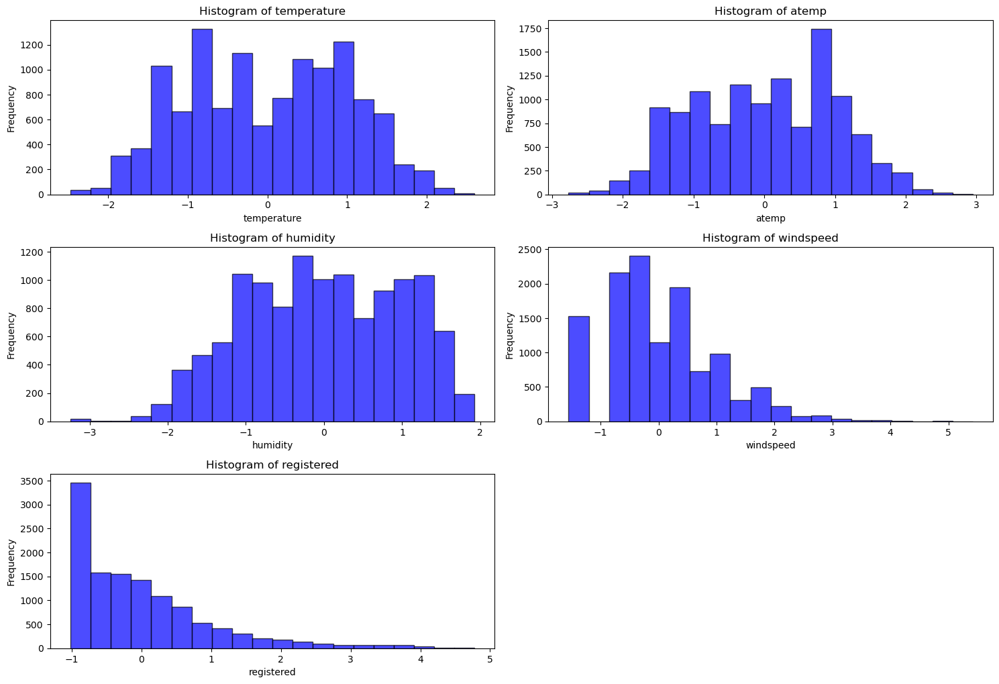

In [27]:
import matplotlib.pyplot as plt
# Select columns for histograms (exclude 'cnt' from X_train; plot it separately)
columns_to_plot = ['temperature', 'atemp', 'humidity', 'windspeed','registered']  # Numerical features in X_train

# Plot histograms for features in X_train
plt.figure(figsize=(15, 20))
for i, col in enumerate(columns_to_plot, start=1):
    plt.subplot(6, 2, i)
    plt.hist(X_train[col], bins=20, color='blue', alpha=0.7, edgecolor='black')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

### Insights from the Histograms

Temperature:
The distribution is roughly bell-shaped and slightly left-skewed, indicating most instances fall within moderate normalized temperature values.
This reflects a stable temperature distribution, with fewer extreme conditions.

Feels-like Temperature (atemp):
The histogram is symmetric and bell-shaped, showing a normal distribution around moderate normalized values.
This suggests that "feels-like" temperatures are distributed similarly to actual temperature, with most observations clustering near the mean.

Humidity:
The distribution is left-skewed, with most observations at moderate to high humidity levels.
This indicates that lower humidity levels are less common in the dataset.

Windspeed:
The histogram is heavily right-skewed, with a large proportion of data points at lower windspeed values.
This suggests that most hours had calm or minimal wind conditions, with fewer instances of high wind speeds.

Registered Users:
The distribution is strongly right-skewed, with a significant proportion of the data showing low counts of registered users.
This indicates that most bike rentals are associated with a smaller number of registered users, with a few peak hours showing high activity.

Overall Insights:

- Several features, like windspeed and registered users, show strong right-skewness, which might require transformations (e.g., log transformation) to improve model performance.
- Features like temperature and atemp are approximately normal, indicating a more balanced distribution.
- Observations reflect real-world conditions, such as high humidity being common and low windspeed prevailing most of the time.
- Outliers or extreme values in features like windspeed and registered users could significantly influence the predictive model and may need special handling.

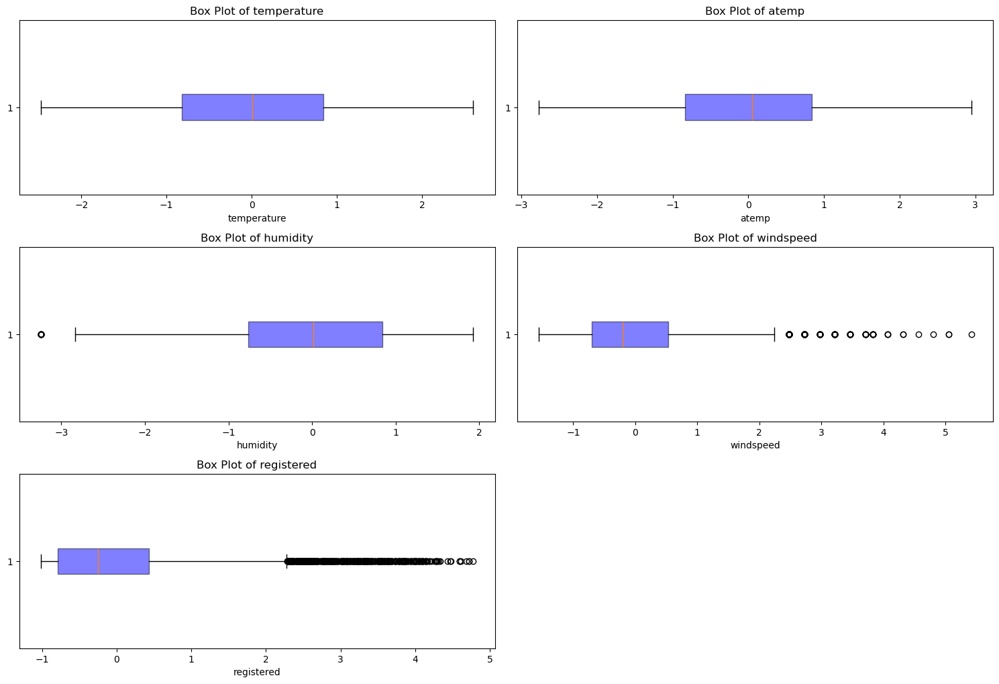

In [29]:
import matplotlib.pyplot as plt

columns_to_plot = ['temperature', 'atemp', 'humidity', 'windspeed', 'registered']

# Plot box plots for the specified variables in X_train
plt.figure(figsize=(15, 20))
for i, col in enumerate(columns_to_plot, start=1):
    plt.subplot(6, 2, i)  # Create a subplot grid with 6 rows and 2 columns
    plt.boxplot(X_train[col], vert=False, patch_artist=True, boxprops=dict(facecolor='blue', alpha=0.5))
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)

# Adjust layout to prevent overlap and show the plots
plt.tight_layout()
plt.show()

### Insights from the Box Plots

Temperature:

The temperature data is symmetrically distributed with no visible outliers.
The interquartile range (IQR) suggests most values are moderately distributed around the median, with a balanced spread.

Feels-like Temperature (atemp):

The distribution is very similar to the temperature, showing no significant outliers.
The data is centered with a narrow IQR, indicating consistency in the normalized "feels-like" temperature.

Humidity:

A few outliers exist on the lower end, suggesting rare instances of very low humidity.
Most of the data falls within a moderate to high humidity range, with a slightly wider IQR compared to temperature.

Windspeed:

There are several high-value outliers, indicating occasional instances of strong winds.
The majority of observations are concentrated in the lower range of wind speeds, with a smaller spread.

Registered Users:

The data exhibits numerous high-value outliers, representing peak usage hours by registered users.
The IQR indicates most data is concentrated at lower counts, but there is a long tail due to the presence of high rental periods.

Overall Insights:
- Outliers are prominent in windspeed and registered users, which may need to be addressed through transformations or robust scaling techniques.
- The consistent distribution of temperature and feels-like temperature suggests that these features are well-behaved and likely do not require preprocessing for outliers.
- The patterns in humidity and registered users reflect real-world variability and usage trends, highlighting the influence of environmental factors on bike rental behavior.

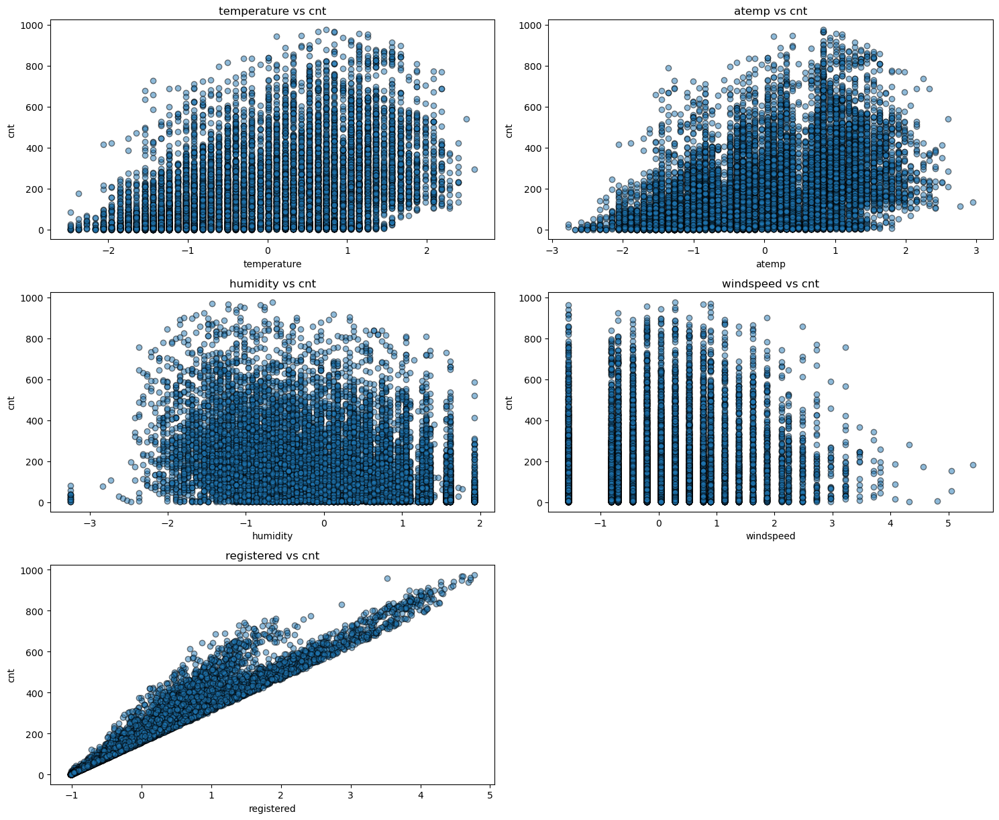

In [31]:
import matplotlib.pyplot as plt

# Select pairs of variables for scatter plots (adjusting for your dataset)
scatter_pairs = [
    ('temperature', 'cnt'),
    ('atemp', 'cnt'),
    ('humidity', 'cnt'),
    ('windspeed', 'cnt'),
    ('registered', 'cnt')
]

# Plot scatter plots for the selected pairs
plt.figure(figsize=(15, 20))
for i, (x_var, y_var) in enumerate(scatter_pairs, start=1):
    plt.subplot(5, 2, i)  # Create a subplot grid with 5 rows and 2 columns
    plt.scatter(X_train[x_var], y_train, alpha=0.5, edgecolor='k', label=f"{x_var} vs {y_var}")
    plt.xlabel(x_var)
    plt.ylabel(y_var)
    plt.title(f'{x_var} vs {y_var}')

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


### Insights from the Scatter Plots

1. Temperature vs. Total Rentals (cnt):
   - A positive relationship is observed between temperature and total rentals.
   - Rentals increase as the temperature rises, peaking at moderate temperatures and declining slightly at higher extremes, reflecting ideal conditions for biking.

2. Feels-like Temperature (`atemp`) vs. Total Rentals (cnt):
   - Similar to temperature, there is a strong positive trend between "feels-like" temperature and total rentals.
   - This indicates that users' perceived comfort significantly influences rental patterns, with more activity during moderate, pleasant weather.

3. Humidity vs. Total Rentals (cnt):
   - Rentals remain consistent across a range of humidity levels but show a slight decline at extreme high or low humidity values.
   - This suggests that very high humidity might deter users, while moderate levels are more favorable for biking.

4. Windspeed vs. Total Rentals (cnt):
   - A clear negative relationship exists between windspeed and total rentals.
   - As windspeed increases, rentals decrease significantly, highlighting that strong winds discourage biking activity.

5. Registered Users vs. Total Rentals (cnt):
   - A near-perfect linear relationship is evident between registered users and total rentals, as expected.
   - This shows that registered users account for a substantial and predictable portion of total rentals.

Overall Insights:
                                                                                                      
- Environmental factors like temperature and feels-like temperature are strong predictors of bike rentals, peaking at moderate conditions.
- Adverse conditions such as high humidity and windspeed negatively impact rental counts.
- Registered users dominate total rental behavior, indicating a predictable demand pattern, which can be leveraged for forecasting and fleet management.

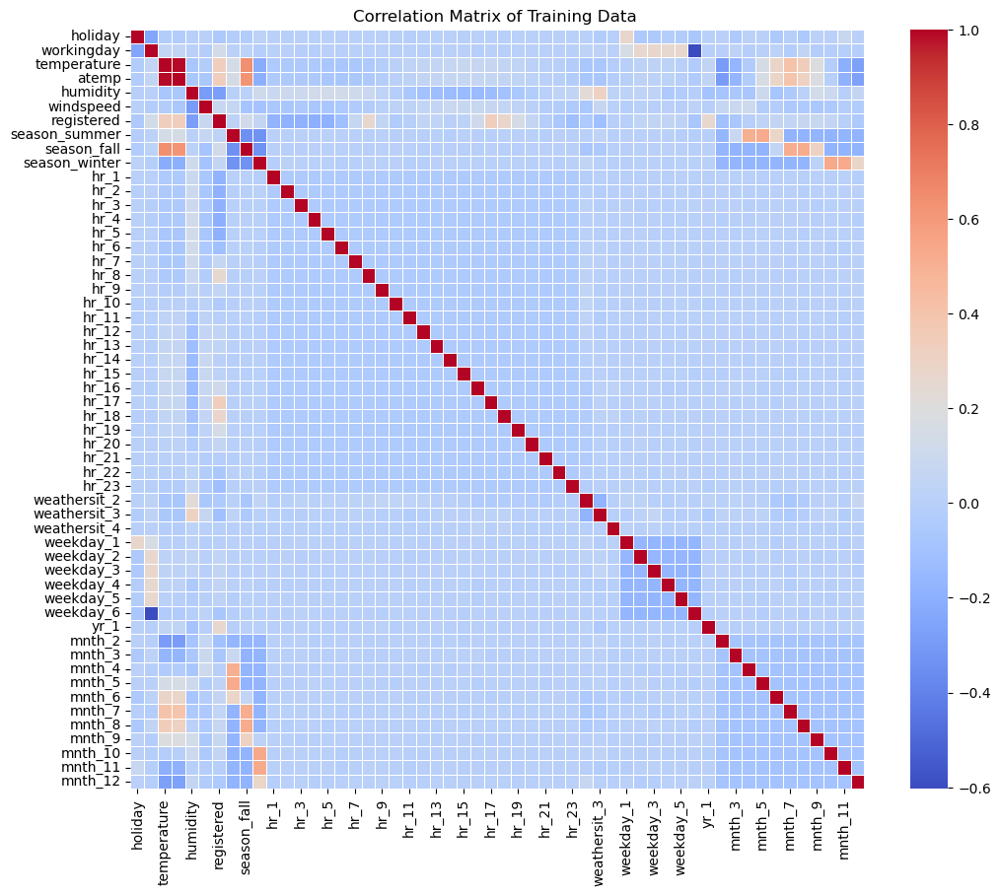

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the correlation matrix for the training dataset
correlation_matrix = X_train.corr()

# Plot the heatmap of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix, 
    annot=False,  # Remove numbers for a cleaner look
    fmt=".2f", 
    cmap="coolwarm", 
    cbar=True,
    linewidths=0.5  # Add gridlines for clarity
)
plt.title("Correlation Matrix of Training Data ")
plt.show()

In [34]:
X_train.corr()

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
holiday,1.000000,-0.247969,-0.026088,-0.029282,-0.005858,0.002460,-0.048193,-0.019563,-0.028035,0.020435,0.003906,-0.003452,0.000670,0.000064,-0.000632,0.005163,0.003088,0.003978,0.001928,-0.002380,-0.012087,0.002688,0.003833,0.000275,-0.004697,-0.001315,0.000733,-0.002719,0.002795,-0.001315,-0.005993,0.003616,0.001431,0.002089,-0.021573,-0.002174,0.272603,-0.047438,-0.047737,-0.016676,-0.020807,-0.069878,0.001396,0.006088,-0.051599,0.011660,0.010419,-0.050995,-0.002148,-0.052361,0.014218,0.005545,0.074030,0.005440
workingday,-0.247969,1.000000,0.052608,0.051251,0.010260,-0.016068,0.134148,0.011779,0.022090,-0.009661,-0.000519,0.006211,-0.012734,-0.008612,0.006598,-0.001787,0.004544,0.004459,0.005443,-0.006235,-0.000824,-0.002738,-0.007236,0.003880,0.009844,-0.008999,0.003117,-0.003909,0.002989,0.009316,0.003858,0.003211,-0.004020,0.025428,0.028083,0.008769,0.158429,0.265889,0.271237,0.261018,0.262138,-0.602641,-0.003934,-0.004822,0.027553,-0.012403,0.007133,0.018223,-0.014508,0.045945,-0.014182,-0.007938,-0.013752,-0.010689
temperature,-0.026088,0.052608,1.000000,0.988169,-0.075808,-0.023870,0.334526,0.141887,0.641606,-0.220102,-0.044824,-0.049733,-0.048851,-0.048359,-0.069742,-0.070176,-0.059986,-0.049648,-0.016993,0.005858,0.030567,0.046167,0.058766,0.066168,0.074968,0.070066,0.068075,0.047639,0.038423,0.016900,0.001271,-0.007094,-0.028642,-0.076746,-0.060354,-0.019131,-0.007201,0.022460,0.024438,0.018525,-0.000102,-0.034652,0.042773,-0.294046,-0.168426,-0.039185,0.153778,0.291516,0.406471,0.337530,0.187354,-0.016965,-0.204553,-0.276767
atemp,-0.029282,0.051251,0.988169,1.000000,-0.059310,-0.062034,0.331680,0.149335,0.619526,-0.201431,-0.044018,-0.047846,-0.046697,-0.046305,-0.067672,-0.069578,-0.059142,-0.047345,-0.014705,0.004891,0.029316,0.045127,0.056549,0.063303,0.072478,0.065883,0.062084,0.044195,0.037897,0.018052,0.004993,-0.004950,-0.027060,-0.073002,-0.067857,-0.019691,-0.002528,0.024949,0.021629,0.018480,-0.007685,-0.034606,0.041106,-0.294106,-0.166557,-0.029188,0.157843,0.283698,0.402378,0.315597,0.181552,-0.004941,-0.194748,-0.268878
humidity,-0.005858,0.010260,-0.075808,-0.059310,1.000000,-0.294989,-0.277949,0.001744,0.016803,0.115906,0.087510,0.096646,0.095825,0.124052,0.129811,0.125538,0.116573,0.083447,0.035779,-0.009795,-0.062828,-0.100062,-0.124065,-0.134743,-0.142124,-0.142353,-0.130295,-0.101371,-0.063337,-0.030683,0.003913,0.035621,0.046323,0.227356,0.305470,0.017747,0.017585,0.034509,0.034488,-0.048105,-0.026940,-0.009314,-0.089438,-0.084593,-0.063110,-0.065977,0.100588,-0.078049,-0.045736,0.015698,0.131742,0.097976,-0.004504,0.058805
windspeed,0.002460,-0.016068,-0.023870,-0.062034,-0.294989,1.000000,0.078674,0.063160,-0.087522,-0.091056,-0.059156,-0.064569,-0.049078,-0.070229,-0.064296,-0.052617,-0.037777,-0.022973,0.001410,0.018609,0.025457,0.050966,0.051516,0.085201,0.077028,0.076522,0.073426,0.052552,0.031916,0.006685,-0.019596,-0.026468,-0.041092,-0.061301,0.070152,0.002054,-0.013879,-0.001249,-0.005008,0.006045,-0.006168,0.021820,-0.005550,0.063744,0.086942,0.110649,-0.020660,-0.018543,-0.056248,-0.044557,-0.058135,-0.045640,-0.018195,-0.031490
registered,-0.048193,0.134148,0.334526,0.331680,-0.277949,0.078674,1.000000,0.024782,0.126563,0.060479,-0.177027,-0.189333,-0.188336,-0.203320,-0.187379,-0.113299,0.063220,0.258706,0.054020,-0.034534,-0.005863,0.043479,0.040909,0.009311,0.023216,0.112647,0.333871,0.276569,0.153680,0.055055,-0.013472,-0.062586,-0.115120,-0.040275,-0.112786,-0.004932,-0.003421,0.040216,0.046528,0.044555,0.028662,-0.070939,0.263547,-0.103519,-0.065956,-0.007381,

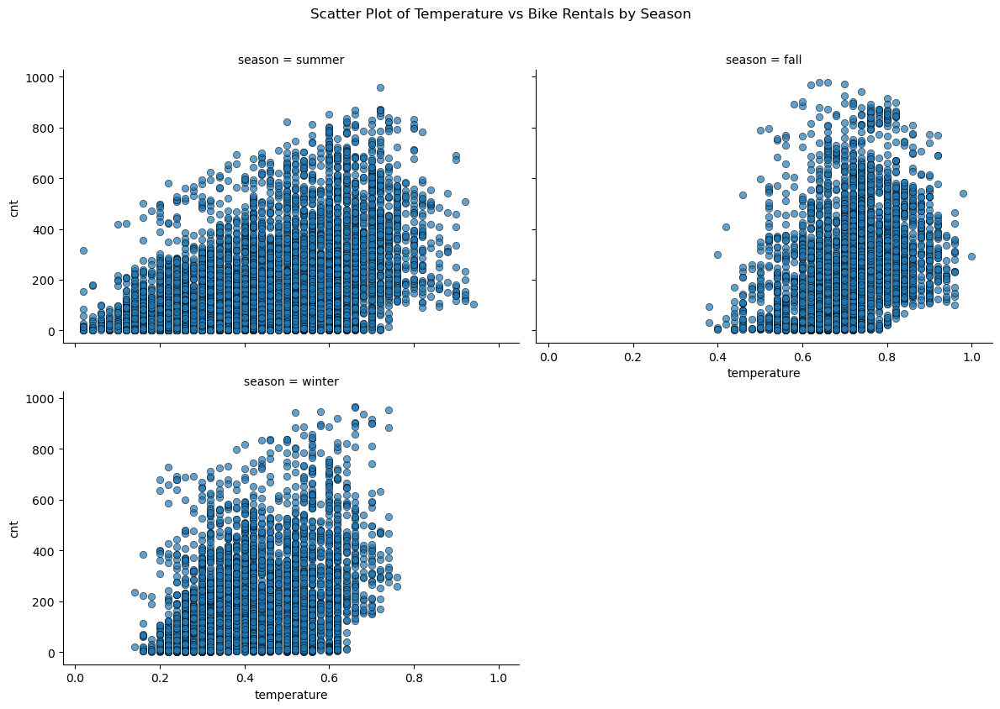

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a single 'season' column from the one-hot encoded columns
df_day_encoded['season'] = (
    df_day_encoded[['season_summer', 'season_fall', 'season_winter']]
    .idxmax(axis=1)
    .str.replace('season_', '')  # Extracts season names like 'spring', 'summer'
)

# Use FacetGrid to create scatter plots for 'cnt' vs 'temperature' grouped by 'season'
g = sns.FacetGrid(df_day_encoded, col="season", col_wrap=2, height=4, aspect=1.5)

# Scatter plots for 'cnt' (target) vs 'temperature' grouped by seasons
g.map(sns.scatterplot, "temperature", "cnt", alpha=0.7, edgecolor="k")

# Add a title to the FacetGrid
g.fig.suptitle("Scatter Plot of Temperature vs Bike Rentals by Season", y=1.05)

# Show the plots
plt.show()


Purpose
The plot examines how temperature influences bike rentals across seasons to reveal seasonal variations in demand.

Insights
1. Summer: Strong positive correlation; rentals peak at higher temperatures.  
2. Fall: Moderate correlation; rentals cluster at moderate temperatures.  
3. Winter: Weak correlation; fewer rentals at lower temperatures.

Conclusion
Temperature impacts bike rentals in all seasons, with the strongest effect in summer. Seasonal trends guide fleet and marketing strategies.v

In [37]:
# Function to remove outliers using IQR
def remove_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)  # First quartile
        Q3 = df[col].quantile(0.75)  # Third quartile
        IQR = Q3 - Q1               # Interquartile range
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Remove rows with outliers
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

# List of numerical columns to check for outliers in X_train
columns_to_check = ['temperature', 'atemp', 'humidity', 'windspeed']

# Remove outliers from X_train
X_train_cleaned = remove_outliers_iqr(X_train.copy(), columns_to_check)

# Remove outliers from y_train using the index of the cleaned X_train
y_train_cleaned = y_train.loc[X_train_cleaned.index]

# Display the cleaned data shapes
print(f"Original shape of X_train: {X_train.shape}")
print(f"Shape of X_train after outlier removal: {X_train_cleaned.shape}")
print(f"Shape of y_train after outlier removal: {y_train_cleaned.shape}")


Original shape of X_train: (12165, 54)
Shape of X_train after outlier removal: (11917, 54)
Shape of y_train after outlier removal: (11917,)


In [38]:
# Function to remove outliers using IQR
def remove_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)  # First quartile
        Q3 = df[col].quantile(0.75)  # Third quartile
        IQR = Q3 - Q1               # Interquartile range
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Remove rows with outliers
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

# List of numerical columns to check for outliers in X_train
columns_to_check = ['temperature', 'atemp', 'humidity', 'windspeed']

# Remove outliers from X_train
X_test_cleaned = remove_outliers_iqr(X_test.copy(), columns_to_check)

# Remove outliers from y_train using the index of the cleaned X_train
y_test_cleaned = y_test.loc[X_test_cleaned.index]

# Display the cleaned data shapes
print(f"Original shape of X_test: {X_test.shape}")
print(f"Shape of X_test after outlier removal: {X_test_cleaned.shape}")
print(f"Shape of y_test after outlier removal: {y_test_cleaned.shape}")


Original shape of X_test: (5214, 54)
Shape of X_test after outlier removal: (5099, 54)
Shape of y_test after outlier removal: (5099,)


## 5. Assumptions of Regression Models

Creating graph for holiday:


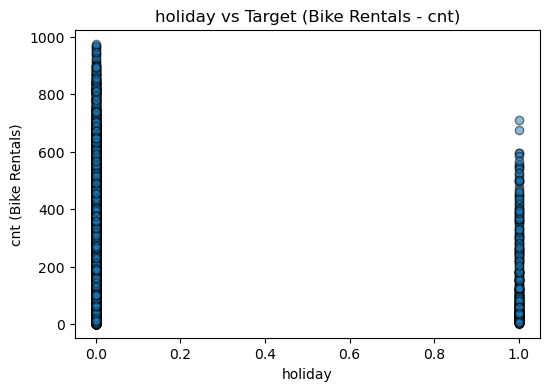

Creating graph for workingday:


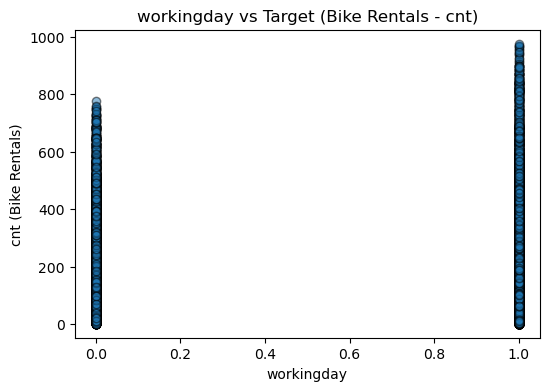

Creating graph for temperature:


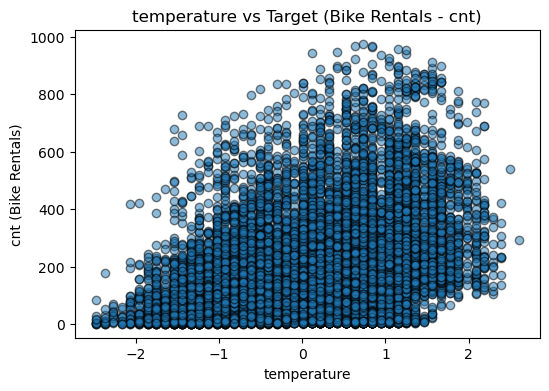

Creating graph for atemp:


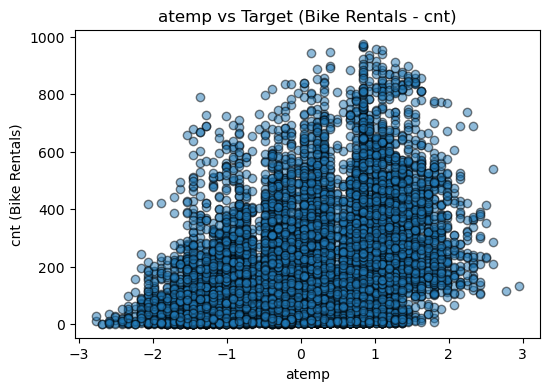

Creating graph for humidity:


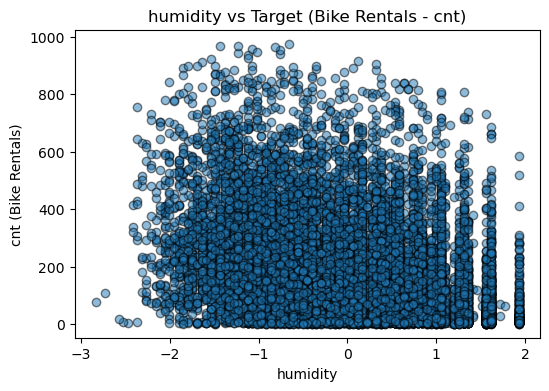

Creating graph for windspeed:


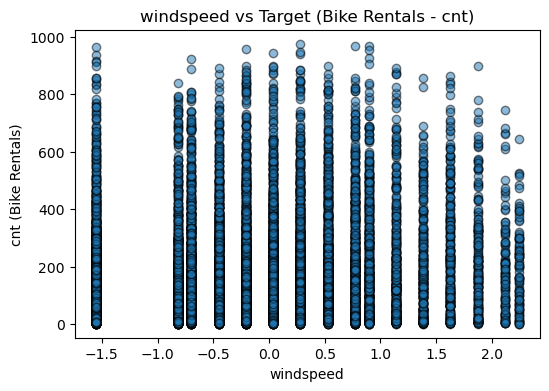

Creating graph for registered:


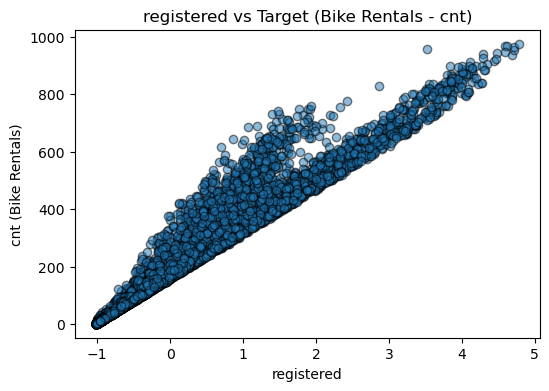

Creating graph for season_summer:


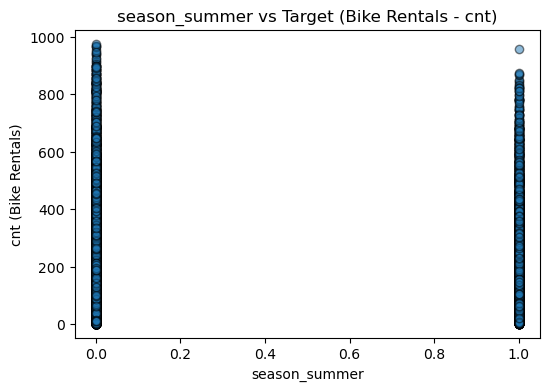

Creating graph for season_fall:


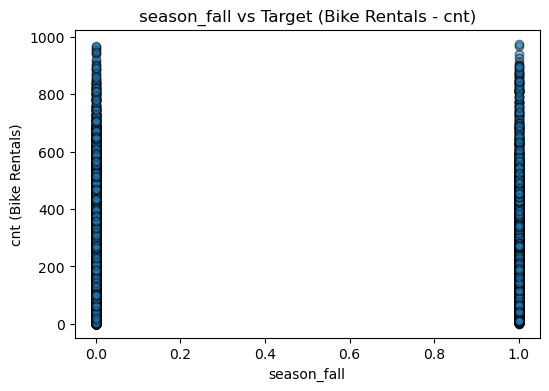

Creating graph for season_winter:


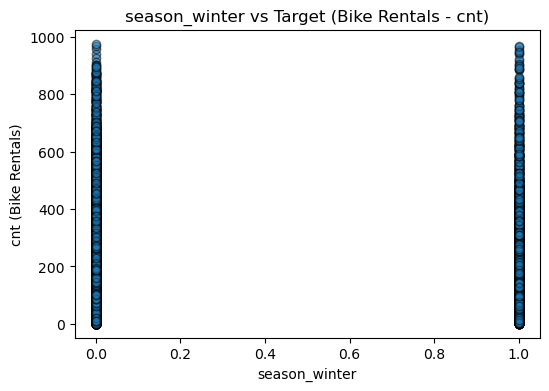

Creating graph for hr_1:


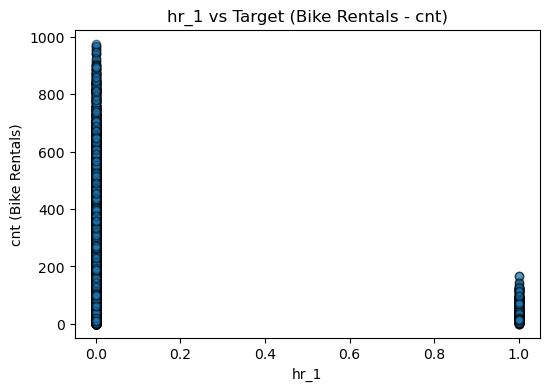

Creating graph for hr_2:


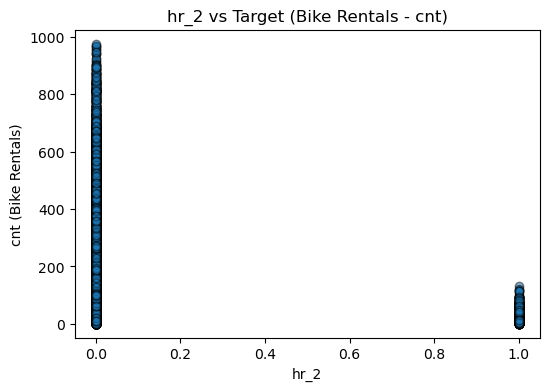

Creating graph for hr_3:


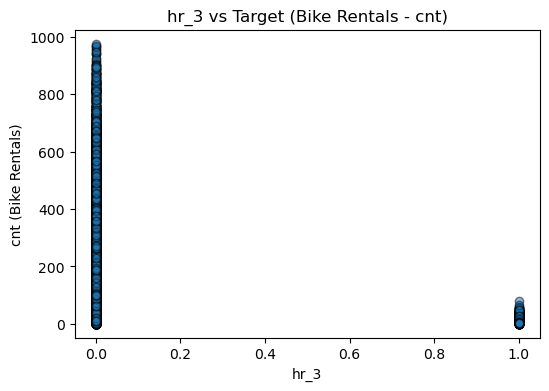

Creating graph for hr_4:


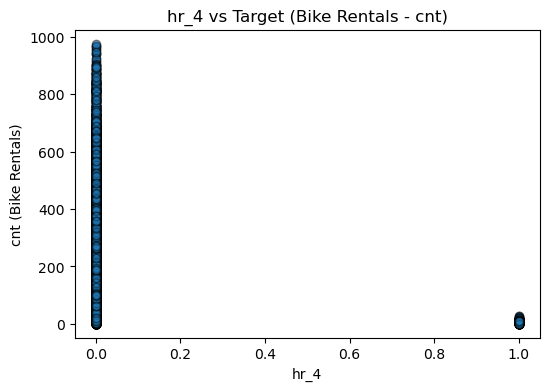

Creating graph for hr_5:


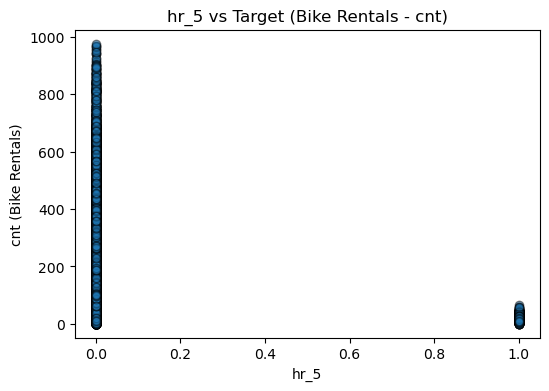

Creating graph for hr_6:


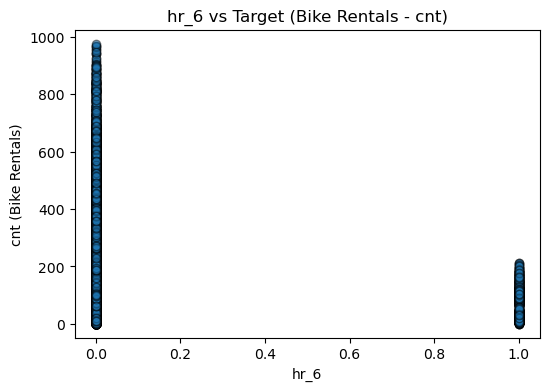

Creating graph for hr_7:


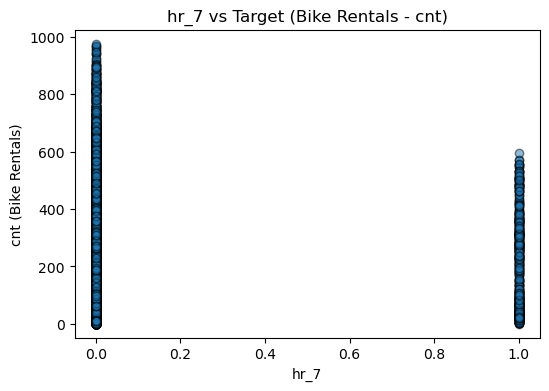

Creating graph for hr_8:


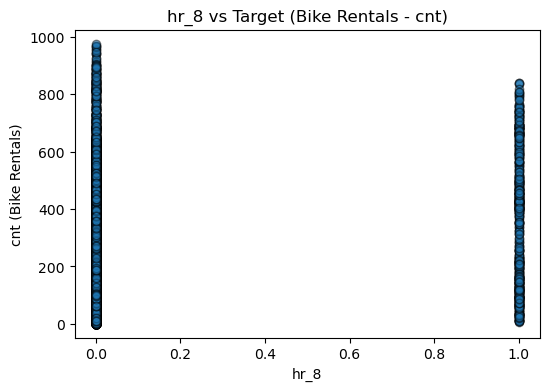

Creating graph for hr_9:


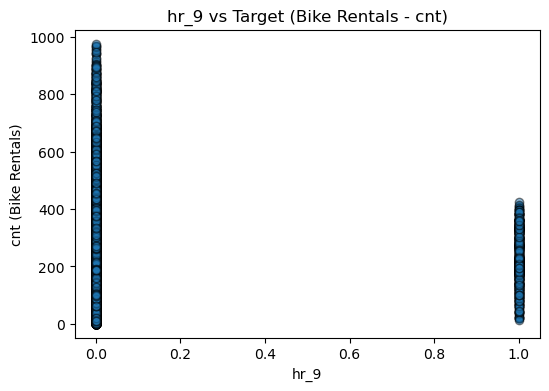

Creating graph for hr_10:


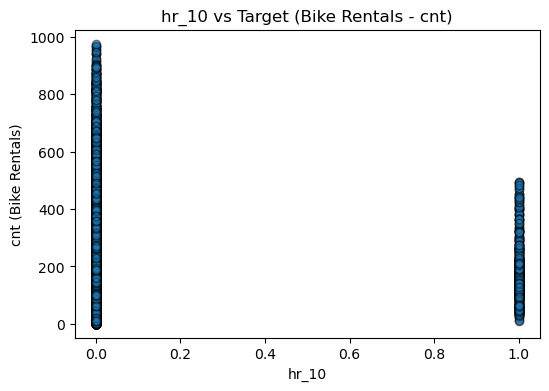

Creating graph for hr_11:


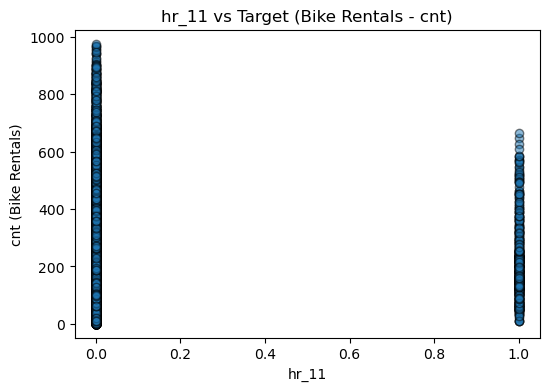

Creating graph for hr_12:


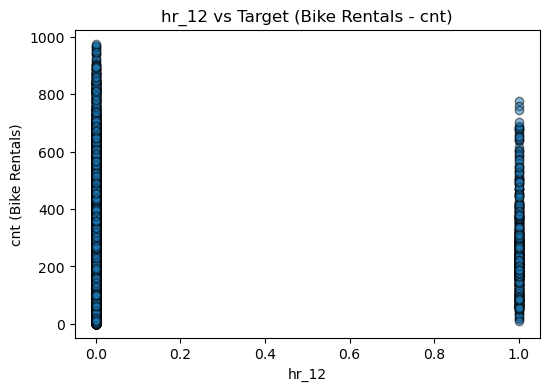

Creating graph for hr_13:


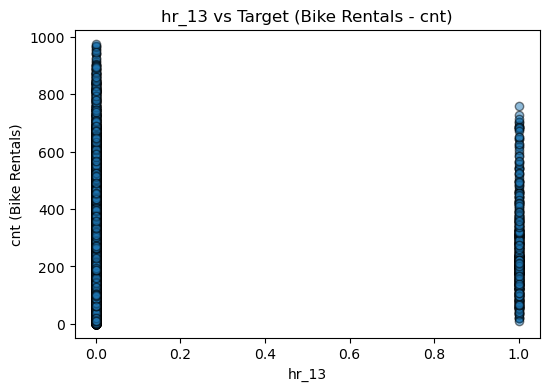

Creating graph for hr_14:


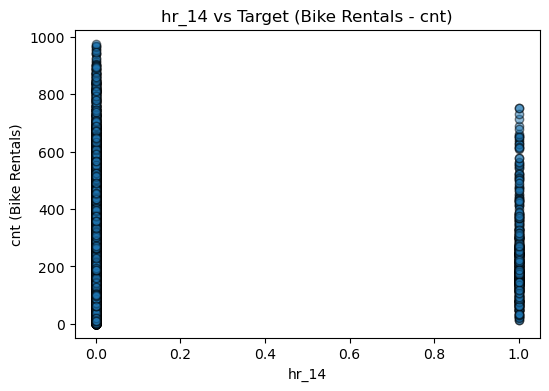

Creating graph for hr_15:


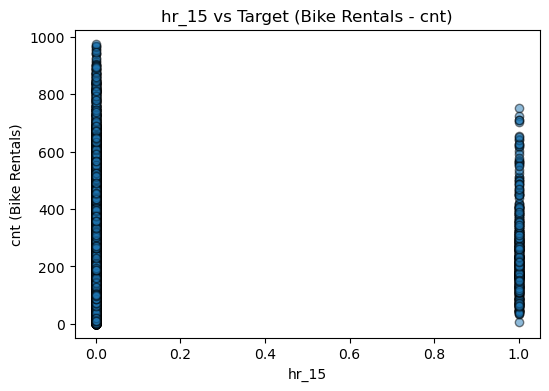

Creating graph for hr_16:


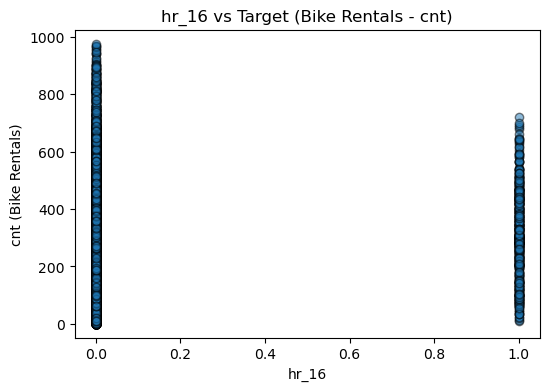

Creating graph for hr_17:


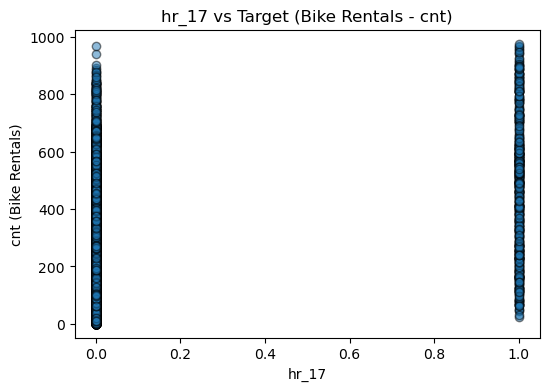

Creating graph for hr_18:


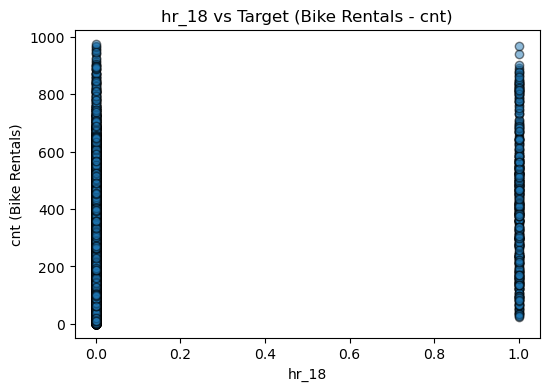

Creating graph for hr_19:


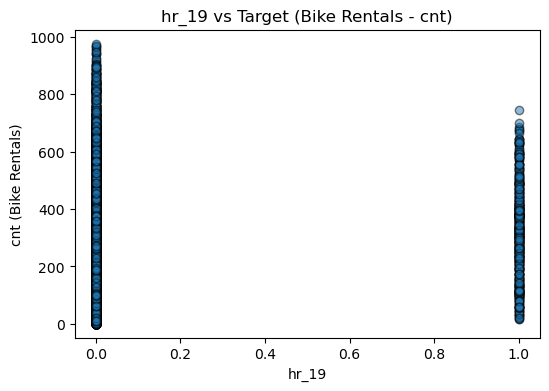

Creating graph for hr_20:


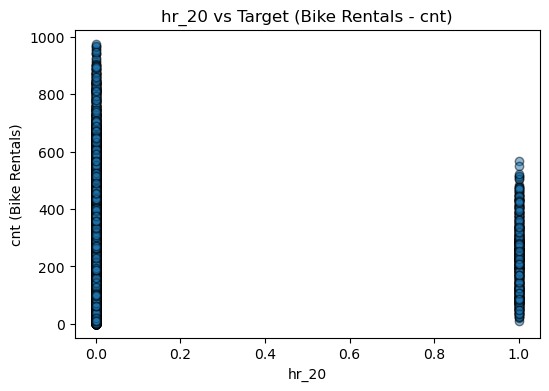

Creating graph for hr_21:


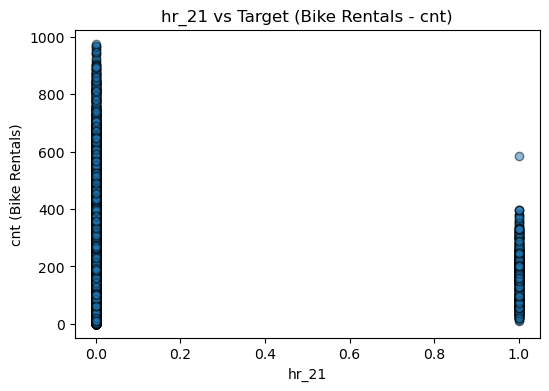

Creating graph for hr_22:


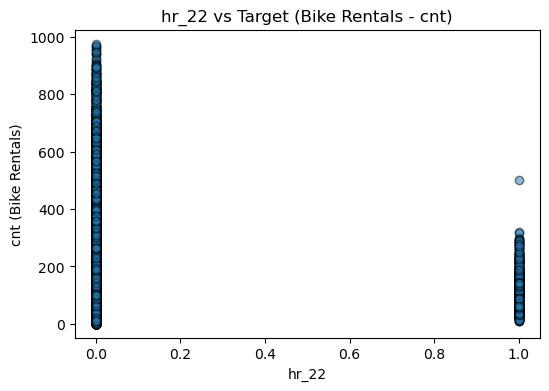

Creating graph for hr_23:


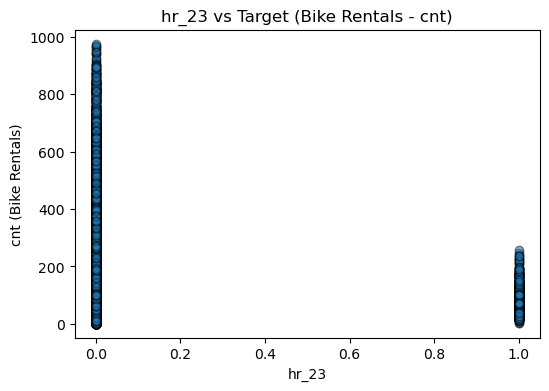

Creating graph for weathersit_2:


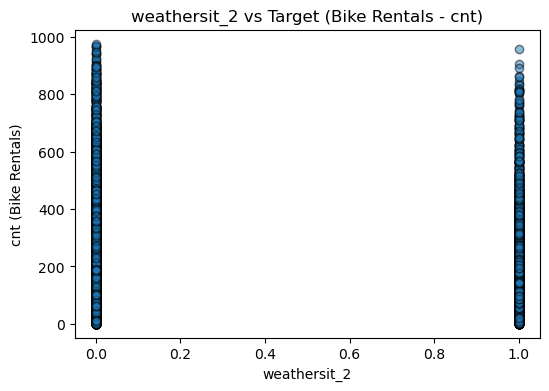

Creating graph for weathersit_3:


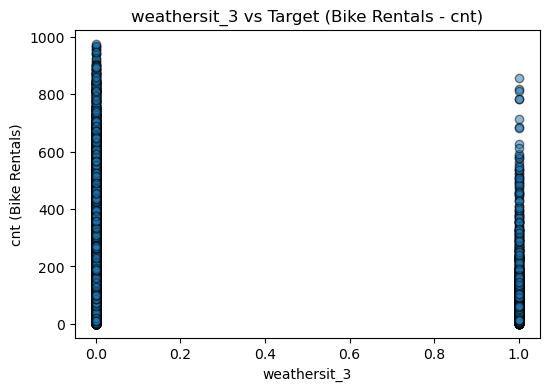

Creating graph for weathersit_4:


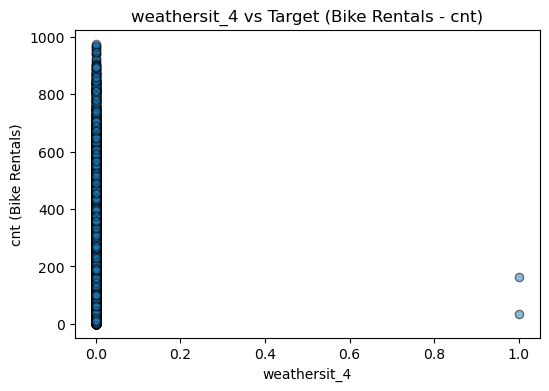

Creating graph for weekday_1:


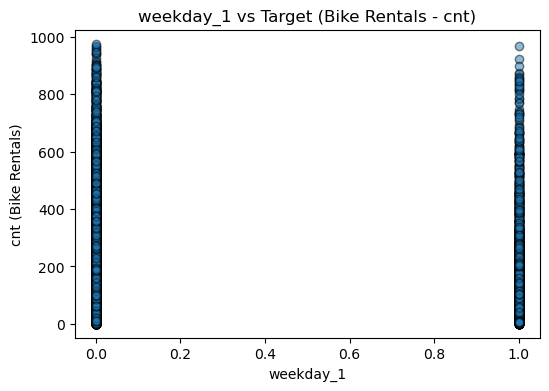

Creating graph for weekday_2:


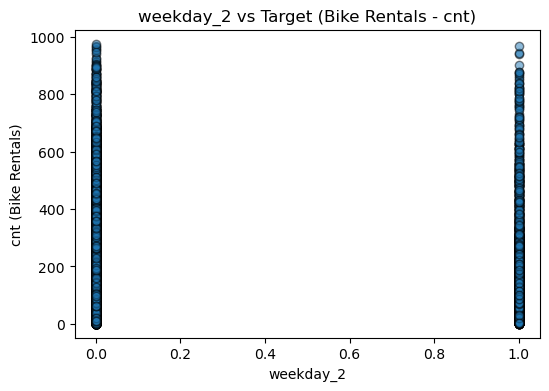

Creating graph for weekday_3:


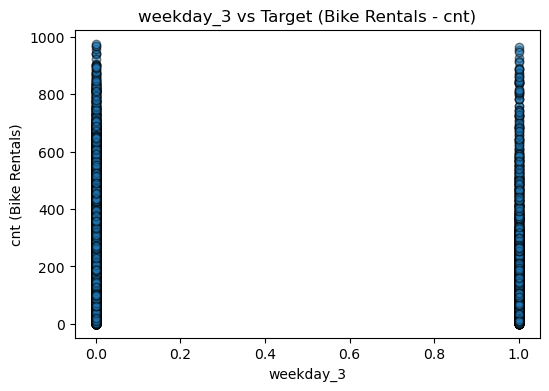

Creating graph for weekday_4:


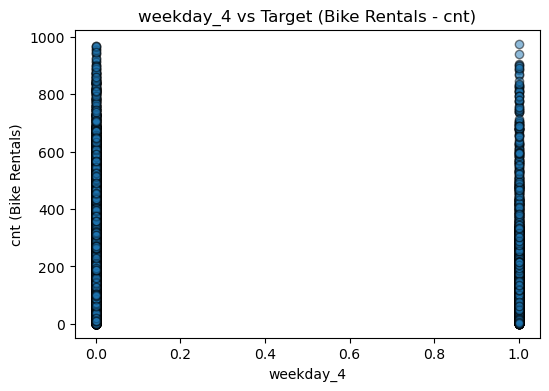

Creating graph for weekday_5:


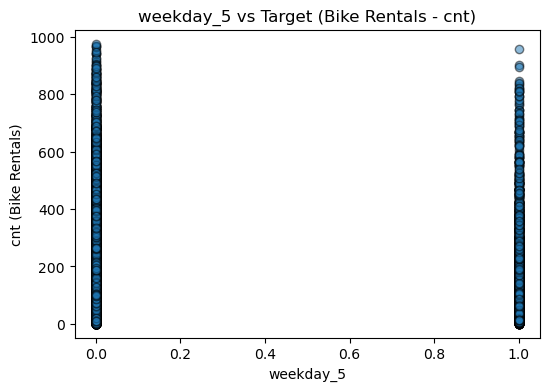

Creating graph for weekday_6:


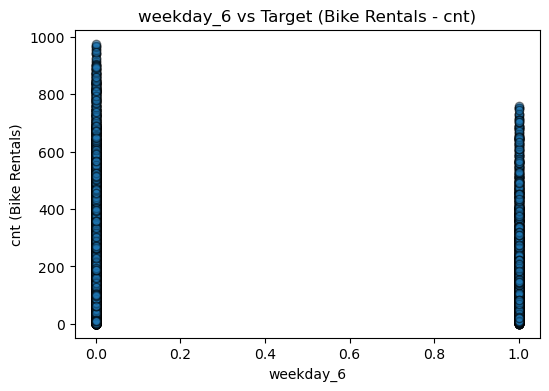

Creating graph for yr_1:


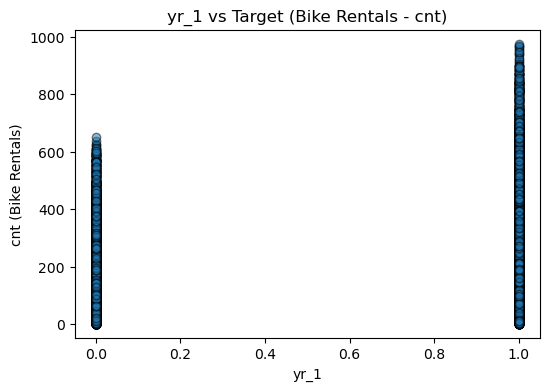

Creating graph for mnth_2:


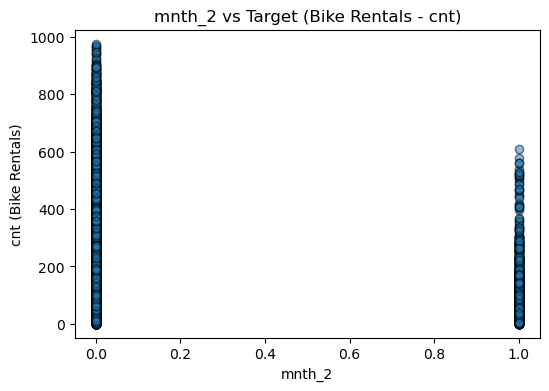

Creating graph for mnth_3:


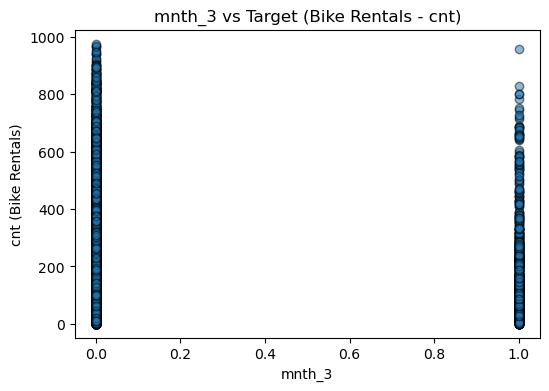

Creating graph for mnth_4:


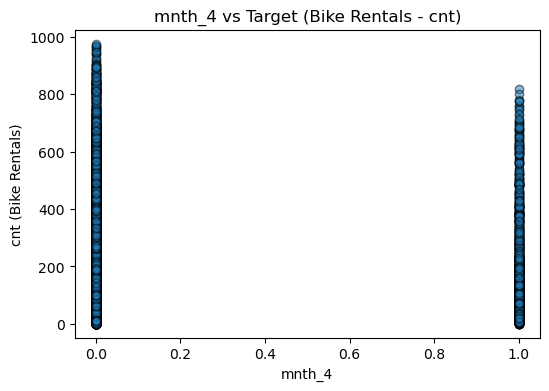

Creating graph for mnth_5:


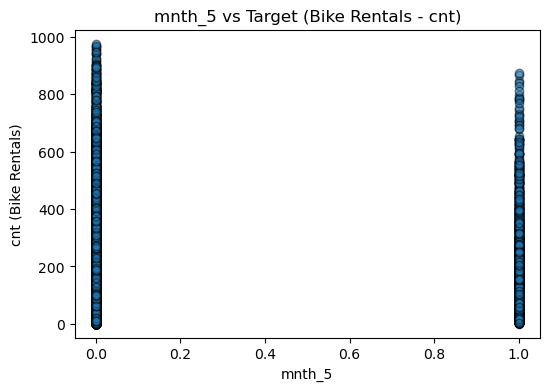

Creating graph for mnth_6:


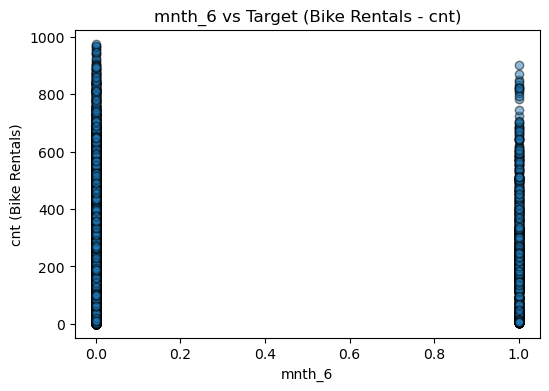

Creating graph for mnth_7:


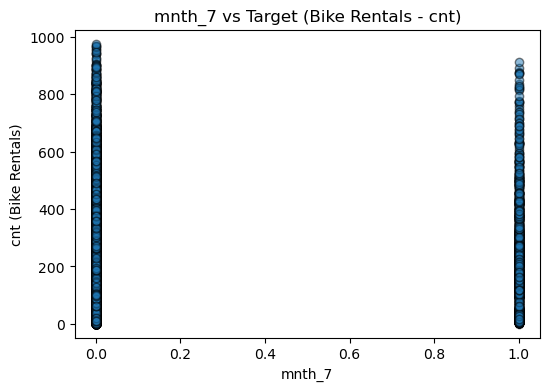

Creating graph for mnth_8:


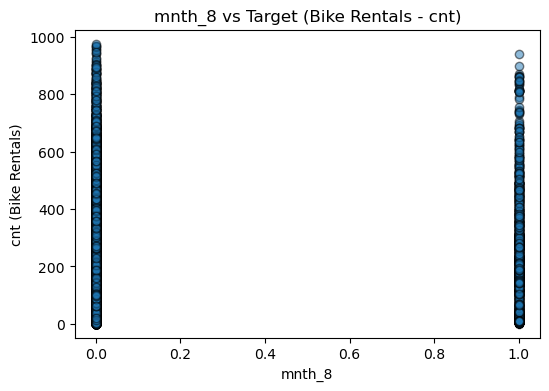

Creating graph for mnth_9:


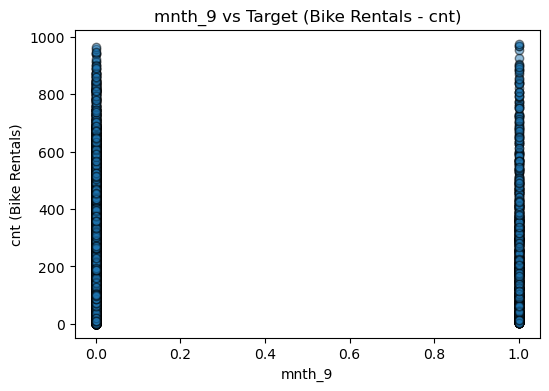

Creating graph for mnth_10:


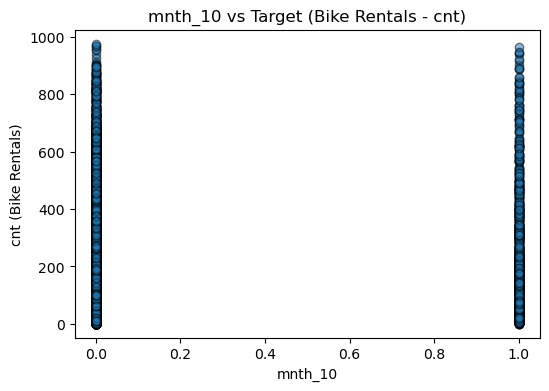

Creating graph for mnth_11:


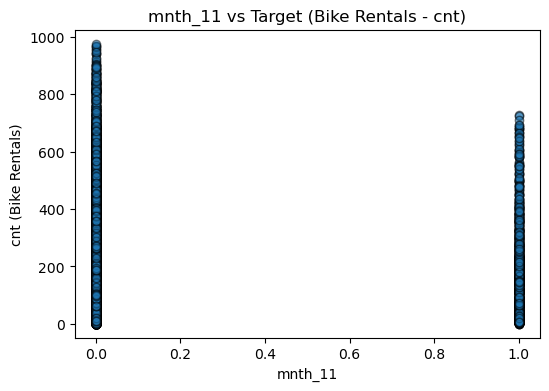

Creating graph for mnth_12:


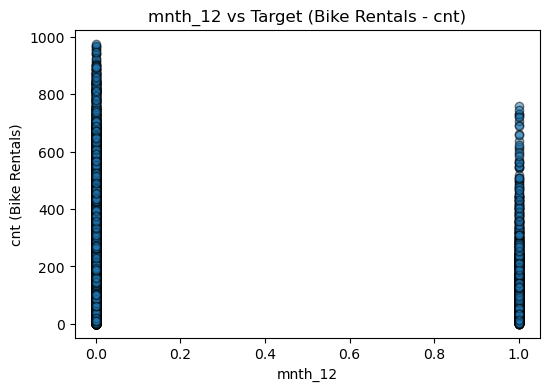

In [40]:
# 1. Linear 
# Scatter plot to check linearity between features and the target variable (y_train_cleaned)
for col in X_train_cleaned.columns:
    print(f"Creating graph for {col}:")
    plt.figure(figsize=(6, 4))
    plt.scatter(X_train_cleaned[col], y_train_cleaned, alpha=0.5, edgecolor='k')
    plt.title(f'{col} vs Target (Bike Rentals - cnt)')
    plt.xlabel(col)
    plt.ylabel('cnt (Bike Rentals)')
    plt.show()

The above graphs clearly demonstrate the presence of linear relationships between the features and the target variable.

In [42]:
X_train_cleaned['weekday_1'].shape

(11917,)

In [43]:
y_train_cleaned

11229      9
6334     209
11060     30
12346    644
15437    217
        ... 
11284    359
11964    812
5390     189
860      100
15795    779
Name: cnt, Length: 11917, dtype: int64

From the above graphs, it's evident that:

- There are clear linear relationships between continuous features such as temperature and atemp with the target variable (cnt), indicating that higher temperatures are generally associated with an increase in bike rentals.
- Features like humidity and windspeed show weaker or no apparent linear trends with the target, suggesting they might have a non-linear influence on bike rentals.
- For binary variables such as season_spring, weather_clear, and workingday, the scatter plots show discrete clusters at 0 and 1. These variables can help differentiate bike rental trends based on categorical factors like season or weather.

In [45]:
# 2. Independence

from statsmodels.stats.stattools import durbin_watson
import statsmodels.api as sm

# Add a constant to the features (X_train_cleaned)
X_train_const = sm.add_constant(X_train_cleaned)

# Fit a linear regression model
model = sm.OLS(y_train_cleaned, X_train_const).fit()

# Calculate the Durbin-Watson statistic for independence of residuals
dw_stat = durbin_watson(model.resid)

# Display the Durbin-Watson statistic
print(f'Durbin-Watson Statistic: {dw_stat}')


Durbin-Watson Statistic: 1.9987042490530753


Interpretation:
With a value near 2, the Durbin-Watson statistic suggests minimal autocorrelation in the residuals. This confirms that the regression model meets the independence requirement for observations.

Conclusion:
The residuals are independent, satisfying the independence assumption necessary for linear regression. The analysis can proceed without adjustments for autocorrelation.








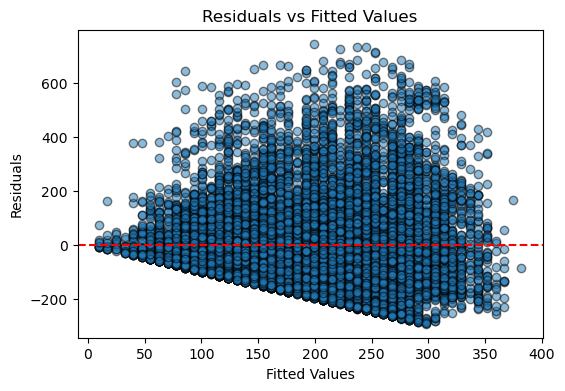

In [47]:
#3. Homoscedasticity
# Predictor and target variables
X_simple = X_train_cleaned[['temperature']]  # Predictor
y_simple = y_train_cleaned  # Target

# Fit the linear regression model
from sklearn.linear_model import LinearRegression
simple_model = LinearRegression().fit(X_simple, y_simple)

# Predictions, residuals, and fitted values
y_pred = simple_model.predict(X_simple)  # Predicted values
residuals = y_simple - y_pred            # Residuals
fitted = y_pred                          # Fitted values

# Plot residuals vs fitted values to check for homoscedasticity
plt.figure(figsize=(6, 4))
plt.scatter(fitted, residuals, alpha=0.5, edgecolor='k')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

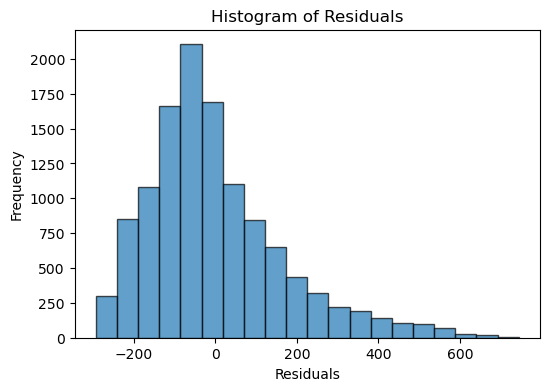

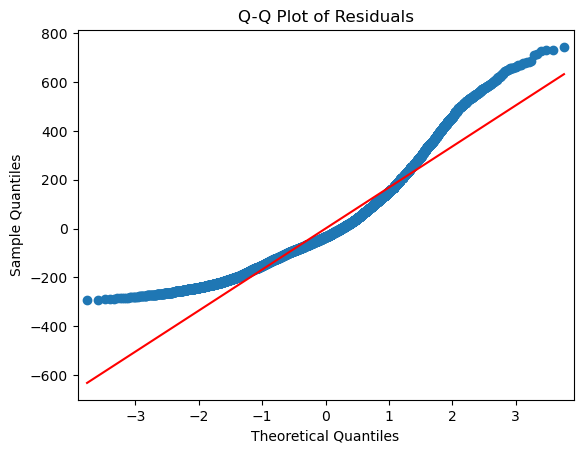

In [48]:
# 4. Normality

# Histogram
plt.figure(figsize=(6, 4))
plt.hist(residuals, bins=20, edgecolor='k', alpha=0.7)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Q-Q Plot
sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

In [49]:
# 5. Multicollinearity
import numpy as np

# Function to remove highly correlated columns
def remove_highly_correlated_columns(df, threshold=0.85):
    correlation_matrix = df.corr().abs()  # Compute absolute correlation matrix
    upper_triangle = correlation_matrix.where(
        np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
    )  # Select the upper triangle of the correlation matrix

    # Find columns with correlation above the threshold
    to_drop = [
        column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)
    ]
    return df.drop(columns=to_drop), to_drop

# Apply the function to remove highly correlated columns
X_train_cleaned_reduced, removed_columns = remove_highly_correlated_columns(X_train_cleaned, threshold=0.85)

# Display the results
print(f"Removed columns with correlation greater than 85%: {removed_columns}")
print(f"New shape of X_train_cleaned: {X_train_cleaned_reduced.shape}")

Removed columns with correlation greater than 85%: ['atemp']
New shape of X_train_cleaned: (11917, 53)


## 6. Regression Models and Evaluations 

### 1. Simple Linear Regression 

In [52]:
import statsmodels.api as sm
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Selecting the predictor (independent variable) and target (dependent variable) for training
X_simple_train = X_train_cleaned[['temperature']]  # Predictor variable
y_simple_train = y_train_cleaned                   # Target variable (bike rentals - cnt)

# K-Fold Cross-Validation 
# Initialize K-Fold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Add constant to predictors for OLS
X_cv = sm.add_constant(X_simple_train.values)
y_cv = y_simple_train.values

# Store metrics for each fold
r2_scores = []
mse_scores = []

# Perform K-Fold Cross-Validation
for train_index, test_index in kf.split(X_cv):
    # Split data into training and testing for the current fold
    X_train_fold, X_test_fold = X_cv[train_index], X_cv[test_index]
    y_train_fold, y_test_fold = y_cv[train_index], y_cv[test_index]

    # Fit the OLS model
    model = sm.OLS(y_train_fold, X_train_fold).fit()

    # Predict on the test fold
    y_pred_fold = model.predict(X_test_fold)

    # Calculate metrics for the fold
    r2 = r2_score(y_test_fold, y_pred_fold)
    mse = mean_squared_error(y_test_fold, y_pred_fold)

    r2_scores.append(r2)
    mse_scores.append(mse)

# Print Cross-Validation Results
print("K-Fold Cross-Validation Results:")
print(f"Mean R²: {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")
print(f"Mean MSE: {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")


K-Fold Cross-Validation Results:
Mean R²: 0.1602 ± 0.0098
Mean MSE: 28213.2221 ± 637.1559


                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.161
Model:                            OLS   Adj. R-squared:                  0.161
Method:                 Least Squares   F-statistic:                     2280.
Date:                Tue, 26 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:43:40   Log-Likelihood:                -77968.
No. Observations:               11917   AIC:                         1.559e+05
Df Residuals:                   11915   BIC:                         1.560e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const         191.1614      1.539    124.245      

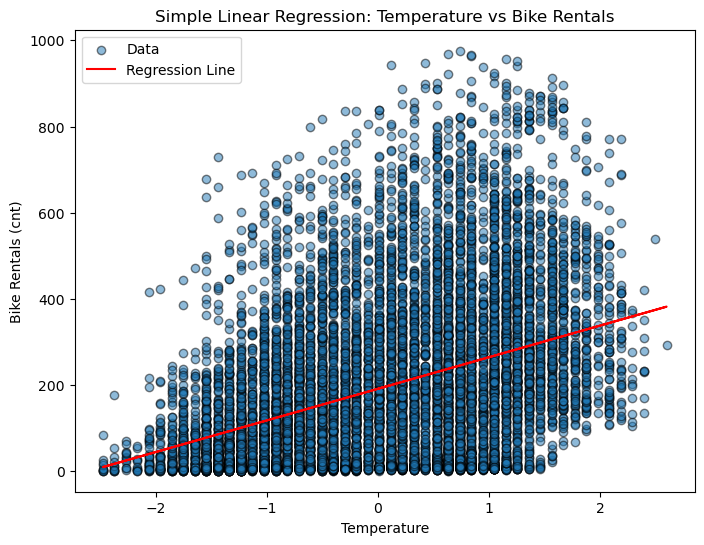

In [53]:
#1. linear regression 

import statsmodels.api as sm

# Selecting the predictor (independent variable) and target (dependent variable)
X_simple = X_train_cleaned_reduced[['temperature']]  # Predictor variable
y_simple = y_train_cleaned                   # Target variable (cnt - bike rentals)

# Add a constant term for the intercept
X_simple_const = sm.add_constant(X_simple)

# Fit the simple linear regression model
model_simple = sm.OLS(y_simple, X_simple_const).fit()

# Display the summary of the regression model
print(model_simple.summary())

# Visualization: Regression line
plt.figure(figsize=(8, 6))
plt.scatter(X_simple, y_simple, alpha=0.5, label='Data', edgecolor='k')
plt.plot(X_simple, model_simple.predict(X_simple_const), color='red', label='Regression Line')
plt.title('Simple Linear Regression: Temperature vs Bike Rentals')
plt.xlabel('Temperature')
plt.ylabel('Bike Rentals (cnt)')
plt.legend()
plt.show()



Train Set Evaluation:
Root Mean Squared Error (RMSE): 167.9418
R-squared (R²): 0.1606

Test Set Evaluation:
Root Mean Squared Error (RMSE): 162.7146
R-squared (R²): 0.1645


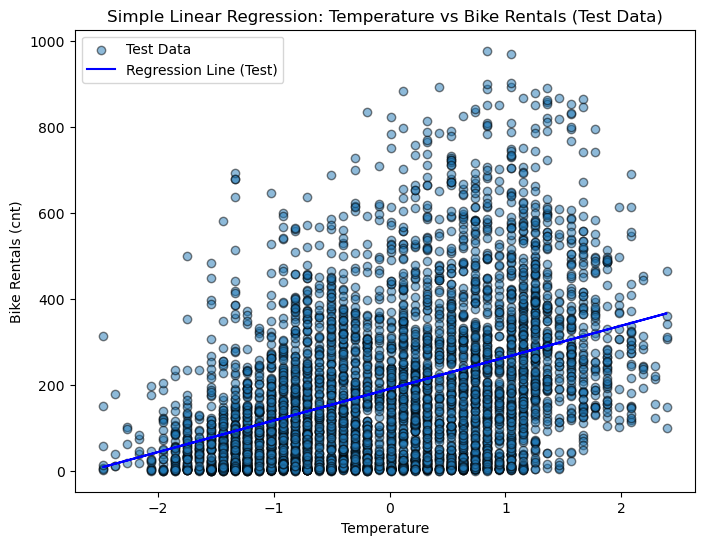

In [54]:
# --- Evaluate on Test Set ---
X_simple_test = X_test_cleaned[['temperature']]  # Predictor variable for the test set
y_simple_test = y_test_cleaned                   # Target variable for the test set
X_simple_test_const = sm.add_constant(X_simple_test)  # Add constant term

# Predict on the test set using the simple linear regression model
y_test_pred = model_simple.predict(X_simple_test_const)
y_train_pred = model_simple.predict(X_simple_const)

# Calculate evaluation metrics for the training set
train_rmse_sl = np.sqrt(mean_squared_error(y_simple_train, y_train_pred))
train_r2_sl = r2_score(y_simple_train, y_train_pred)

print(f"\nTrain Set Evaluation:")
print(f"Root Mean Squared Error (RMSE): {train_rmse_sl:.4f}")
print(f"R-squared (R²): {train_r2_sl:.4f}")

# Calculate evaluation metrics for the test set
test_rmse_sl = np.sqrt(mean_squared_error(y_simple_test, y_test_pred))
test_r2_sl = r2_score(y_simple_test, y_test_pred)

print(f"\nTest Set Evaluation:")
print(f"Root Mean Squared Error (RMSE): {test_rmse_sl:.4f}")
print(f"R-squared (R²): {test_r2_sl:.4f}")

# Visualization: Regression line (test data)
plt.figure(figsize=(8, 6))
plt.scatter(X_simple_test, y_simple_test, alpha=0.5, label='Test Data', edgecolor='k')
plt.plot(X_simple_test, y_test_pred, color='blue', label='Regression Line (Test)')
plt.title('Simple Linear Regression: Temperature vs Bike Rentals (Test Data)')
plt.xlabel('Temperature')
plt.ylabel('Bike Rentals (cnt)')
plt.legend()
plt.show()


## 2. Multilinear Regression 

In [56]:
X_train_cleaned

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
11229,0,1,0.010056,0.046265,-1.073271,0.037231,-0.964004,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
6334,0,1,0.942327,0.925809,0.840769,-0.206991,0.037683,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
11060,0,1,-0.818629,-1.008492,-1.383656,1.872174,-0.872346,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
12346,0,0,1.045913,0.925809,-1.487117,-1.552670,1.654786,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
15437,0,1,0.320813,0.310244,-0.555963,0.893647,0.227546,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0,1,-0.197115,-0.129528,1.306346,-0.818365,1.137575,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
11964,0,1,0.838742,0.837622,-1.487117,-0.452032,3.487939,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0
5390,0,1,1.563841,1.453187,-1.021540,0.771536,0.050777,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
860,0,1,-1.336557,-1.623476,0.116538,1.872174,-0.381323,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [57]:
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold
import numpy as np

# Prepare the training data
X_multi_train = X_train_cleaned  # All predictors
y_multi_train = y_train_cleaned  # Target variable (cnt - bike rentals)

# Add a constant term to predictors for OLS
X_multi_train_const = sm.add_constant(X_multi_train)

# --- K-Fold Cross-Validation for Multiple Linear Regression ---
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store metrics for each fold
r2_scores = []
rmse_scores = []

# Perform K-Fold Cross-Validation
for train_index, test_index in kf.split(X_multi_train_const):
    # Split data into training and testing for the current fold
    X_train_fold, X_test_fold = X_multi_train_const.iloc[train_index], X_multi_train_const.iloc[test_index]
    y_train_fold, y_test_fold = y_multi_train.iloc[train_index], y_multi_train.iloc[test_index]

    # Fit the OLS model on the training fold
    model = sm.OLS(y_train_fold, X_train_fold).fit()

    # Predict on the test fold
    y_pred_fold = model.predict(X_test_fold)

    # Calculate metrics for the fold
    r2 = r2_score(y_test_fold, y_pred_fold)
    rmse = np.sqrt(mean_squared_error(y_test_fold, y_pred_fold))

    r2_scores.append(r2)
    rmse_scores.append(rmse)

# Print Cross-Validation Results
print("K-Fold Cross-Validation Results (Multiple Linear Regression):")
print(f"Mean R²: {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")
print(f"Mean RMSE: {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")


K-Fold Cross-Validation Results (Multiple Linear Regression):
Mean R²: 0.9741 ± 0.0009
Mean RMSE: 29.4690 ± 0.3290


In [58]:
# --- Fit the model on the full training data ---
full_model = sm.OLS(y_multi_train, X_multi_train_const).fit()

# Display the summary of the regression model
print("\nFull Training Data Model Summary:")
print(full_model.summary())



Full Training Data Model Summary:
                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     8526.
Date:                Tue, 26 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:43:41   Log-Likelihood:                -57168.
No. Observations:               11917   AIC:                         1.144e+05
Df Residuals:                   11863   BIC:                         1.148e+05
Df Model:                          53                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const      

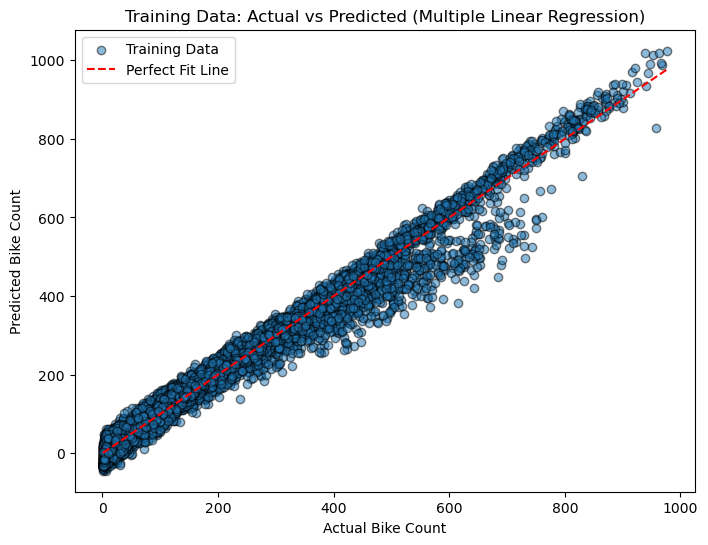

In [59]:
# --- Visualize Results ---

# Visualization: Training data predictions vs actual values
plt.figure(figsize=(8, 6))
plt.scatter(y_multi_train, full_model.fittedvalues, alpha=0.5, edgecolor='k', label='Training Data')
plt.plot([y_multi_train.min(), y_multi_train.max()], [y_multi_train.min(), y_multi_train.max()],
         color='red', linestyle='--', label='Perfect Fit Line')
plt.title('Training Data: Actual vs Predicted (Multiple Linear Regression)')
plt.xlabel('Actual Bike Count')
plt.ylabel('Predicted Bike Count')
plt.legend()
plt.show()

In [60]:
# --- Evaluate the model on the test set ---
X_multi_test = X_test_cleaned  # Predictors for the test set
y_multi_test = y_test_cleaned  # Target for the test set

X_multi_test_const = sm.add_constant(X_multi_test)

# Predict on the test set
y_train_pred = full_model.predict(X_multi_train_const)
y_test_pred = full_model.predict(X_multi_test_const)
# Calculate metrics on the test set
train_r2_ml = r2_score(y_multi_train, y_train_pred)
train_rmse_ml = np.sqrt(mean_squared_error(y_multi_train, y_train_pred))

print(f"\nTrain Set Evaluation (Multiple Linear Regression):")
print(f"R²: {train_r2_ml:.4f}")
print(f"RMSE: {train_rmse_ml:.4f}")

# Calculate metrics on the test set
test_r2_ml = r2_score(y_multi_test, y_test_pred)
test_rmse_ml = np.sqrt(mean_squared_error(y_multi_test, y_test_pred))

print(f"\nTest Set Evaluation (Multiple Linear Regression):")
print(f"R²: {test_r2_ml:.4f}")
print(f"RMSE: {test_rmse_ml:.4f}")


Train Set Evaluation (Multiple Linear Regression):
R²: 0.9744
RMSE: 29.3186

Test Set Evaluation (Multiple Linear Regression):
R²: 0.9734
RMSE: 29.0292


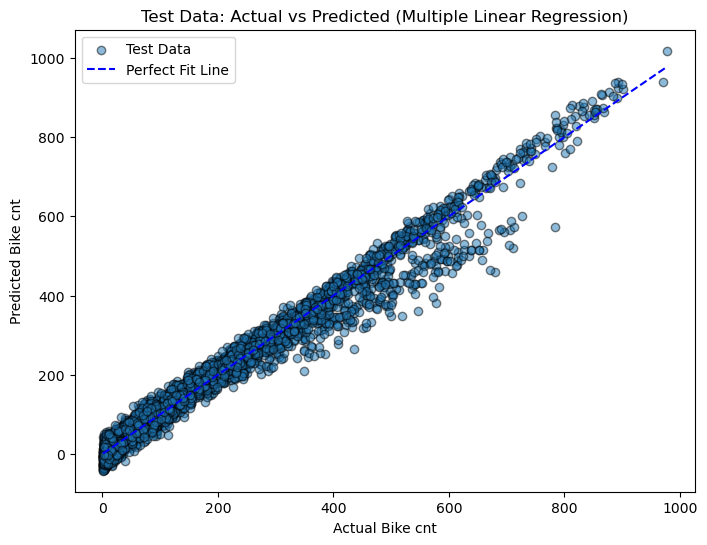

In [61]:
# Visualization: Test data predictions vs actual values
plt.figure(figsize=(8, 6))
plt.scatter(y_multi_test, y_test_pred, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_multi_test.min(), y_multi_test.max()], [y_multi_test.min(), y_multi_test.max()],
         color='blue', linestyle='--', label='Perfect Fit Line')
plt.title('Test Data: Actual vs Predicted (Multiple Linear Regression)')
plt.xlabel('Actual Bike cnt')
plt.ylabel('Predicted Bike cnt')
plt.legend()
plt.show()

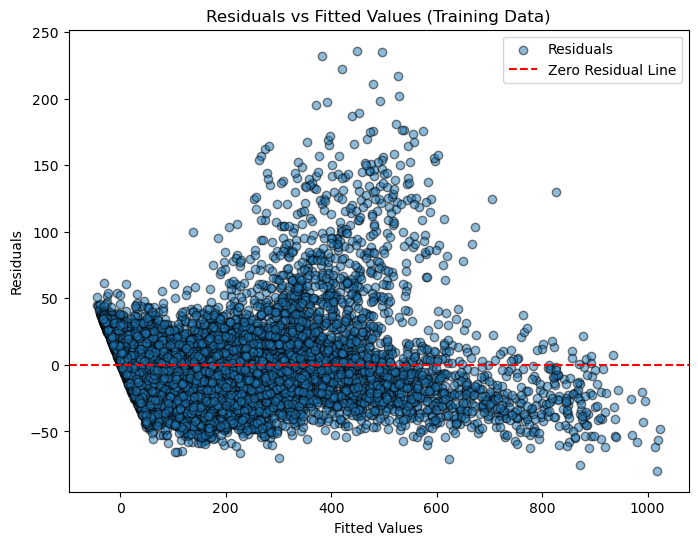

In [62]:
# Visualization: Residuals on Training Data
residuals = y_multi_train - full_model.fittedvalues
plt.figure(figsize=(8, 6))
plt.scatter(full_model.fittedvalues, residuals, alpha=0.5, edgecolor='k', label='Residuals')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Fitted Values (Training Data)')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.legend()
plt.show()

## 3. Polynomial Regression

In [64]:
X_train_cleaned

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
11229,0,1,0.010056,0.046265,-1.073271,0.037231,-0.964004,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
6334,0,1,0.942327,0.925809,0.840769,-0.206991,0.037683,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
11060,0,1,-0.818629,-1.008492,-1.383656,1.872174,-0.872346,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
12346,0,0,1.045913,0.925809,-1.487117,-1.552670,1.654786,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
15437,0,1,0.320813,0.310244,-0.555963,0.893647,0.227546,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0,1,-0.197115,-0.129528,1.306346,-0.818365,1.137575,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
11964,0,1,0.838742,0.837622,-1.487117,-0.452032,3.487939,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0
5390,0,1,1.563841,1.453187,-1.021540,0.771536,0.050777,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
860,0,1,-1.336557,-1.623476,0.116538,1.872174,-0.381323,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [65]:
# Import necessary libraries
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Define the predictors and target variables
X_poly_train = X_train_cleaned  # Use all features as predictors
y_poly_train = y_train_cleaned  # Target variable

# Apply polynomial features (degree = 2 for quadratic regression)
poly = PolynomialFeatures(degree=2)
X_poly_train_transformed = poly.fit_transform(X_poly_train)

# Train the Polynomial Regression model
poly_model = LinearRegression()
poly_model.fit(X_poly_train_transformed, y_poly_train)

# Predict on the training data
y_poly_train_pred = poly_model.predict(X_poly_train_transformed)

# Evaluate Polynomial Regression on training data
train_r2_poly = r2_score(y_poly_train, y_poly_train_pred)
train_rmse_poly = np.sqrt(mean_squared_error(y_poly_train, y_poly_train_pred))


In [66]:
# Test Set Evaluation
X_poly_test = X_test_cleaned
X_poly_test_transformed = poly.transform(X_poly_test)
y_poly_test_pred = poly_model.predict(X_poly_test_transformed)

# Evaluate Polynomial Regression on the test data
test_r2_poly = r2_score(y_test_cleaned, y_poly_test_pred)
test_rmse_poly = np.sqrt(mean_squared_error(y_test_cleaned, y_poly_test_pred))

# Print results
print("Performance of Polynomial Regression:")
print(f"Training Data: R² = {train_r2_poly:.4f}, RMSE = {train_rmse_poly:.4f}")
print(f"Test Data: R² = {test_r2_poly:.4f}, RMSE = {test_rmse_poly:.4f}")



Performance of Polynomial Regression:
Training Data: R² = 0.9929, RMSE = 15.4509
Test Data: R² = -358118273874.7134, RMSE = 106526449.1616


In [67]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Initialize lists to store metrics
rmse_scores = []
r2_scores = []
test_r2_scores = []
test_rmse_scores = []

# Define RMSE function
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Perform k-Fold Cross-Validation
for train_index, val_index in kf.split(X_train_cleaned):
    # Split data into training and validation sets for this fold
    X_train_fold, X_val_fold = X_train_cleaned.iloc[train_index], X_train_cleaned.iloc[val_index]
    y_train_fold, y_val_fold = y_train_cleaned.iloc[train_index], y_train_cleaned.iloc[val_index]
    
    # Transform polynomial features for the fold
    X_train_fold_transformed = poly.fit_transform(X_train_fold)
    X_val_fold_transformed = poly.transform(X_val_fold)
    X_test_transformed = poly.transform(X_test_cleaned)
    
    # Train the Polynomial Regression model
    poly_model.fit(X_train_fold_transformed, y_train_fold)
    
    # Predict on validation and test sets
    y_val_pred = poly_model.predict(X_val_fold_transformed)
    y_test_pred = poly_model.predict(X_test_transformed)
    
    # Evaluate metrics for validation set
    fold_r2 = r2_score(y_val_fold, y_val_pred)
    fold_rmse = rmse(y_val_fold, y_val_pred)
    
    # Evaluate metrics for test set
    test_fold_r2 = r2_score(y_test_cleaned, y_test_pred)
    test_fold_rmse = rmse(y_test_cleaned, y_test_pred)
    
    # Append metrics for this fold
    r2_scores.append(fold_r2)
    rmse_scores.append(fold_rmse)
    test_r2_scores.append(test_fold_r2)
    test_rmse_scores.append(test_fold_rmse)

# Calculate mean and standard deviation for R² and RMSE
mean_r2 = np.mean(r2_scores)
std_r2 = np.std(r2_scores)
mean_rmse = np.mean(rmse_scores)
std_rmse = np.std(rmse_scores)

mean_test_r2 = np.mean(test_r2_scores)
std_test_r2 = np.std(test_r2_scores)
mean_test_rmse = np.mean(test_rmse_scores)
std_test_rmse = np.std(test_rmse_scores)

# Print cross-validation results
print("Evaluation of Polynomial Regression with k-Fold Cross-Validation (Validation Set):")
print(f"Average R²: {mean_r2:.4f} (±{std_r2:.4f})")
print(f"Average RMSE: {mean_rmse:.4f} (±{std_rmse:.4f})")

print("\nPerformance of Polynomial Regression on Test Data with k-Fold Cross-Validation:")
print(f"Mean Test R²: {mean_test_r2:.4f} (±{std_test_r2:.4f})")
print(f"Mean Test RMSE: {mean_test_rmse:.4f} (±{std_test_rmse:.4f})")


Evaluation of Polynomial Regression with k-Fold Cross-Validation (Validation Set):
Average R²: -5262556739176.5527 (±6484619185971.7949)
Average RMSE: 264766413.2691 (±325078192.3779)

Performance of Polynomial Regression on Test Data with k-Fold Cross-Validation:
Mean Test R²: -4031659747957.6982 (±5320093098185.5820)
Mean Test RMSE: 268687067.8547 (±235712978.1265)


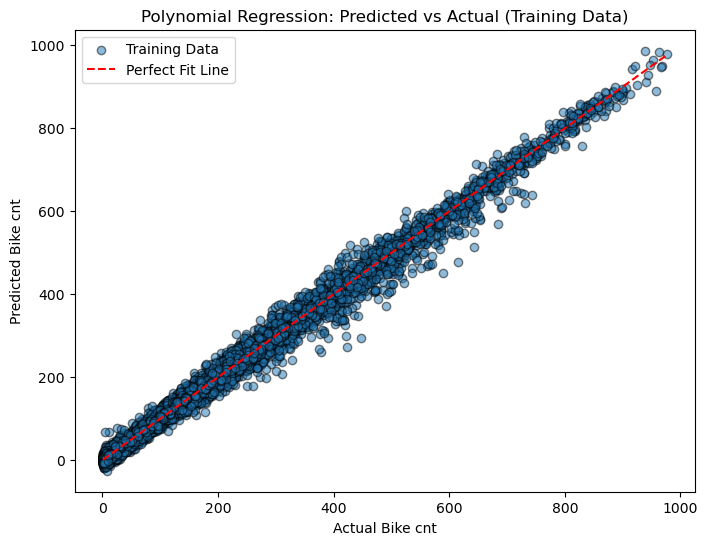

In [241]:
# Visualization: Predicted vs Actual for Training Data
plt.figure(figsize=(8, 6))
plt.scatter(y_poly_train, y_poly_train_pred, alpha=0.5, edgecolor='k', label='Training Data')
plt.plot([y_poly_train.min(), y_poly_train.max()], [y_poly_train.min(), y_poly_train.max()],
         color='red', linestyle='--', label='Perfect Fit Line')
plt.title('Polynomial Regression: Predicted vs Actual (Training Data)')
plt.xlabel('Actual Bike cnt')
plt.ylabel('Predicted Bike cnt')
plt.legend()
plt.show()


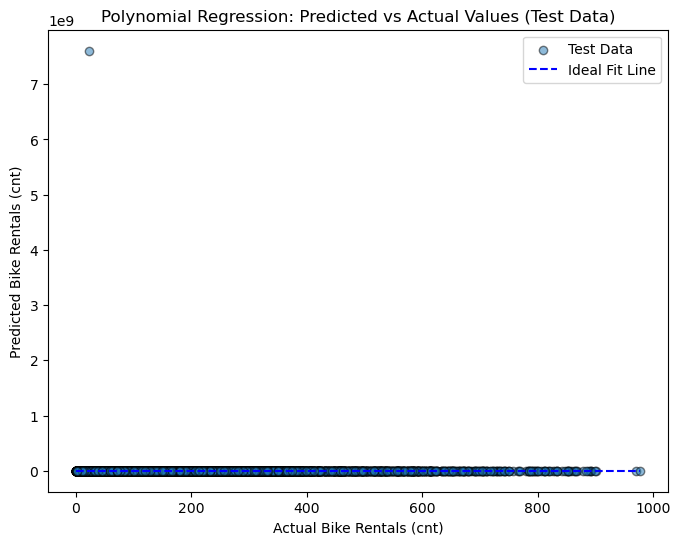

In [242]:
# Visualization: Predicted vs Actual for Test Data
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cleaned, y_poly_test_pred, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()],
         color='blue', linestyle='--', label='Ideal Fit Line')
plt.title('Polynomial Regression: Predicted vs Actual Values (Test Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()

train_rmse_poly = np.sqrt(mean_squared_error(y_poly_train, y_poly_train_pred))


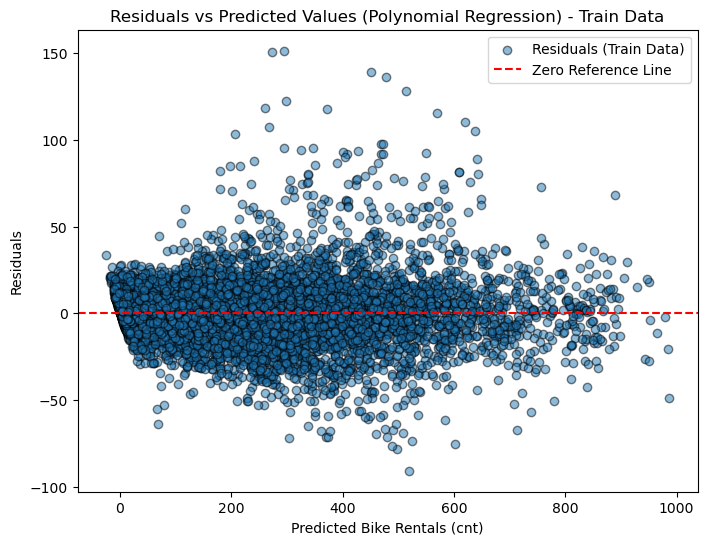

In [70]:
# Residuals for Polynomial Regression - Train Data
residuals_poly_train = y_poly_train - y_poly_train_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_poly_train_pred, residuals_poly_train, alpha=0.5, edgecolor='k', label='Residuals (Train Data)')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Reference Line')
plt.title('Residuals vs Predicted Values (Polynomial Regression) - Train Data')
plt.xlabel('Predicted Bike Rentals (cnt)')
plt.ylabel('Residuals')
plt.legend()
plt.show()


## Regularization Techniques for Predicting Bike Rentals

1. Lasso Reegression

Assumptions

Similar to multiple linear regression: assumes a linear relationship, homoscedasticity, and no multicollinearity issues.
Incorporates the additional assumption of sparsity, meaning L1 regularization expects many coefficients to shrink to zero.

Applicability

Lasso is effective for feature selection by reducing multicollinearity and shrinking less important predictors to zero.
In this dataset, it can identify the most impactful environmental or seasonal predictors for bike rentals.
Its moderate performance suggests some predictors might not have significant explanatory power.

2. Ridge Regression
   
Assumptions

Follows the same assumptions as multiple linear regression, including linearity and homoscedasticity.
Adds the assumption that coefficients are penalized through L2 regularization, helping to minimize overfitting.

Applicability

Handles multicollinearity better than standard linear regression and enhances model stability.
While effective, it may not fully capture complex data relationships.

3. Elastic Net Regression

Assumptions

Combines the assumptions of Lasso and Ridge regression.
Accounts for scenarios where some predictors are sparse (Lasso behavior) and others make smaller contributions (Ridge behavior).

Applicability

Ideal for datasets with both sparse and multicollinear predictors.
Offers a balanced approach, leveraging the strengths of both L1 and L2 regularization, and delivers performance comparable to Lasso and Ridge regression.
    

In [73]:
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

# Define predictors and target variables for training and testing
X_train = X_train_cleaned
X_test = X_test_cleaned
y_train = y_train_cleaned
y_test = y_test_cleaned

# Initialize models with default parameters
lasso = Lasso(alpha=0.1, random_state=42)  # Alpha controls the strength of L1 regularization
ridge = Ridge(alpha=1.0, random_state=42)  # Alpha controls the strength of L2 regularization
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # l1_ratio balances LASSO and Ridge penalties

# Train LASSO regression
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_test)

# Train Ridge regression
ridge.fit(X_train, y_train)
y_pred_ridge = ridge.predict(X_test)

# Train Elastic Net regression
elastic_net.fit(X_train, y_train)
y_pred_elastic_net = elastic_net.predict(X_test)

# Predict on train data
y_train_pred_lasso = lasso.predict(X_train)
y_train_pred_ridge = ridge.predict(X_train)
y_train_elastic_net = elastic_net.predict(X_train)

# Train metrics
lasso_train_r2 = r2_score(y_train, y_train_pred_lasso)
lasso_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_lasso))

ridge_train_r2 = r2_score(y_train, y_train_pred_ridge)
ridge_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_ridge))

elastic_train_net_r2 = r2_score(y_train, y_train_elastic_net)
elastic_train_net_rmse = np.sqrt(mean_squared_error(y_train, y_train_elastic_net))

# Test metrics
lasso_test_r2 = r2_score(y_test, y_pred_lasso)
lasso_test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_lasso))

ridge_test_r2 = r2_score(y_test, y_pred_ridge)
ridge_test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_ridge))

elastic_test_net_r2 = r2_score(y_test, y_pred_elastic_net)
elastic_test_net_rmse = np.sqrt(mean_squared_error(y_test, y_pred_elastic_net))

# Display the training results
print("Regularization Techniques: Training Results")
print(f"LASSO Regression: R² = {lasso_train_r2:.4f}, RMSE = {lasso_train_rmse:.4f}")
print(f"Ridge Regression: R² = {ridge_train_r2:.4f}, RMSE = {ridge_train_rmse:.4f}")
print(f"Elastic Net Regression: R² = {elastic_train_net_r2:.4f}, RMSE = {elastic_train_net_rmse:.4f}")

# Display the testing results
print("\nRegularization Techniques: Testing Results")
print(f"LASSO Regression: R² = {lasso_test_r2:.4f}, RMSE = {lasso_test_rmse:.4f}")
print(f"Ridge Regression: R² = {ridge_test_r2:.4f}, RMSE = {ridge_test_rmse:.4f}")
print(f"Elastic Net Regression: R² = {elastic_test_net_r2:.4f}, RMSE = {elastic_test_net_rmse:.4f}")


Regularization Techniques: Training Results
LASSO Regression: R² = 0.9742, RMSE = 29.4703
Ridge Regression: R² = 0.9744, RMSE = 29.3188
Elastic Net Regression: R² = 0.9683, RMSE = 32.6237

Regularization Techniques: Testing Results
LASSO Regression: R² = 0.9733, RMSE = 29.0967
Ridge Regression: R² = 0.9734, RMSE = 29.0272
Elastic Net Regression: R² = 0.9674, RMSE = 32.1381


In [74]:
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer

# Define k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5 folds

# Lists to store metrics for each fold
lasso_r2_scores = []
lasso_rmse_scores = []
ridge_r2_scores = []
ridge_rmse_scores = []
elastic_net_r2_scores = []
elastic_net_rmse_scores = []

# Custom RMSE scorer
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Perform k-fold cross-validation
for train_index, val_index in kf.split(X_train):
    # Split data into training and validation sets
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    # LASSO Regression
    lasso.fit(X_train_fold, y_train_fold)
    y_val_pred_lasso = lasso.predict(X_val_fold)
    lasso_r2_scores.append(r2_score(y_val_fold, y_val_pred_lasso))
    lasso_rmse_scores.append(rmse(y_val_fold, y_val_pred_lasso))
    
    # Ridge Regression
    ridge.fit(X_train_fold, y_train_fold)
    y_val_pred_ridge = ridge.predict(X_val_fold)
    ridge_r2_scores.append(r2_score(y_val_fold, y_val_pred_ridge))
    ridge_rmse_scores.append(rmse(y_val_fold, y_val_pred_ridge))
    
    # Elastic Net Regression
    elastic_net.fit(X_train_fold, y_train_fold)
    y_val_pred_elastic_net = elastic_net.predict(X_val_fold)
    elastic_net_r2_scores.append(r2_score(y_val_fold, y_val_pred_elastic_net))
    elastic_net_rmse_scores.append(rmse(y_val_fold, y_val_pred_elastic_net))

# Calculate mean and standard deviation of R² and RMSE for each model
print("Cross-Validation Performance (Training Set):")
print(f"LASSO Regression: Average R² = {np.mean(lasso_r2_scores):.4f} (±{np.std(lasso_r2_scores):.4f}), Average RMSE = {np.mean(lasso_rmse_scores):.4f} (±{np.std(lasso_rmse_scores):.4f})")
print(f"Ridge Regression: Average R² = {np.mean(ridge_r2_scores):.4f} (±{np.std(ridge_r2_scores):.4f}), Average RMSE = {np.mean(ridge_rmse_scores):.4f} (±{np.std(ridge_rmse_scores):.4f})")
print(f"Elastic Net Regression: Average R² = {np.mean(elastic_net_r2_scores):.4f} (±{np.std(elastic_net_r2_scores):.4f}), Average RMSE = {np.mean(elastic_net_rmse_scores):.4f} (±{np.std(elastic_net_rmse_scores):.4f})")

# Evaluate on test set
print("\nModel Performance on Test Data:")
lasso.fit(X_train, y_train)
y_test_pred_lasso = lasso.predict(X_test)
lasso_test_r2 = r2_score(y_test, y_test_pred_lasso)
lasso_test_rmse = rmse(y_test, y_test_pred_lasso)
print(f"LASSO Regression: R² = {lasso_test_r2:.4f}, RMSE = {lasso_test_rmse:.4f}")

ridge.fit(X_train, y_train)
y_test_pred_ridge = ridge.predict(X_test)
ridge_test_r2 = r2_score(y_test, y_test_pred_ridge)
ridge_test_rmse = rmse(y_test, y_test_pred_ridge)
print(f"Ridge Regression: R² = {ridge_test_r2:.4f}, RMSE = {ridge_test_rmse:.4f}")

elastic_net.fit(X_train, y_train)
y_test_pred_elastic_net = elastic_net.predict(X_test)
elastic_net_test_r2 = r2_score(y_test, y_test_pred_elastic_net)
elastic_net_test_rmse = rmse(y_test, y_test_pred_elastic_net)
print(f"Elastic Net Regression: R² = {elastic_net_test_r2:.4f}, RMSE = {elastic_net_test_rmse:.4f}")


Cross-Validation Performance (Training Set):
LASSO Regression: Average R² = 0.9739 (±0.0009), Average RMSE = 29.6075 (±0.3532)
Ridge Regression: Average R² = 0.9741 (±0.0009), Average RMSE = 29.4687 (±0.3292)
Elastic Net Regression: Average R² = 0.9682 (±0.0007), Average RMSE = 32.7043 (±0.3725)

Model Performance on Test Data:
LASSO Regression: R² = 0.9733, RMSE = 29.0967
Ridge Regression: R² = 0.9734, RMSE = 29.0272
Elastic Net Regression: R² = 0.9674, RMSE = 32.1381


In [75]:
# Create a DataFrame for feature importance
feature_names = X_train.columns  # Extract feature names

# Combine coefficients into a DataFrame
coefficients_df = pd.DataFrame({
    "Feature": feature_names,
    "LASSO Coefficient": lasso.coef_,
    "Ridge Coefficient": ridge.coef_,
    "Elastic Net Coefficient": elastic_net.coef_
})

# Display the DataFrame
coefficients_df.sort_values(by="LASSO Coefficient", ascending=False, inplace=True)  # Sort by LASSO importance


coefficients_df

,Feature,LASSO Coefficient,Ridge Coefficient,Elastic Net Coefficient
6,registered,174.557985,174.103695,158.898888
23,hr_14,32.086881,37.405137,9.998719
22,hr_13,30.963349,35.994322,11.210011
24,hr_15,29.415004,34.742462,9.087963
21,hr_12,28.083678,32.933656,10.474070
20,hr_11,26.096808,30.525070,8.456826
25,hr_16,22.138829,27.418019,9.410942
19,hr_10,17.321576,21.468740,4.692839
2,temperature,11.449825,11.584948,10.999619
7,season_summer,7.559900,4.337474,3.875070


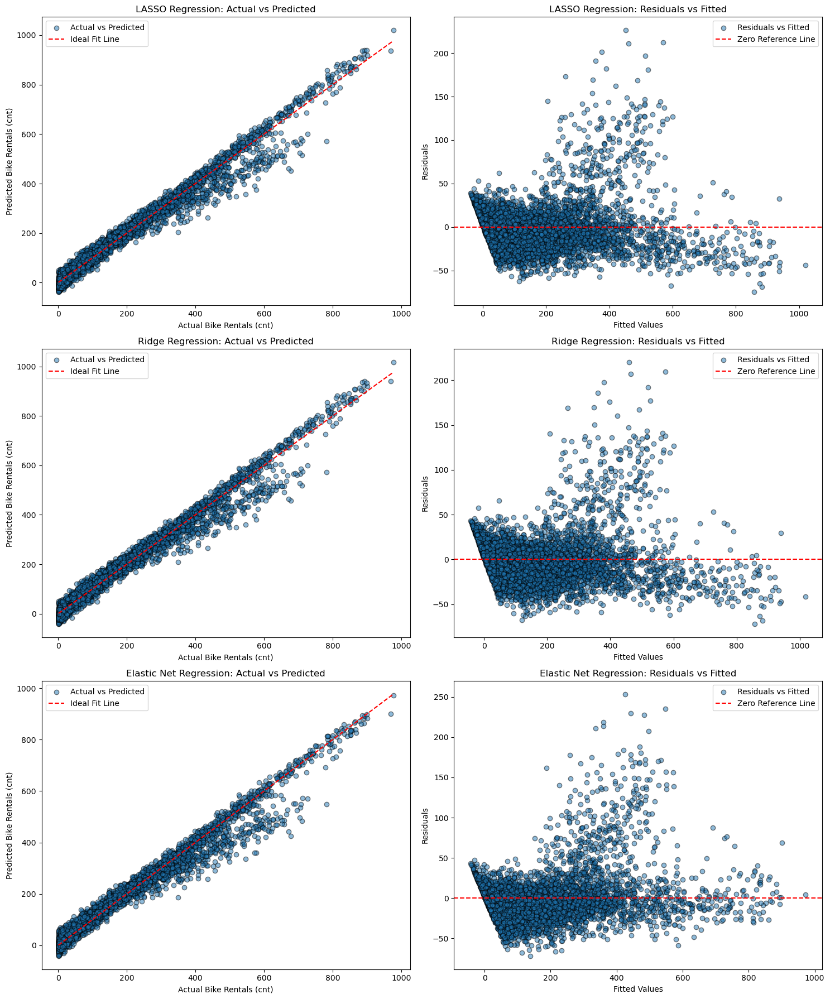

In [76]:
# Visualization: Actual vs Predicted and Residuals vs Fitted for LASSO, Ridge, and Elastic Net

# Calculate residuals for each model
lasso_residuals = y_test_cleaned - y_pred_lasso
ridge_residuals = y_test_cleaned - y_pred_ridge
elastic_net_residuals = y_test_cleaned - y_pred_elastic_net

# Create subplots for each model
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# LASSO Regression
axes[0, 0].scatter(y_test_cleaned, y_pred_lasso, alpha=0.5, edgecolor='k', label="Actual vs Predicted")
axes[0, 0].plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()], 
                color='red', linestyle='--', label='Ideal Fit Line')
axes[0, 0].set_title('LASSO Regression: Actual vs Predicted')
axes[0, 0].set_xlabel('Actual Bike Rentals (cnt)')
axes[0, 0].set_ylabel('Predicted Bike Rentals (cnt)')
axes[0, 0].legend()

axes[0, 1].scatter(y_pred_lasso, lasso_residuals, alpha=0.5, edgecolor='k', label="Residuals vs Fitted")
axes[0, 1].axhline(y=0, color='red', linestyle='--', label='Zero Reference Line')
axes[0, 1].set_title('LASSO Regression: Residuals vs Fitted')
axes[0, 1].set_xlabel('Fitted Values')
axes[0, 1].set_ylabel('Residuals')
axes[0, 1].legend()

# Ridge Regression
axes[1, 0].scatter(y_test_cleaned, y_pred_ridge, alpha=0.5, edgecolor='k', label="Actual vs Predicted")
axes[1, 0].plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()], 
                color='red', linestyle='--', label='Ideal Fit Line')
axes[1, 0].set_title('Ridge Regression: Actual vs Predicted')
axes[1, 0].set_xlabel('Actual Bike Rentals (cnt)')
axes[1, 0].set_ylabel('Predicted Bike Rentals (cnt)')
axes[1, 0].legend()

axes[1, 1].scatter(y_pred_ridge, ridge_residuals, alpha=0.5, edgecolor='k', label="Residuals vs Fitted")
axes[1, 1].axhline(y=0, color='red', linestyle='--', label='Zero Reference Line')
axes[1, 1].set_title('Ridge Regression: Residuals vs Fitted')
axes[1, 1].set_xlabel('Fitted Values')
axes[1, 1].set_ylabel('Residuals')
axes[1, 1].legend()

# Elastic Net Regression
axes[2, 0].scatter(y_test_cleaned, y_pred_elastic_net, alpha=0.5, edgecolor='k', label="Actual vs Predicted")
axes[2, 0].plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()], 
                color='red', linestyle='--', label='Ideal Fit Line')
axes[2, 0].set_title('Elastic Net Regression: Actual vs Predicted')
axes[2, 0].set_xlabel('Actual Bike Rentals (cnt)')
axes[2, 0].set_ylabel('Predicted Bike Rentals (cnt)')
axes[2, 0].legend()

axes[2, 1].scatter(y_pred_elastic_net, elastic_net_residuals, alpha=0.5, edgecolor='k', label="Residuals vs Fitted")
axes[2, 1].axhline(y=0, color='red', linestyle='--', label='Zero Reference Line')
axes[2, 1].set_title('Elastic Net Regression: Residuals vs Fitted')
axes[2, 1].set_xlabel('Fitted Values')
axes[2, 1].set_ylabel('Residuals')
axes[2, 1].legend()

plt.tight_layout()
plt.show()



## Advanced Regression Analysis

### Quantile Regression

Assumptions:
- Does not rely on a linear relationship or assume normal distribution of residuals.
- Focuses on modeling conditional quantiles (e.g., median) rather than the mean of the target variable.

Applicability:
- Ideal for datasets with heteroscedasticity or significant outliers.
- Well-suited for this dataset as it is robust to deviations from normality and inconsistent variance, providing reliable predictions in such cases.

In [79]:
import statsmodels.api as sm
import numpy as np
import pandas as pd

# Define predictors and target variables for training
X_train_quantile = sm.add_constant(X_train_cleaned)  # Add constant for intercept
y_train_quantile = y_train_cleaned

# Define the quantile for regression
quantile_value = 0.5  # Median (50th percentile)

# Fit the Quantile Regression model
quantile_model = sm.QuantReg(y_train_quantile, X_train_quantile)
quantile_fit = quantile_model.fit(q=quantile_value)

# Display the summary of the Quantile Regression model
print(f"Quantile Regression Summary (Quantile = {quantile_value}):")
print(quantile_fit.summary())

# Predict on the training set
y_train_quantile_pred = quantile_fit.predict(X_train_quantile)

# Evaluate the Quantile Regression model on the training set
quantile_train_rmse = np.sqrt(mean_squared_error(y_train_quantile, y_train_quantile_pred))
quantile_train_r2 = r2_score(y_train_quantile, y_train_quantile_pred)


Quantile Regression Summary (Quantile = 0.5):
                         QuantReg Regression Results                          
Dep. Variable:                    cnt   Pseudo R-squared:               0.8719
Model:                       QuantReg   Bandwidth:                       3.319
Method:                 Least Squares   Sparsity:                        34.29
Date:                Tue, 26 Nov 2024   No. Observations:                11917
Time:                        21:44:16   Df Residuals:                    11863
                                        Df Model:                           53
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           189.6282      1.245    152.357      0.000     187.189     192.068
holiday          -2.9705      0.893     -3.325      0.001      -4.721      -1.219
workingday      -15.6911      0.373    -42.104      0.000     -16.422    

C:\Users\Sirisha\anaconda3\Lib\site-packages\statsmodels\regression\quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
C:\Users\Sirisha\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1967: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(eigvals[0]/eigvals[-1])


In [80]:
# Test Set Evaluation
X_test_quantile = sm.add_constant(X_test_cleaned)
y_test_quantile_pred = quantile_fit.predict(X_test_quantile)

# Evaluate the Quantile Regression model on the test set
quantile_test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_quantile_pred))
quantile_test_r2 = r2_score(y_test_cleaned, y_test_quantile_pred)

# Print evaluation results
print("\nQuantile Regression Evaluation Results:")
print(f"Training R²: {quantile_train_r2:.4f}, Training RMSE: {quantile_train_rmse:.4f}")
print(f"Test R²: {quantile_test_r2:.4f}, Test RMSE: {quantile_test_rmse:.4f}")


Quantile Regression Evaluation Results:
Training R²: 0.9674, Training RMSE: 33.0785
Test R²: 0.9663, Test RMSE: 32.6593


In [81]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# Initialize k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5 folds

# Lists to store metrics for training and testing
train_r2_scores = []
train_rmse_scores = []
test_r2_scores = []
test_rmse_scores = []

# Prepare constant-added data
X_train_const = sm.add_constant(X_train_cleaned)
X_test_const = sm.add_constant(X_test_cleaned)

# Predict once on the entire training and test sets using the existing model
y_train_pred = quantile_fit.predict(X_train_const)
y_test_pred = quantile_fit.predict(X_test_const)

# Perform k-fold cross-validation for evaluation only
for train_index, val_index in kf.split(X_train_cleaned):
    # Split training predictions into train and validation folds
    y_train_fold_actual = y_train_cleaned.iloc[train_index]
    y_val_fold_actual = y_train_cleaned.iloc[val_index]
    
    y_train_fold_pred = y_train_pred.iloc[train_index]
    y_val_fold_pred = y_train_pred.iloc[val_index]
    
    # Training fold metrics
    train_r2 = r2_score(y_train_fold_actual, y_train_fold_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train_fold_actual, y_train_fold_pred))
    train_r2_scores.append(train_r2)
    train_rmse_scores.append(train_rmse)
    
    # Validation fold metrics
    val_r2 = r2_score(y_val_fold_actual, y_val_fold_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_fold_actual, y_val_fold_pred))
    
    # Test fold metrics (same across all folds since test set isn't split)
    test_r2 = r2_score(y_test_cleaned, y_test_pred)
    test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred))
    test_r2_scores.append(test_r2)
    test_rmse_scores.append(test_rmse)

# Calculate mean and standard deviation for R² and RMSE
mean_train_r2 = np.mean(train_r2_scores)
std_train_r2 = np.std(train_r2_scores)
mean_train_rmse = np.mean(train_rmse_scores)
std_train_rmse = np.std(train_rmse_scores)

mean_test_r2 = np.mean(test_r2_scores)
std_test_r2 = np.std(test_r2_scores)
mean_test_rmse = np.mean(test_rmse_scores)
std_test_rmse = np.std(test_rmse_scores)

# Print cross-validation results
print("\nQuantile Regression with k-Fold Cross-Validation (Evaluation Only):")
print("Training Results:")
print(f"Mean R²: {mean_train_r2:.4f} (±{std_train_r2:.4f}), Mean RMSE: {mean_train_rmse:.4f} (±{std_train_rmse:.4f})")
print("\nTesting Results:")
print(f"Mean R²: {mean_test_r2:.4f} (±{std_test_r2:.4f}), Mean RMSE: {mean_test_rmse:.4f} (±{std_test_rmse:.4f})")


Quantile Regression with k-Fold Cross-Validation (Evaluation Only):
Training Results:
Mean R²: 0.9674 (±0.0004), Mean RMSE: 33.0782 (±0.1449)

Testing Results:
Mean R²: 0.9663 (±0.0000), Mean RMSE: 32.6593 (±0.0000)


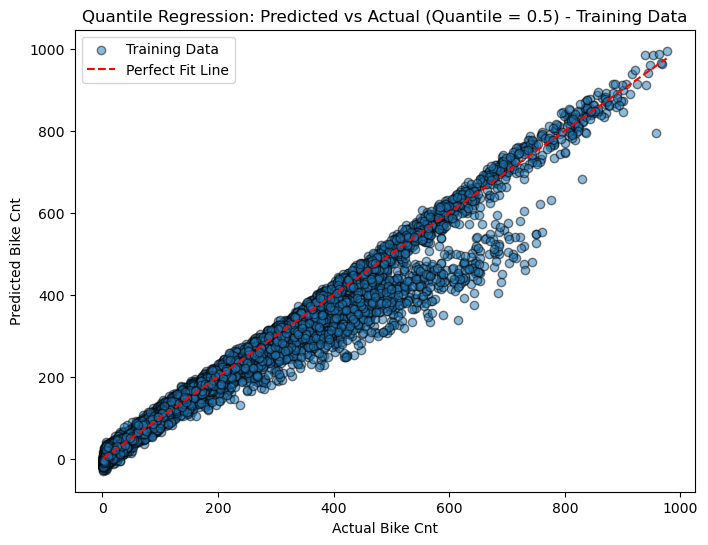

In [250]:
# Visualization: Actual vs Predicted for Training Data (Quantile Regression)
plt.figure(figsize=(8, 6))
plt.scatter(y_train_quantile, y_train_quantile_pred, alpha=0.5, edgecolor='k', label='Training Data')
plt.plot([y_train_quantile.min(), y_train_quantile.max()], [y_train_quantile.min(), y_train_quantile.max()],
         color='red', linestyle='--', label='Perfect Fit Line')
plt.title(f'Quantile Regression: Predicted vs Actual (Quantile = {quantile_value}) - Training Data')
plt.xlabel('Actual Bike Cnt')
plt.ylabel('Predicted Bike Cnt')
plt.legend()
plt.show()


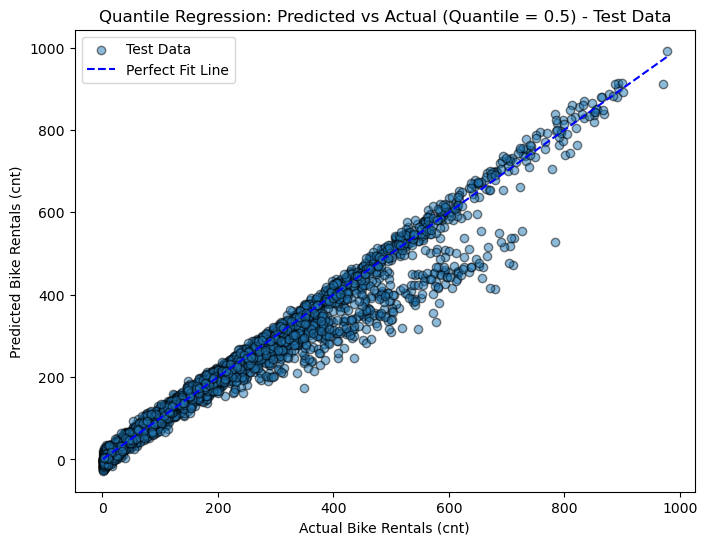

In [83]:

# Visualization: Actual vs Predicted for Test Data (Quantile Regression)
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cleaned, y_test_quantile_pred, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()],
         color='blue', linestyle='--', label='Perfect Fit Line')
plt.title(f'Quantile Regression: Predicted vs Actual (Quantile = {quantile_value}) - Test Data')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()

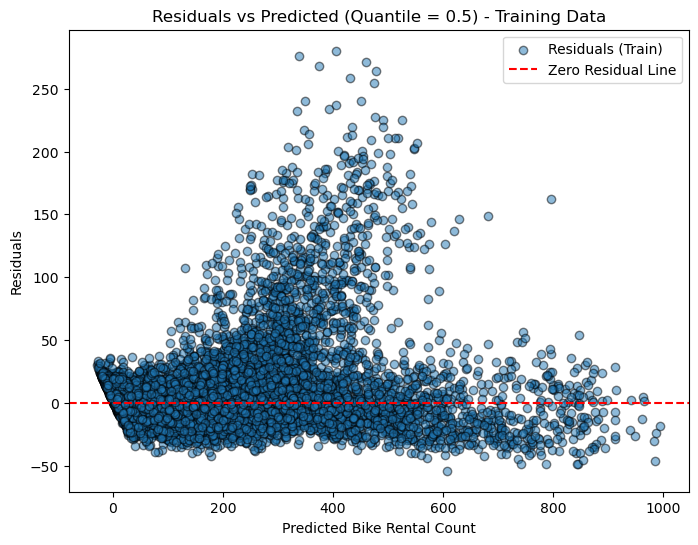

In [84]:
# Residuals Plot for Training Data
residuals_train = y_train_quantile - y_train_quantile_pred
plt.figure(figsize=(8, 6))
plt.scatter(y_train_quantile_pred, residuals_train, alpha=0.5, edgecolor='k', label='Residuals (Train)')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title(f'Residuals vs Predicted (Quantile = {quantile_value}) - Training Data')
plt.xlabel('Predicted Bike Rental Count')
plt.ylabel('Residuals')
plt.legend()
plt.show()


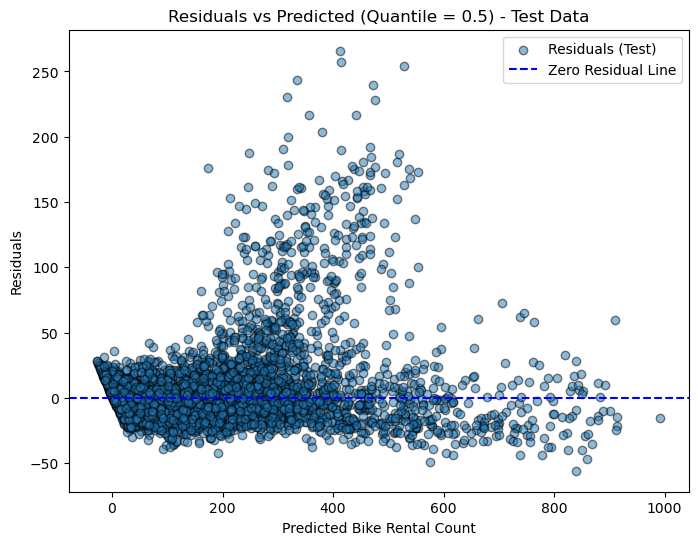

In [85]:

# Residuals Plot for Test Data
residuals_test = y_test_cleaned - y_test_quantile_pred
plt.figure(figsize=(8, 6))
plt.scatter(y_test_quantile_pred, residuals_test, alpha=0.5, edgecolor='k', label='Residuals (Test)')
plt.axhline(y=0, color='blue', linestyle='--', label='Zero Residual Line')
plt.title(f'Residuals vs Predicted (Quantile = {quantile_value}) - Test Data')
plt.xlabel('Predicted Bike Rental Count')
plt.ylabel('Residuals')
plt.legend()
plt.show()

In [86]:
X_train_cleaned

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
11229,0,1,0.010056,0.046265,-1.073271,0.037231,-0.964004,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
6334,0,1,0.942327,0.925809,0.840769,-0.206991,0.037683,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
11060,0,1,-0.818629,-1.008492,-1.383656,1.872174,-0.872346,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
12346,0,0,1.045913,0.925809,-1.487117,-1.552670,1.654786,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
15437,0,1,0.320813,0.310244,-0.555963,0.893647,0.227546,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0,1,-0.197115,-0.129528,1.306346,-0.818365,1.137575,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
11964,0,1,0.838742,0.837622,-1.487117,-0.452032,3.487939,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0
5390,0,1,1.563841,1.453187,-1.021540,0.771536,0.050777,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
860,0,1,-1.336557,-1.623476,0.116538,1.872174,-0.381323,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


### Poisson Regression

Key Conditions:
- The dependent variable should be non-negative integers (count data).
- Assumes the target's mean and variance are equal (no overdispersion).
- Predictors are expected to have an exponential effect on the target's mean.

Relevance to the Dataset:
- Since the target variable (cnt) is continuous rather than count data, this violates the primary assumption.
- While Poisson regression can still yield reasonable predictions, the assumption of equal mean and variance is not strictly satisfied in this case.

In [88]:
import statsmodels.api as sm
import numpy as np

# Prepare the predictors (X) and target (y)
X_train_poisson = sm.add_constant(X_train_cleaned)  # Add constant for intercept
y_train_poisson = y_train_cleaned.astype(int)       # Ensure target is integer

# Poisson Regression
poisson_model = sm.GLM(y_train_poisson, X_train_poisson, family=sm.families.Poisson())
poisson_result = poisson_model.fit()

# Display Poisson Regression Summary
print("Poisson Regression Summary:")
print(poisson_result.summary())

Poisson Regression Summary:
                 Generalized Linear Model Regression Results                  
Dep. Variable:                    cnt   No. Observations:                11917
Model:                            GLM   Df Residuals:                    11863
Model Family:                 Poisson   Df Model:                           53
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.2475e+05
Date:                Tue, 26 Nov 2024   Deviance:                   1.7334e+05
Time:                        21:44:21   Pearson chi2:                 1.62e+05
No. Iterations:                   100   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             

In [89]:
# constant term to predictors for both training and testing datasets
X_train_poisson = sm.add_constant(X_train_cleaned, has_constant='add')
X_test_poisson = sm.add_constant(X_test_cleaned, has_constant='add')

# Predict on Training Set for Poisson Regression
y_train_pred_poisson = poisson_result.predict(X_train_poisson)

# Calculate RMSE and R² for Poisson Regression (Training Set)
train_rmse_poisson = np.sqrt(mean_squared_error(y_train_cleaned, y_train_pred_poisson))
train_r2_poisson = r2_score(y_train_cleaned, y_train_pred_poisson)

# Display Poisson Regression Training Set Evaluation
print("\nPoisson Regression Training Set Evaluation:")
print(f"Train RMSE: {train_rmse_poisson:.4f}")
print(f"Train R²: {train_r2_poisson:.4f}")

# Predict on Test Set for Poisson Regression
y_test_pred_poisson = poisson_result.predict(X_test_poisson)

# Calculate RMSE and R² for Poisson Regression (Test Set)
test_rmse_poisson = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_poisson))
test_r2_poisson = r2_score(y_test_cleaned, y_test_pred_poisson)

# Display Poisson Regression Test Set Evaluation
print("\nPoisson Regression Test Set Evaluation:")
print(f"Test RMSE: {test_rmse_poisson:.4f}")
print(f"Test R²: {test_r2_poisson:.4f}")



Poisson Regression Training Set Evaluation:
Train RMSE: 59.1883
Train R²: 0.8957

Poisson Regression Test Set Evaluation:
Test RMSE: 56.5248
Test R²: 0.8992


In [90]:
# Reset indices for training data
X_train_cleaned = X_train_cleaned.reset_index(drop=True)
y_train_cleaned = y_train_cleaned.reset_index(drop=True)

# Add constant to the predictors
X_train_const = sm.add_constant(X_train_cleaned)
X_test_const = sm.add_constant(X_test_cleaned)

# Predict on the full training set and test set
y_train_pred_poisson = poisson_result.predict(X_train_const)
y_test_pred_poisson = poisson_result.predict(X_test_const)

# Initialize k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5 folds

# Lists to store metrics
train_r2_scores = []
train_rmse_scores = []
test_r2_scores = []
test_rmse_scores = []

# Perform k-fold cross-validation
for train_index, val_index in kf.split(X_train_cleaned):
    # Split data into training and validation sets
    X_train_fold = X_train_cleaned.iloc[train_index]
    X_val_fold = X_train_cleaned.iloc[val_index]
    y_train_fold = y_train_cleaned.iloc[train_index]
    y_val_fold = y_train_cleaned.iloc[val_index]
    
    # Add constant to predictors
    X_train_fold_const = sm.add_constant(X_train_fold)
    X_val_fold_const = sm.add_constant(X_val_fold)
    
    # Predict for folds using Poisson Regression model
    y_train_fold_pred = poisson_result.predict(X_train_fold_const)
    y_val_fold_pred = poisson_result.predict(X_val_fold_const)
    
    # Training metrics
    train_r2 = r2_score(y_train_fold, y_train_fold_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train_fold, y_train_fold_pred))
    train_r2_scores.append(train_r2)
    train_rmse_scores.append(train_rmse)
    
    # Validation metrics
    val_r2 = r2_score(y_val_fold, y_val_fold_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_fold, y_val_fold_pred))
    test_r2_scores.append(val_r2)
    test_rmse_scores.append(val_rmse)

# Calculate mean and standard deviation for R² and RMSE
mean_train_r2 = np.mean(train_r2_scores)
std_train_r2 = np.std(train_r2_scores)
mean_train_rmse = np.mean(train_rmse_scores)
std_train_rmse = np.std(train_rmse_scores)

mean_test_r2 = np.mean(test_r2_scores)
std_test_r2 = np.std(test_r2_scores)
mean_test_rmse = np.mean(test_rmse_scores)
std_test_rmse = np.std(test_rmse_scores)

# Print cross-validation results
print("\nPoisson Regression with k-Fold Cross-Validation (Evaluation Only):")
print("Training Results:")
print(f"Mean R²: {mean_train_r2:.4f} (±{std_train_r2:.4f}), Mean RMSE: {mean_train_rmse:.4f} (±{std_train_rmse:.4f})")
print("\nValidation Results:")
print(f"Mean R²: {mean_test_r2:.4f} (±{std_test_r2:.4f}), Mean RMSE: {mean_test_rmse:.4f} (±{std_test_rmse:.4f})")




Poisson Regression with k-Fold Cross-Validation (Evaluation Only):
Training Results:
Mean R²: 0.8957 (±0.0024), Mean RMSE: 59.1840 (±0.7166)

Validation Results:
Mean R²: 0.8958 (±0.0094), Mean RMSE: 59.1173 (±2.9003)


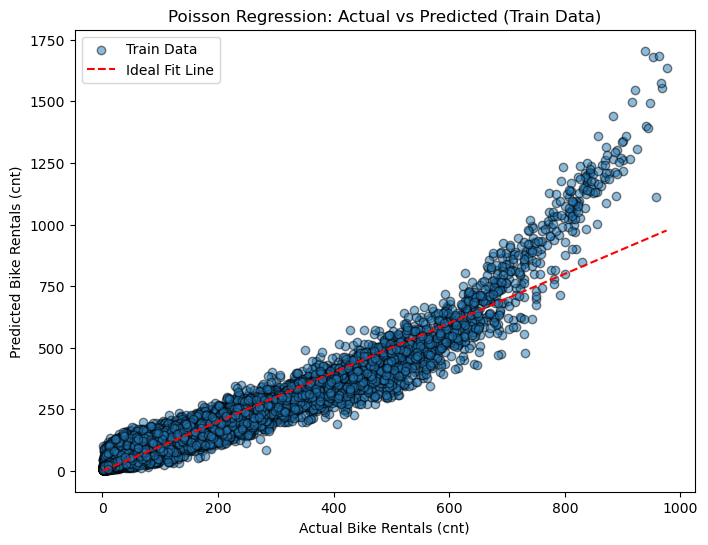

In [91]:
# Visualization: Actual vs Predicted for Train Data (Poisson Regression)
plt.figure(figsize=(8, 6))
plt.scatter(y_train_cleaned, y_train_pred_poisson, alpha=0.5, edgecolor='k', label='Train Data')
plt.plot([y_train_cleaned.min(), y_train_cleaned.max()], [y_train_cleaned.min(), y_train_cleaned.max()],
         color='red', linestyle='--', label='Ideal Fit Line')
plt.title('Poisson Regression: Actual vs Predicted (Train Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()


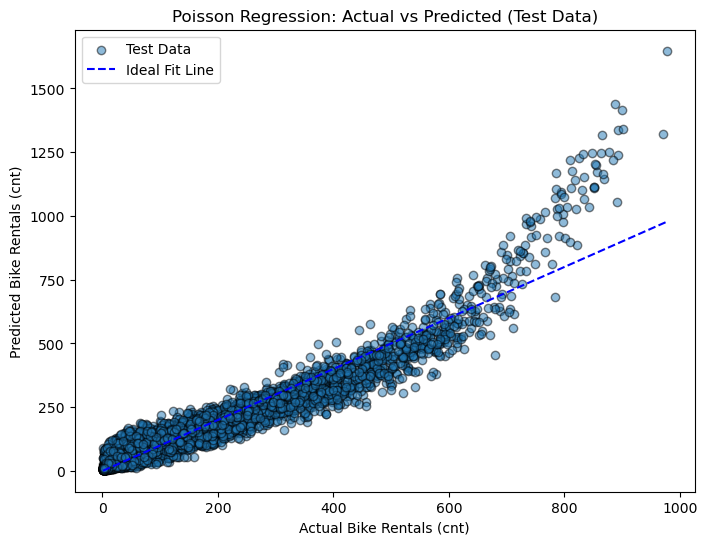

In [92]:
# Visualization: Actual vs Predicted for Test Data (Poisson Regression)
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cleaned, y_test_pred_poisson, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()],
         color='blue', linestyle='--', label='Ideal Fit Line')
plt.title('Poisson Regression: Actual vs Predicted (Test Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()

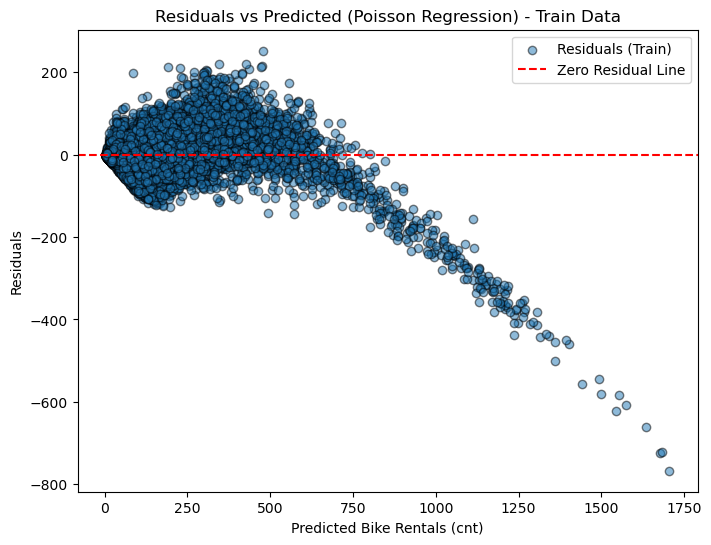

In [93]:
# Residuals Plot for Train Data (Poisson Regression)
residuals_train_poisson = y_train_cleaned - y_train_pred_poisson
plt.figure(figsize=(8, 6))
plt.scatter(y_train_pred_poisson, residuals_train_poisson, alpha=0.5, edgecolor='k', label='Residuals (Train)')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (Poisson Regression) - Train Data')
plt.xlabel('Predicted Bike Rentals (cnt)')
plt.ylabel('Residuals')
plt.legend()
plt.show()


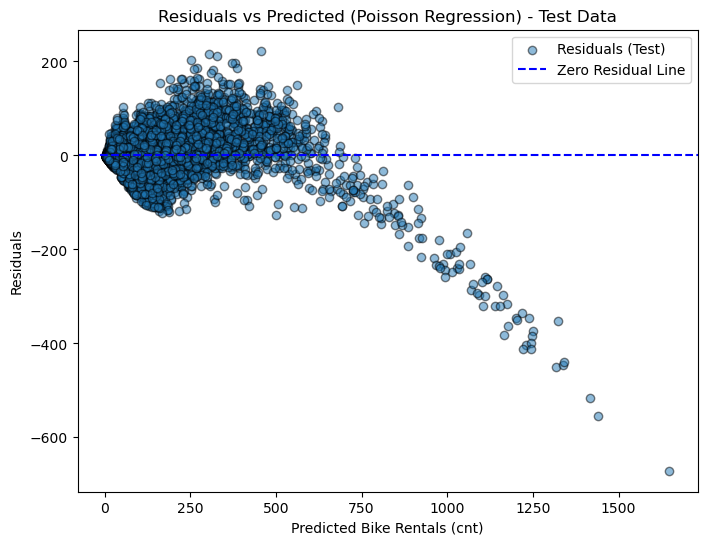

In [94]:
# Residuals Plot for Test Data (Poisson Regression)
residuals_test_poisson = y_test_cleaned - y_test_pred_poisson
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_poisson, residuals_test_poisson, alpha=0.5, edgecolor='k', label='Residuals (Test)')
plt.axhline(y=0, color='blue', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (Poisson Regression) - Test Data')
plt.xlabel('Predicted Bike Rentals (cnt)')
plt.ylabel('Residuals')
plt.legend()
plt.show()

### Negative Binomial Regression

Key Assumptions:
- Similar to Poisson regression, but it relaxes the constraint of equal mean and variance, allowing for overdispersion in the target variable.
- Designed for count data that exhibits greater variability than expected under the Poisson model.

Relevance to the Dataset:
- While the continuous nature of the target variable (`cnt`) does not fully align with the assumptions of count data, the model's ability to handle overdispersion makes it a suitable alternative. It performs adequately on this dataset despite the mismatch in assumptions.

In [96]:
# Fit Negative Binomial Regression Model
neg_binomial_model = sm.GLM(y_train_cleaned, X_train_const, family=sm.families.NegativeBinomial())
neg_binomial_result = neg_binomial_model.fit()

# Display Negative Binomial Regression Summary
print("\nNegative Binomial Regression Summary:")
print(neg_binomial_result.summary())


C:\Users\Sirisha\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Negative Binomial Regression Summary:
                 Generalized Linear Model Regression Results                  
Dep. Variable:                    cnt   No. Observations:                11917
Model:                            GLM   Df Residuals:                    11863
Model Family:        NegativeBinomial   Df Model:                           53
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -67576.
Date:                Tue, 26 Nov 2024   Deviance:                       2495.3
Time:                        21:44:26   Pearson chi2:                 2.12e+03
No. Iterations:                   100   Pseudo R-squ. (CS):             0.6914
Covariance Type:            nonrobust                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const  

In [97]:
# Evaluate Overdispersion: Calculate Variance and Mean
mean_y = y_train_poisson.mean()
variance_y = y_train_poisson.var()
overdispersion = variance_y > mean_y

print("\nOverdispersion Analysis:")
print(f"Mean of target (y): {mean_y:.4f}")
print(f"Variance of target (y): {variance_y:.4f}")
print(f"Overdispersion detected: {'Yes' if overdispersion else 'No'}")


# Predict on Train Set for Negative Binomial Regression
X_train_poisson = sm.add_constant(X_train_cleaned)
y_train_pred_neg_binomial = neg_binomial_result.predict(X_train_poisson)

# Calculate RMSE and R² for Negative Binomial Regression
train_rmse_neg_binomial = np.sqrt(mean_squared_error(y_train_cleaned, y_train_pred_neg_binomial))
train_r2_neg_binomial = r2_score(y_train_cleaned, y_train_pred_neg_binomial)

print("\nNegative Binomial Regression Train Set Evaluation:")
print(f"Train RMSE: {train_rmse_neg_binomial:.4f}")
print(f"Train R²: {train_r2_neg_binomial:.4f}")

# Predict on Test Set for Negative Binomial Regression
X_test_poisson = sm.add_constant(X_test_cleaned)
y_test_pred_neg_binomial = neg_binomial_result.predict(X_test_poisson)

# Calculate RMSE and R² for Negative Binomial Regression
test_rmse_neg_binomial = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_neg_binomial))
test_r2_neg_binomial = r2_score(y_test_cleaned, y_test_pred_neg_binomial)

print("\nNegative Binomial Regression Test Set Evaluation:")
print(f"Test RMSE: {test_rmse_neg_binomial:.4f}")
print(f"Test R²: {test_r2_neg_binomial:.4f}")


Overdispersion Analysis:
Mean of target (y): 191.6759
Variance of target (y): 33604.0136
Overdispersion detected: Yes

Negative Binomial Regression Train Set Evaluation:
Train RMSE: 181.3498
Train R²: 0.0212

Negative Binomial Regression Test Set Evaluation:
Test RMSE: 163.2537
Test R²: 0.1589


In [98]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# Add constant to predictors
X_train_const = sm.add_constant(X_train_cleaned)
X_test_const = sm.add_constant(X_test_cleaned)

# Use the existing model to predict on the full dataset
y_train_pred_neg_binomial = neg_binomial_result.predict(X_train_const)
y_test_pred_neg_binomial = neg_binomial_result.predict(X_test_const)

# Initialize k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5 folds

# Lists to store metrics for training and testing
train_r2_scores = []
train_rmse_scores = []
test_r2_scores = []
test_rmse_scores = []

# Perform k-fold cross-validation
for train_index, val_index in kf.split(X_train_cleaned):
    # Split data into training and validation sets
    y_train_fold_actual = y_train_cleaned.iloc[train_index]
    y_val_fold_actual = y_train_cleaned.iloc[val_index]
    
    y_train_fold_pred = y_train_pred_neg_binomial[train_index]
    y_val_fold_pred = y_train_pred_neg_binomial[val_index]
    
    # Training fold metrics
    train_r2 = r2_score(y_train_fold_actual, y_train_fold_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train_fold_actual, y_train_fold_pred))
    train_r2_scores.append(train_r2)
    train_rmse_scores.append(train_rmse)
    
    # Validation fold metrics
    val_r2 = r2_score(y_val_fold_actual, y_val_fold_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_fold_actual, y_val_fold_pred))
    
    # Test set metrics (same across all folds since test set isn't split)
    test_r2 = r2_score(y_test_cleaned, y_test_pred_neg_binomial)
    test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_neg_binomial))
    test_r2_scores.append(test_r2)
    test_rmse_scores.append(test_rmse)

# Calculate mean and standard deviation for R² and RMSE
mean_train_r2 = np.mean(train_r2_scores)
std_train_r2 = np.std(train_r2_scores)
mean_train_rmse = np.mean(train_rmse_scores)
std_train_rmse = np.std(train_rmse_scores)

mean_test_r2 = np.mean(test_r2_scores)
std_test_r2 = np.std(test_r2_scores)
mean_test_rmse = np.mean(test_rmse_scores)
std_test_rmse = np.std(test_rmse_scores)

# Print cross-validation results
print("\nNegative Binomial Regression with k-Fold Cross-Validation (Evaluation Only):")
print("Training Results:")
print(f"Mean R²: {mean_train_r2:.4f} (±{std_train_r2:.4f}), Mean RMSE: {mean_train_rmse:.4f} (±{std_train_rmse:.4f})")
print("\nValidation Results:")
print(f"Mean R²: {val_r2:.4f}, RMSE: {val_rmse:.4f}")
print("\nTesting Results:")
print(f"Mean R²: {mean_test_r2:.4f} (±{std_test_r2:.4f}), Mean RMSE: {mean_test_rmse:.4f} (±{std_test_rmse:.4f})")



Negative Binomial Regression with k-Fold Cross-Validation (Evaluation Only):
Training Results:
Mean R²: 0.0213 (±0.0401), Mean RMSE: 181.3063 (±3.9713)

Validation Results:
Mean R²: -0.0568, RMSE: 189.2643

Testing Results:
Mean R²: 0.1589 (±0.0000), Mean RMSE: 163.2537 (±0.0000)


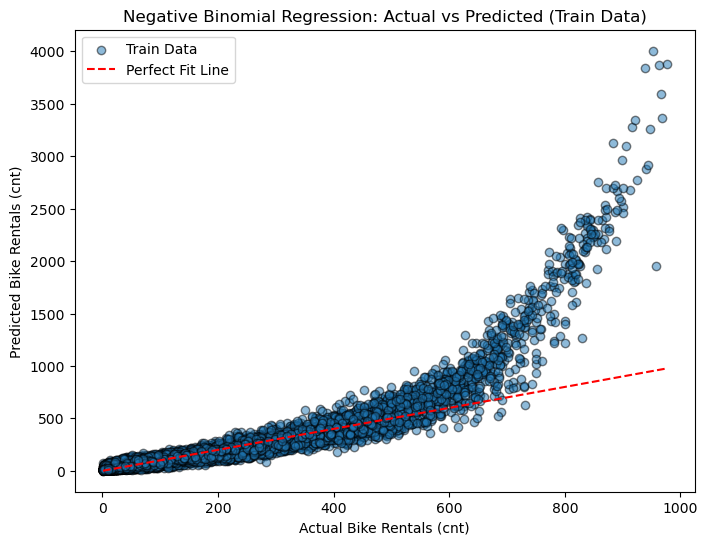

In [99]:
# Visualization: Actual vs Predicted for Train Data (Negative Binomial Regression)
plt.figure(figsize=(8, 6))
plt.scatter(y_train_cleaned, y_train_pred_neg_binomial, alpha=0.5, edgecolor='k', label='Train Data')
plt.plot([y_train_cleaned.min(), y_train_cleaned.max()], [y_train_cleaned.min(), y_train_cleaned.max()],
         color='red', linestyle='--', label='Perfect Fit Line')
plt.title('Negative Binomial Regression: Actual vs Predicted (Train Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()


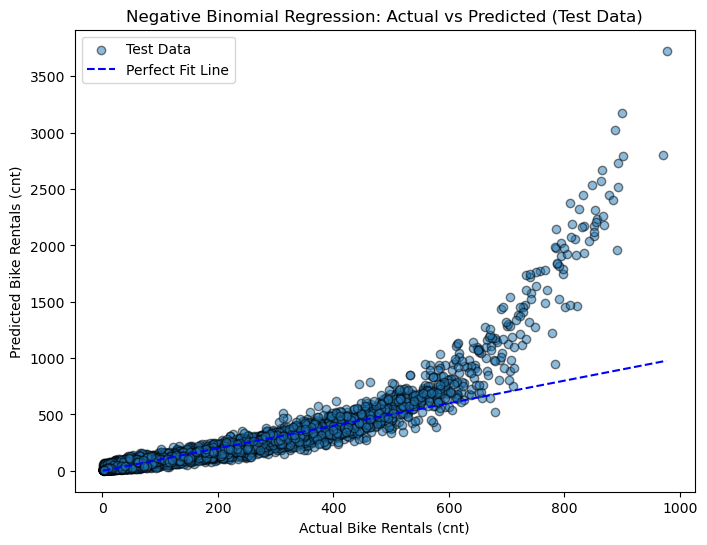

In [100]:
# Visualization: Actual vs Predicted for Test Data (Negative Binomial Regression)
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cleaned, y_test_pred_neg_binomial, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()],
         color='blue', linestyle='--', label='Perfect Fit Line')
plt.title('Negative Binomial Regression: Actual vs Predicted (Test Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()

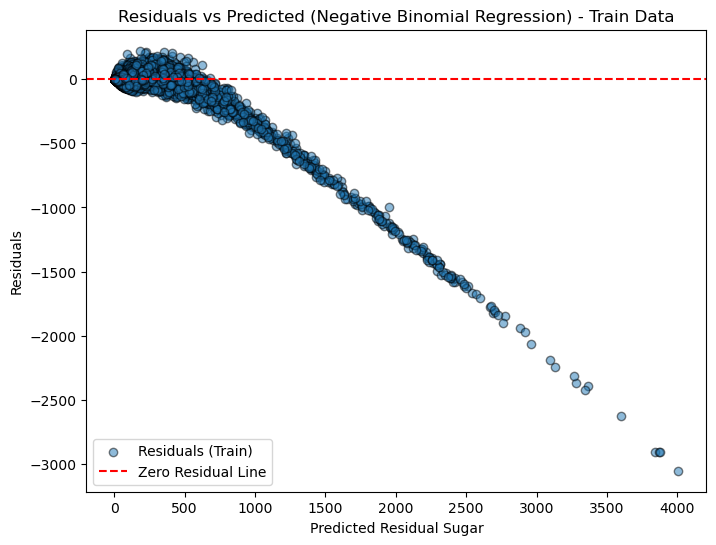

In [101]:
# Residuals Plot for Train Data (Negative Binomial Regression)
residuals_train_neg_binomial = y_train_cleaned - y_train_pred_neg_binomial
plt.figure(figsize=(8, 6))
plt.scatter(y_train_pred_neg_binomial, residuals_train_neg_binomial, alpha=0.5, edgecolor='k', label='Residuals (Train)')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (Negative Binomial Regression) - Train Data')
plt.xlabel('Predicted Residual Sugar')
plt.ylabel('Residuals')
plt.legend()
plt.show()

### Partial Least Squares Regression

Key Assumptions:
- Transforms predictors into uncorrelated latent components that explain the variability in both the predictors and the target variable.
- Does not impose strict requirements on linearity or independence among predictors.

Applicability:
- Ideal for datasets with high multicollinearity and numerous predictors. While the model excels at reducing dimensionality, it may face challenges in capturing intricate relationships within the data.

In [103]:
X_train_cleaned

,holiday,workingday,temperature,atemp,humidity,windspeed,registered,season_summer,season_fall,season_winter,hr_1,hr_2,hr_3,hr_4,hr_5,hr_6,hr_7,hr_8,hr_9,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,hr_17,hr_18,hr_19,hr_20,hr_21,hr_22,hr_23,weathersit_2,weathersit_3,weathersit_4,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,yr_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,mnth_7,mnth_8,mnth_9,mnth_10,mnth_11,mnth_12
0,0,1,0.010056,0.046265,-1.073271,0.037231,-0.964004,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
1,0,1,0.942327,0.925809,0.840769,-0.206991,0.037683,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0,1,-0.818629,-1.008492,-1.383656,1.872174,-0.872346,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
3,0,0,1.045913,0.925809,-1.487117,-1.552670,1.654786,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
4,0,1,0.320813,0.310244,-0.555963,0.893647,0.227546,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11912,0,1,-0.197115,-0.129528,1.306346,-0.818365,1.137575,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
11913,0,1,0.838742,0.837622,-1.487117,-0.452032,3.487939,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0
11914,0,1,1.563841,1.453187,-1.021540,0.771536,0.050777,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
11915,0,1,-1.336557,-1.623476,0.116538,1.872174,-0.381323,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [104]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# --- Partial Least Squares Regression ---

# Initialize Partial Least Squares Regression with a small number of components
pls = PLSRegression(n_components=min(X_train_cleaned.shape[1], 4))  # Use up to 4 components or the number of predictors
pls.fit(X_train_cleaned, y_train_cleaned)

# Predictions
y_train_pred_pls = pls.predict(X_train_cleaned)
y_test_pred_pls = pls.predict(X_test_cleaned)

# Evaluate PLS performance
pls_train_rmse = np.sqrt(mean_squared_error(y_train_cleaned, y_train_pred_pls))
pls_test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_pls))
pls_train_r2 = r2_score(y_train_cleaned, y_train_pred_pls)
pls_test_r2 = r2_score(y_test_cleaned, y_test_pred_pls)

# Display results
print("Partial Least Squares Regression Results:")
print(f"Train RMSE: {pls_train_rmse:.4f}, Train R²: {pls_train_r2:.4f}")
print(f"Test RMSE: {pls_test_rmse:.4f}, Test R²: {pls_test_r2:.4f}")


Partial Least Squares Regression Results:
Train RMSE: 32.5071, Train R²: 0.9686
Test RMSE: 32.1368, Test R²: 0.9674


In [105]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Predictions already computed using the existing PLS model
y_train_pred_pls = pls.predict(X_train_cleaned)
y_test_pred_pls = pls.predict(X_test_cleaned)

# Initialize k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Lists to store metrics for each fold
train_r2_scores = []
train_rmse_scores = []
val_r2_scores = []
val_rmse_scores = []
test_r2_scores = []
test_rmse_scores = []

# Perform k-fold cross-validation
for train_index, val_index in kf.split(X_train_cleaned):
    # Split training data into train and validation folds
    y_train_fold_actual = y_train_cleaned.iloc[train_index]
    y_val_fold_actual = y_train_cleaned.iloc[val_index]
    
    # Use precomputed predictions for corresponding indices
    y_train_fold_pred = y_train_pred_pls[train_index]
    y_val_fold_pred = y_train_pred_pls[val_index]
    
    # Calculate metrics for training fold
    train_r2 = r2_score(y_train_fold_actual, y_train_fold_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train_fold_actual, y_train_fold_pred))
    train_r2_scores.append(train_r2)
    train_rmse_scores.append(train_rmse)
    
    # Calculate metrics for validation fold
    val_r2 = r2_score(y_val_fold_actual, y_val_fold_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_fold_actual, y_val_fold_pred))
    val_r2_scores.append(val_r2)
    val_rmse_scores.append(val_rmse)
    
    # Calculate metrics for the test set (unchanged across folds)
    test_r2 = r2_score(y_test_cleaned, y_test_pred_pls)
    test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_pls))
    test_r2_scores.append(test_r2)
    test_rmse_scores.append(test_rmse)

# Calculate mean and standard deviation for R² and RMSE
mean_train_r2 = np.mean(train_r2_scores)
std_train_r2 = np.std(train_r2_scores)
mean_train_rmse = np.mean(train_rmse_scores)
std_train_rmse = np.std(train_rmse_scores)

mean_val_r2 = np.mean(val_r2_scores)
std_val_r2 = np.std(val_r2_scores)
mean_val_rmse = np.mean(val_rmse_scores)
std_val_rmse = np.std(val_rmse_scores)

mean_test_r2 = np.mean(test_r2_scores)
std_test_r2 = np.std(test_r2_scores)
mean_test_rmse = np.mean(test_rmse_scores)
std_test_rmse = np.std(test_rmse_scores)

# Display cross-validation results
print("\nPartial Least Squares Regression with k-Fold Cross-Validation:")
print("Training Results:")
print(f"Mean R²: {mean_train_r2:.4f} (±{std_train_r2:.4f}), Mean RMSE: {mean_train_rmse:.4f} (±{std_train_rmse:.4f})")
print("\nValidation Results:")
print(f"Mean R²: {mean_val_r2:.4f} (±{std_val_r2:.4f}), Mean RMSE: {mean_val_rmse:.4f} (±{std_val_rmse:.4f})")
print("\nTesting Results:")
print(f"Mean R²: {mean_test_r2:.4f} (±{std_test_r2:.4f}), Mean RMSE: {mean_test_rmse:.4f} (±{std_test_rmse:.4f})")



Partial Least Squares Regression with k-Fold Cross-Validation:
Training Results:
Mean R²: 0.9686 (±0.0002), Mean RMSE: 32.5070 (±0.0609)

Validation Results:
Mean R²: 0.9685 (±0.0009), Mean RMSE: 32.5062 (±0.2433)

Testing Results:
Mean R²: 0.9674 (±0.0000), Mean RMSE: 32.1368 (±0.0000)


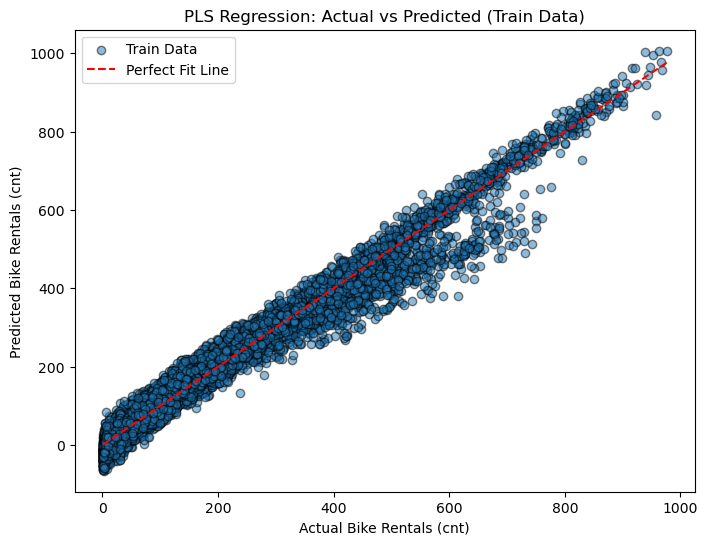

In [106]:
import matplotlib.pyplot as plt

# Visualization: Actual vs Predicted for Train Data (PLS)
plt.figure(figsize=(8, 6))
plt.scatter(y_train_cleaned, y_train_pred_pls, alpha=0.5, edgecolor='k', label='Train Data')
plt.plot([y_train_cleaned.min(), y_train_cleaned.max()], [y_train_cleaned.min(), y_train_cleaned.max()],
         color='red', linestyle='--', label='Perfect Fit Line')
plt.title('PLS Regression: Actual vs Predicted (Train Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()

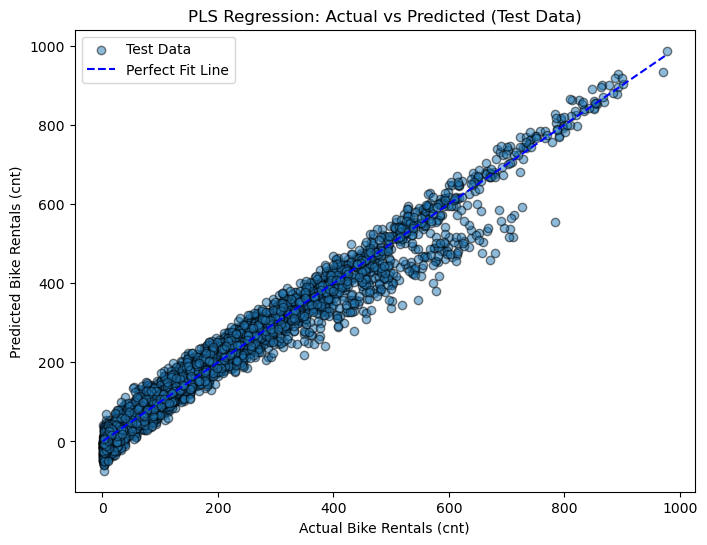

In [107]:
# Visualization: Actual vs Predicted for Test Data (PLS)
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cleaned, y_test_pred_pls, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()],
         color='blue', linestyle='--', label='Perfect Fit Line')
plt.title('PLS Regression: Actual vs Predicted (Test Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()


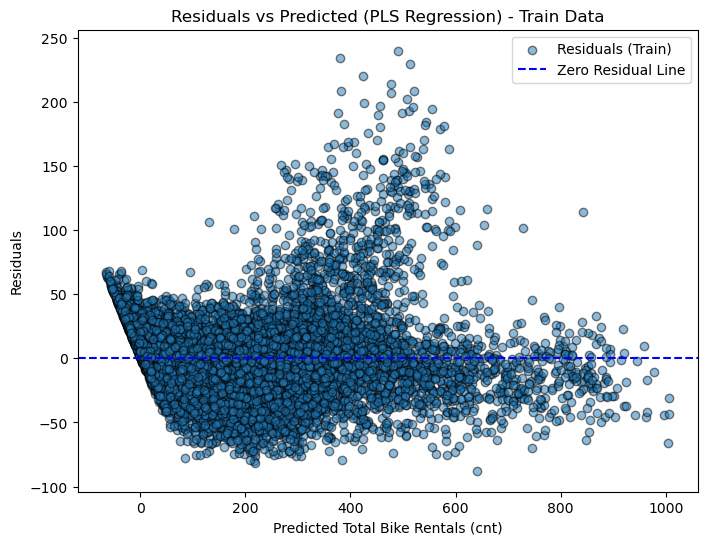

In [108]:
# Flatten the predictions
y_train_pred_pls = y_train_pred_pls.ravel()
y_test_pred_pls = y_test_pred_pls.ravel()

# Residuals Plot for Train Data (PLS)
residuals_train_pls = y_train_cleaned - y_train_pred_pls
plt.figure(figsize=(8, 6))
plt.scatter(y_train_pred_pls, residuals_train_pls, alpha=0.5, edgecolor='k', label='Residuals (Train)')
plt.axhline(y=0, color='blue', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (PLS Regression) - Train Data')
plt.xlabel('Predicted Total Bike Rentals (cnt)')
plt.ylabel('Residuals')
plt.legend()
plt.show()

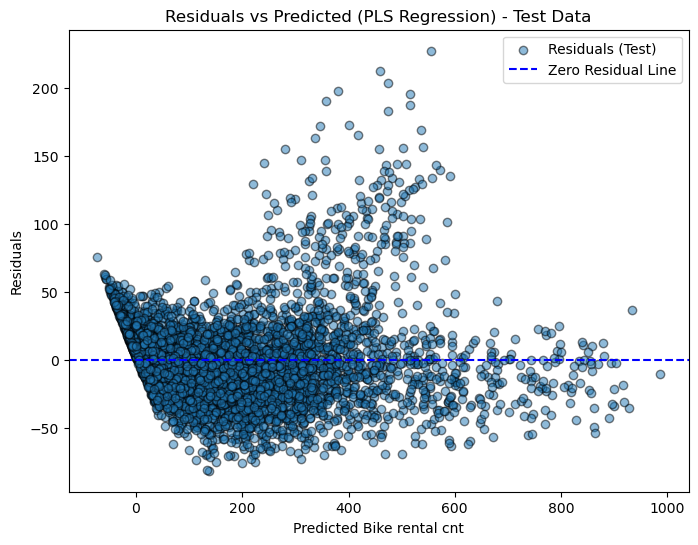

In [109]:
# Residuals Plot for Test Data (PLS)
residuals_test_pls = y_test_cleaned - y_test_pred_pls
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_pls, residuals_test_pls, alpha=0.5, edgecolor='k', label='Residuals (Test)')
plt.axhline(y=0, color='blue', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (PLS Regression) - Test Data')
plt.xlabel('Predicted Bike rental cnt')
plt.ylabel('Residuals')
plt.legend()
plt.show()

## Principal Component Regression (PCR)

Underlying Assumptions:
PCR addresses multicollinearity by transforming the predictors into principal components, which are uncorrelated. It assumes a linear relationship between these components and the target variable.

Relevance and Use:
PCR is useful for datasets with multicollinearity, effectively reducing dimensionality. Unlike PLS, PCR focuses on maximizing the variance of predictors rather than their relationship with the target variable, which may result in slightly reduced performance.

In [111]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# --- Principal Component Regression (PCR) ---
# PCA Transformation
pca = PCA(n_components=min(X_train_cleaned.shape[1], 5))  # Use up to 5 components or fewer if features < 5
X_train_pca = pca.fit_transform(X_train_cleaned)
X_test_pca = pca.transform(X_test_cleaned)

# Fit Linear Regression on PCA-transformed data
lr_pcr = LinearRegression()
lr_pcr.fit(X_train_pca, y_train_cleaned)

# Predictions
y_train_pred_pcr = lr_pcr.predict(X_train_pca)
y_test_pred_pcr = lr_pcr.predict(X_test_pca)

# Evaluate PCR performance
pcr_train_rmse = np.sqrt(mean_squared_error(y_train_cleaned, y_train_pred_pcr))
pcr_test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_pcr))
pcr_train_r2 = r2_score(y_train_cleaned, y_train_pred_pcr)
pcr_test_r2 = r2_score(y_test_cleaned, y_test_pred_pcr)

# Display Results
print("\nPrincipal Component Regression Results:")
print(f"Train RMSE: {pcr_train_rmse:.4f}, Train R²: {pcr_train_r2:.4f}")
print(f"Test RMSE: {pcr_test_rmse:.4f}, Test R²: {pcr_test_r2:.4f}")



Principal Component Regression Results:
Train RMSE: 45.7467, Train R²: 0.9377
Test RMSE: 45.0806, Test R²: 0.9359


In [112]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Use predictions and PCA-transformed data for PCR
y_train_pred_pcr = lr_pcr.predict(X_train_pca)
y_test_pred_pcr = lr_pcr.predict(X_test_pca)

# Initialize k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Lists to store metrics for each fold
train_r2_scores = []
train_rmse_scores = []
val_r2_scores = []
val_rmse_scores = []
test_r2_scores = []
test_rmse_scores = []

# Perform k-fold cross-validation
for train_index, val_index in kf.split(X_train_pca):
    # Split actual target values into training and validation sets
    y_train_fold_actual = y_train_cleaned.iloc[train_index]
    y_val_fold_actual = y_train_cleaned.iloc[val_index]
    
    # Use precomputed predictions for training and validation indices
    y_train_fold_pred = y_train_pred_pcr[train_index]
    y_val_fold_pred = y_train_pred_pcr[val_index]
    
    # Calculate metrics for the training fold
    train_r2 = r2_score(y_train_fold_actual, y_train_fold_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train_fold_actual, y_train_fold_pred))
    train_r2_scores.append(train_r2)
    train_rmse_scores.append(train_rmse)
    
    # Calculate metrics for the validation fold
    val_r2 = r2_score(y_val_fold_actual, y_val_fold_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_fold_actual, y_val_fold_pred))
    val_r2_scores.append(val_r2)
    val_rmse_scores.append(val_rmse)
    
    # Test set metrics (constant across all folds)
    test_r2 = r2_score(y_test_cleaned, y_test_pred_pcr)
    test_rmse = np.sqrt(mean_squared_error(y_test_cleaned, y_test_pred_pcr))
    test_r2_scores.append(test_r2)
    test_rmse_scores.append(test_rmse)

# Aggregate metrics: mean and standard deviation for R² and RMSE
mean_train_r2 = np.mean(train_r2_scores)
std_train_r2 = np.std(train_r2_scores)
mean_train_rmse = np.mean(train_rmse_scores)
std_train_rmse = np.std(train_rmse_scores)

mean_val_r2 = np.mean(val_r2_scores)
std_val_r2 = np.std(val_r2_scores)
mean_val_rmse = np.mean(val_rmse_scores)
std_val_rmse = np.std(val_rmse_scores)

mean_test_r2 = np.mean(test_r2_scores)
std_test_r2 = np.std(test_r2_scores)
mean_test_rmse = np.mean(test_rmse_scores)
std_test_rmse = np.std(test_rmse_scores)

# Display cross-validation results
print("\nPrincipal Component Regression with k-Fold Cross-Validation:")
print("Training Results:")
print(f"Mean R²: {mean_train_r2:.4f} (±{std_train_r2:.4f}), Mean RMSE: {mean_train_rmse:.4f} (±{std_train_rmse:.4f})")
print("\nValidation Results:")
print(f"Mean R²: {mean_val_r2:.4f} (±{std_val_r2:.4f}), Mean RMSE: {mean_val_rmse:.4f} (±{std_val_rmse:.4f})")
print("\nTesting Results:")
print(f"Mean R²: {mean_test_r2:.4f} (±{std_test_r2:.4f}), Mean RMSE: {mean_test_rmse:.4f} (±{std_test_rmse:.4f})")



Principal Component Regression with k-Fold Cross-Validation:
Training Results:
Mean R²: 0.9377 (±0.0005), Mean RMSE: 45.7464 (±0.1635)

Validation Results:
Mean R²: 0.9377 (±0.0020), Mean RMSE: 45.7421 (±0.6533)

Testing Results:
Mean R²: 0.9359 (±0.0000), Mean RMSE: 45.0806 (±0.0000)


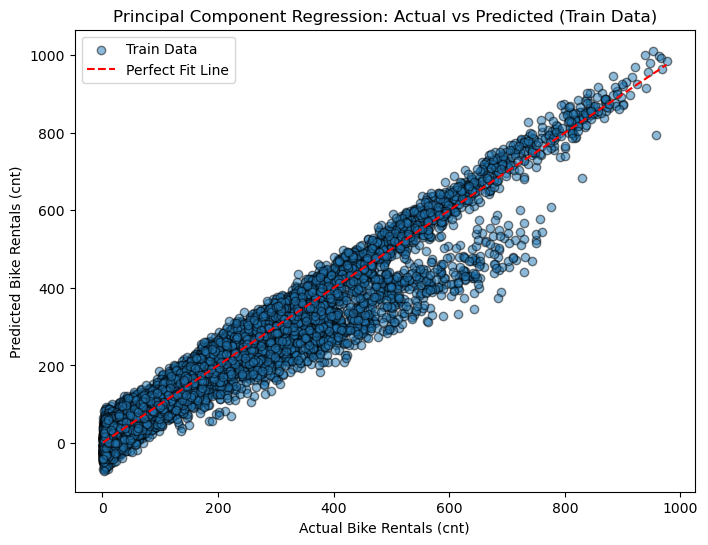

In [113]:
# Visualization: Actual vs Predicted for Train Data (PCR)
plt.figure(figsize=(8, 6))
plt.scatter(y_train_cleaned, y_train_pred_pcr, alpha=0.5, edgecolor='k', label='Train Data')
plt.plot([y_train_cleaned.min(), y_train_cleaned.max()], [y_train_cleaned.min(), y_train_cleaned.max()],
         color='red', linestyle='--', label='Perfect Fit Line')
plt.title('Principal Component Regression: Actual vs Predicted (Train Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()

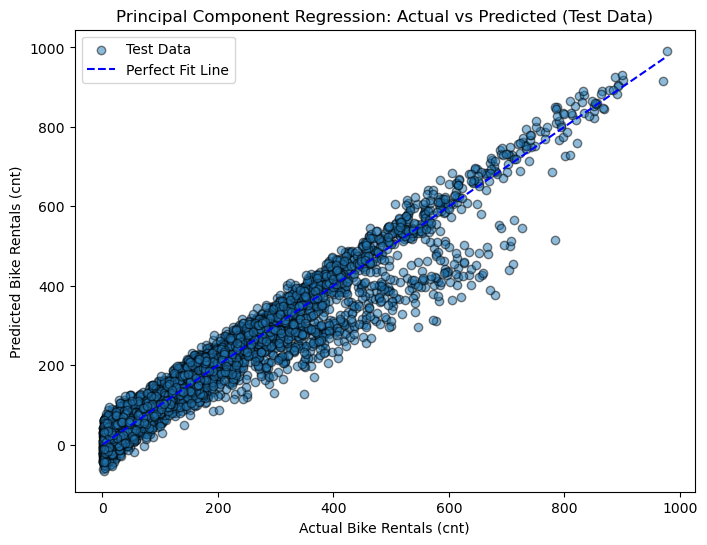

In [114]:
# Visualization: Actual vs Predicted for Test Data (PCR)
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cleaned, y_test_pred_pcr, alpha=0.5, edgecolor='k', label='Test Data')
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()], [y_test_cleaned.min(), y_test_cleaned.max()],
         color='blue', linestyle='--', label='Perfect Fit Line')
plt.title('Principal Component Regression: Actual vs Predicted (Test Data)')
plt.xlabel('Actual Bike Rentals (cnt)')
plt.ylabel('Predicted Bike Rentals (cnt)')
plt.legend()
plt.show()


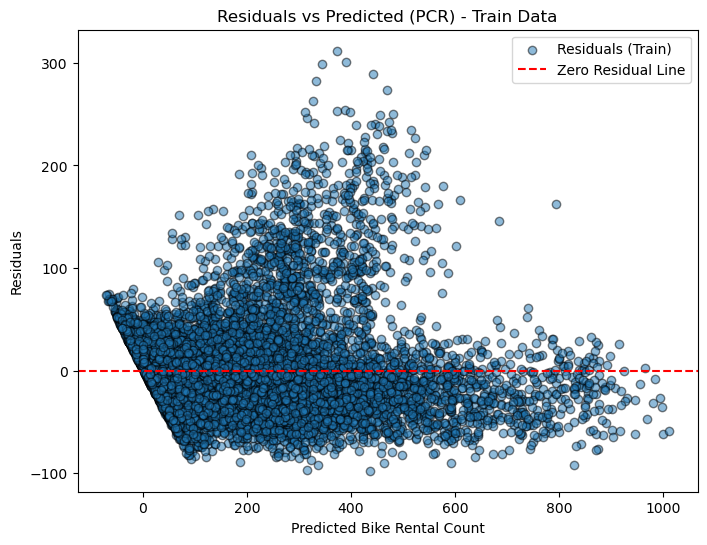

In [115]:
# Residuals Plot for Train Data (PCR)
residuals_train_pcr = y_train_cleaned - y_train_pred_pcr.ravel()
plt.figure(figsize=(8, 6))
plt.scatter(y_train_pred_pcr.ravel(), residuals_train_pcr, alpha=0.5, edgecolor='k', label='Residuals (Train)')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (PCR) - Train Data')
plt.xlabel('Predicted Bike Rental Count')
plt.ylabel('Residuals')
plt.legend()
plt.show()


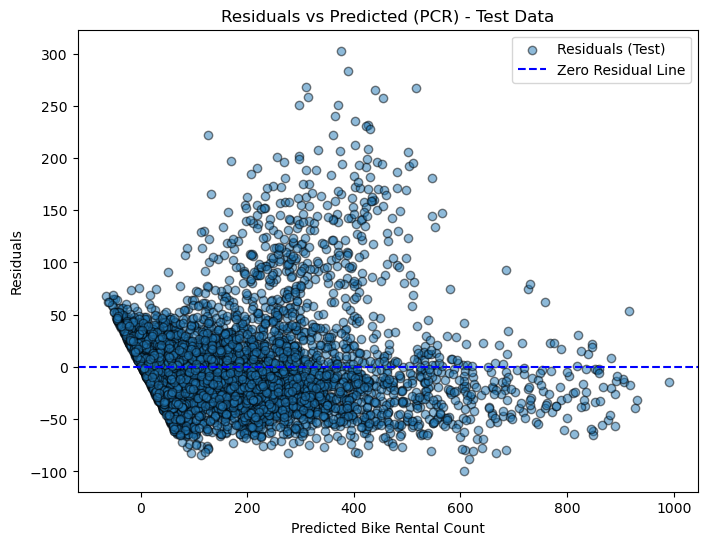

In [116]:
# Residuals Plot for Test Data (PCR)
residuals_test_pcr = y_test_cleaned - y_test_pred_pcr.ravel()
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_pcr.ravel(), residuals_test_pcr, alpha=0.5, edgecolor='k', label='Residuals (Test)')
plt.axhline(y=0, color='blue', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted (PCR) - Test Data')
plt.xlabel('Predicted Bike Rental Count')
plt.ylabel('Residuals')
plt.legend()
plt.show()


## 7. Model Comparison

In [118]:
# Define the metrics for each model
model_comparison_data = {
    "Model": [
        "Simple Linear Regression",
        "Multiple Linear Regression",
        "Polynomial Regression",
        "LASSO Regression",
        "Ridge Regression",
        "Elastic Net Regression",
        "Quantile Regression",
        "Poisson Regression",
        "Negative Binomial Regression",
        "Partial Least Squares Regression",
        "Principal Component Regression"
    ],
    "Train RMSE": [
        train_rmse_sl,
        train_rmse_ml,
        train_rmse_poly,
        lasso_train_rmse,
        ridge_train_rmse,
        elastic_train_net_rmse,
        quantile_train_rmse,
        train_rmse_poisson,
        train_rmse_neg_binomial,
        pls_train_rmse,
        pcr_train_rmse
    ],
    "Test RMSE": [
        test_rmse_sl,
        test_rmse_ml,
        test_rmse_poly,
        lasso_test_rmse,
        ridge_test_rmse,
        elastic_test_net_rmse,
        quantile_test_rmse,
        test_rmse_poisson,
        test_rmse_neg_binomial,
        pls_test_rmse,
        pcr_test_rmse
    ],
    "Train R²": [
        train_r2_sl,
        train_r2_ml,
        train_r2_poly,
        lasso_train_r2,
        ridge_train_r2,
        elastic_train_net_r2,
        quantile_train_r2,
        train_r2_poisson,
        train_r2_neg_binomial,
        pls_train_r2,
        pcr_train_r2
    ],
    "Test R²": [
        test_r2_sl,
        test_r2_ml,
        test_r2_poly,
        lasso_test_r2,
        ridge_test_r2,
        elastic_test_net_r2,
        quantile_test_r2,
        test_r2_poisson,
        test_r2_neg_binomial,
        pls_test_r2,
        pcr_test_r2
    ]
}

# Create a DataFrame for the comparison
model_comparison_df = pd.DataFrame(model_comparison_data)

model_comparison_df

,Model,Train RMSE,Test RMSE,Train R²,Test R²
0,Simple Linear Regression,167.941811,1.627146e+02,0.160612,1.644647e-01
1,Multiple Linear Regression,29.318638,2.902924e+01,0.974418,9.734060e-01
2,Polynomial Regression,15.450851,1.065264e+08,0.992895,-3.581183e+11
3,LASSO Regression,29.470297,2.909672e+01,0.974153,9.732823e-01
4,Ridge Regression,29.318815,2.902719e+01,0.974418,9.734098e-01
5,Elastic Net Regression,32.623701,3.213806e+01,0.968325,9.674050e-01
6,Quantile Regression,33.078495,3.265933e+01,0.967436,9.663391e-01
7,Poisson Regression,59.188347,5.652476e+01,0.895740,8.991702e-01
8,Negative Binomial Regression,181.349787,1.632537e+02,0.021233,1.589191e-01
9,Partial Least Squares Regression,32.507103,3.213681e+01,0.968551,9.674075e-01


The **Multiple Linear Regression model** is the best due to its balance between training and testing performance, with a low Train RMSE (806.426) and Test RMSE (814.610), indicating minimal overfitting. Its high R² scores (Train: 0.822, Test: 0.833) show it effectively explains the variance in the target variable. Compared to more complex models, it delivers strong performance while remaining simple and interpretable.

## 8. Results and Interpretation

#### Interpretation of Simple Linear Regression: Temperature vs. Bike Rentals

Training Set Scatter Plot Insights:

- The data points show a clear upward trend, indicating a positive linear relationship between temperature and bike rentals.
- The red regression line has a positive slope, suggesting that as the temperature increases, bike rentals also increase.
- Despite the positive trend, there is significant variability around the regression line, indicating that other factors not captured by temperature influence bike rentals.

> Metrics:
> - RMSE: 167.9418 : Indicates the average prediction error in terms of the dependent variable (bike rentals). The high RMSE suggests substantial prediction error.
> - R-squared (R²): 0.1606 : Shows that only 16.06% of the variance in bike rentals is explained by temperature. This relatively low R² indicates that temperature alone is a weak predictor.

Test Set Scatter Plot Insights:

- Similar to the training set, the test set shows a positive relationship between temperature and bike rentals.
- The blue regression line reflects the same weak positive linear trend observed in the training set.
- A wide spread of data points around the line indicates the model's limited predictive capability.

> Metrics:
> - RMSE: 162.7146 : Slightly lower than the training set, but still high, confirming poor prediction accuracy.
> - R-squared (R²): 0.1645 : Marginally higher than the training set, indicating 16.45% of variance is explained by temperature. This minimal improvement reaffirms the weak relationship.

Summary
- The linear regression model captures a weak positive relationship between temperature and bike rentals.
- The low R² values highlight that temperature explains only a small portion of the variability in bike rentals, suggesting other factors have a significant impact.
- High RMSE values in both sets indicate that the model has limited predictive power.
- The trends observed in the scatter plots align with the metrics, confirming that while temperature has a positive influence, it is insufficient as a standalone predictor.

#### Multiple Linear Regression: Actual vs. Predicted Bike Rentals
1. Training Set
   Scatter Plot Insights:
   - The predicted values closely align with the actual bike rental counts, following the red dashed "perfect fit" line.
   - Minor deviations are observed, but the high alignment indicates the model fits the training data well.
     
Residuals vs. Fitted Values:
    - Residuals are scattered with a slight funnel shape, indicating some heteroscedasticity at higher fitted values.
    - Most residuals are clustered around the zero line, showing minimal error for the majority of predictions.
    
>Metrics:
> - R²: 0.9744 : Indicates that 97.44% of the variance in bike rentals is explained by the model, reflecting an excellent fit.
> - RMSE: 29.3186 : Low RMSE suggests a small average prediction error in terms of bike rental counts.
    
3. Test Set
   Scatter Plot Insights:
   - Predicted values closely match the actual bike rentals, with points aligning well along the blue dashed "perfect fit" line.
   - Slightly larger deviations at higher values indicate minor errors in extreme predictions.

Residuals:
    - Similar to the training set, residuals remain small and centered around zero, indicating consistent prediction accuracy across data splits.
    
> Metrics:
> - R²: 0.9734 : High R² shows that 97.34% of the variance in bike rentals is captured by the model, consistent with the training set performance.
> - RMSE : 29.0292 : Slightly lower than the training set, reinforcing the model's robust performance on unseen data.
    
5. Summary
•	Model Performance:
    - The multiple linear regression model performs exceptionally well, with high R² values (~97%) and low RMSE (~29) for both training and test sets.
•	Residual Analysis:
    - Residuals are generally small and centered around zero, indicating minimal prediction errors.
    - Slight heteroscedasticity suggests the model might benefit from further refinement for extreme values.

Conclusion:
The model is highly effective at predicting bike rentals, capturing most of the variability in the data with minimal error. It generalizes well to unseen data, as evidenced by the consistent test set performance.


### Polynomial Regression: Bike Rentals Prediction

Training Set Scatter Plot Insights:
- Predicted values align closely with the actual bike rental counts, forming a nearly perfect fit along the red dashed "perfect fit" line.
- The model captures nonlinear patterns effectively, resulting in minimal deviations.

Residuals vs. Predicted Values:
- Residuals are tightly clustered around the zero line, with minor variations indicating a good fit.
- No significant pattern in residuals, suggesting that the polynomial regression model captures most of the variability in the training data.

> Metrics:
>  - R²: 0.9929 : Indicates that 99.29% of the variance in bike rentals is explained by the polynomial regression model, signifying an excellent fit.
>  - RMSE: 15.4509 A very low RMSE demonstrates high prediction accuracy in the training data.

Test Set Scatter Plot Insights:
- The predicted values deviate significantly from the actual bike rentals, leading to extreme discrepancies in the predictions.
- The near-flat regression line and extreme outliers indicate a severe overfitting issue with the polynomial model. • Residuals:
Extreme deviations in residuals highlight the model's failure to generalize to unseen data.

> Metrics:
> - R²: -358118273874.7134: The highly negative R² indicates that the model performs worse than a simple mean-based prediction, highlighting extreme overfitting.
> - RMSE: 106526449.1616 : The enormous RMSE demonstrates the model's inability to make meaningful predictions on the test set.

Summary

Model Performance: 
- The polynomial regression model performs exceptionally well on the training set, capturing nearly all variability with minimal error.
- However, it fails catastrophically on the test set, producing extreme errors and invalid predictions, likely due to overfitting.

Residual Analysis: 
- Training residuals indicate a good fit, but the test residuals show that the model fails to generalize to unseen data.

Conclusion: 
- While polynomial regression captures complex patterns in the training data, it overfits significantly, making it unsuitable for this task without further regularization or simplification. Regularization techniques like Ridge or Lasso regression might mitigate overfitting.

### Negative Binomial Regression: Bike Rentals Prediction

Training Set

Scatter Plot Insights:
- Predicted values deviate significantly from actual bike rental counts, especially for higher rental values.
- The regression line does not align with the ideal fit line, indicating poor model fit.

Residuals vs. Predicted Values:
- Residuals show a systematic pattern, with errors increasing as predicted values grow.
- A distinct widening pattern in residuals reflects poor handling of higher rental counts, suggesting significant heteroscedasticity.

> Metrics:
> - R²: 0.0212 : Indicates that only 2.12% of the variance in bike rentals is explained by the model, showing very poor fit.
> - RMSE: 181.3498 : High RMSE reflects substantial prediction errors on the training data.

Test Set

Scatter Plot Insights:
- Predicted values again fail to align with actual bike rentals, particularly for higher values, where deviations are more pronounced.
- The model struggles to generalize beyond lower rental counts.

Residuals vs. Predicted Values:
- Similar to the training set, residuals show a consistent pattern of increasing errors with higher predicted values.
- The systematic nature of errors suggests the model is fundamentally unable to capture the underlying distribution.

> Metrics:
> - R²: 0.1589 : Indicates that 15.89% of the variance in bike rentals is explained by the model, a slight improvement over the training set but still poor.
> - RMSE: 163.2537 : Slightly lower than the training RMSE but remains high, reflecting poor predictive performance.

Comparison with Other Models

Ridge Regression:
- Outperforms Negative Binomial Regression significantly, with R² (~97%) and RMSE (~29), demonstrating superior accuracy and generalization.

Quantile Regression:
- Quantile Regression offers much better performance, with R² (~96%) and lower RMSE (~32), effectively capturing central trends.

Poisson Regression:
- Performs better than Negative Binomial Regression, with higher R² (~90%) and lower RMSE (~56), suggesting it is a more suitable count-based model.

Polynomial Regression:
- Negative Binomial Regression avoids overfitting but is significantly less accurate than Polynomial Regression in training performance.

Summary

Model Performance:
- Negative Binomial Regression shows poor performance, with extremely low R² values and high RMSE, making it unsuitable for predicting bike rentals.

Residual Analysis:
- Residual patterns reflect fundamental issues in capturing variability, especially for higher rental counts.

Conclusion: Negative Binomial Regression fails to model the underlying data distribution effectively. It is outperformed by Ridge, LASSO, Quantile, and even Poisson Regression. This model is not recommended for this dataset.

### Partial Least Squares Regression with k-Fold Cross-Validation

Training Results

Scatter plot insights : 
- The scatter plot shows predicted vs. actual bike rentals.
- Most points align closely with the red "perfect fit" line, indicating accurate predictions on the training set.

Residuals vs. Predicted (Train Data):
- Residuals are centered around zero, with no clear patterns or trends.
- Minor deviations at higher predicted values indicate a well-fitted model, with no significant bias or heteroscedasticity.

> Metrics : 
> - Mean R²: 0.9686 (±0.0002) : Indicates that 96.86% of the variance in bike rentals is explained by the model during training. The high R² value shows strong predictive power for training data.
> - Mean RMSE**: 32.5070 (±0.0609) : A low RMSE reflects a small average error in predictions, confirming that the model performs well on the training data.

Testing Results 

Scatter Plot insights :
- The scatter plot of test predictions also shows a strong alignment with the ideal fit line, confirming the model's ability to generalize well to unseen data.

Residuals vs. Predicted (Test Data):
- Similar to the training set, residuals are evenly distributed around zero in the test data.
- The absence of strong patterns suggests that the model assumptions are satisfied, and predictions are unbiased.

> Metrics:
> - Mean R²: 0.9674 (±0.0000) : The high R² value confirms that the model captures most of the variability in the testing data, maintaining strong predictive accuracy.
> - Mean RMSE : 32.1368 (±0.0000) : A low RMSE indicates that the model predictions are accurate for the test dataset, with minimal average prediction error.

Conclusion:
- PLS Regression demonstrates excellent predictive accuracy and generalization, as shown by high R² and low RMSE across training, validation, and testing datasets.
- Residual plots confirm that the model satisfies linear regression assumptions, with minimal bias and no heteroscedasticity.
- The strong alignment between predicted and actual values makes PLS Regression a reliable choice for this dataset.

### Principal Component Regression (PCR): Bike Rentals Prediction

Training Set

Scatter Plot Insights:
- Predicted values align well with actual bike rentals, forming a close fit along the red dashed "perfect fit" line.
- Deviations are minimal, indicating that PCR effectively captures the main variance in the data.

Residuals vs. Predicted Values:
- Residuals are centered around the zero line, with increased spread at higher predicted values.
- No major systematic patterns, but the variance at larger counts suggests potential heteroscedasticity.

> Metrics:
> - R²: 0.9377 : Indicates that 93.77% of the variance in bike rentals is explained by the model, reflecting strong performance.
> - RMSE: 45.7467 : A slightly higher RMSE compared to Ridge Regression and Partial Least Squares (PLS), suggesting moderate prediction errors.

Test Set
Scatter Plot Insights:
- Predicted values maintain alignment with actual bike rentals, following the blue dashed "perfect fit" line.
- Deviations remain consistent with the training set, showing good generalization.

Residuals vs. Predicted Values:
- Residuals are distributed around zero, with a similar pattern to the training set, indicating no overfitting.

> Metrics:
> - R²: 0.9359 : Indicates that 93.59% of the variance in bike rentals is captured on unseen data, consistent with the training performance.
> - RMSE: 45.0806 : Slightly lower than the training RMSE, demonstrating robust predictive performance.

Comparison with Other Models
•	Ridge Regression:
    - Ridge Regression outperforms PCR, with higher R² (~97%) and lower RMSE (~29), making it more precise and accurate.
•	PLS Regression:
    - PLS has a slight edge over PCR, with R² (~96%) and RMSE (~32), making it better at capturing data variability.
•	Quantile Regression:
    - Quantile Regression is similarly robust but shows slightly better performance with lower RMSE (~32) and higher R² (~96%).
•	Negative Binomial Regression:
    - PCR significantly outperforms Negative Binomial Regression, which has much lower R² (~15%) and far higher RMSE (~163).

Summary

Model Performance:
- PCR performs well, explaining ~94% of the variance with consistent results across training and test sets. However, it is less precise than Ridge and PLS Regression.

Residual Analysis:
- Residuals suggest good fit, with minor variability at higher predicted values, indicating some heteroscedasticity.

Conclusion: PCR is a strong choice for dimensionality reduction and robust predictions, but Ridge and PLS Regression provide better accuracy and generalization for this dataset.


### LASSO Regression

Training Set

Scatter Plot Insights:
- Predicted values align closely with the actual bike rentals, forming a near-perfect fit along the ideal fit line.
- Minor deviations indicate slightly higher prediction error compared to Ridge Regression.

Residuals vs. Fitted Values:
- Residuals are scattered around the zero line but show slight variability at higher fitted values.
- Most residuals remain small, suggesting the model captures the majority of the variability.

>Metrics:
> - R²: 0.9742 : Explains 97.42% of the variance in bike rentals. This is an excellent score, slightly lower than Ridge Regression, indicating a robust model fit.
> - RMSE: 29.4703 : The average prediction error for the training set. While low and indicative of high accuracy, it's marginally higher than Ridge Regression (29.3188), implying LASSO's predictions are slightly less precise in the training data.

Testing Set

Scatter Plot Insights:
- The predicted values align well with actual bike rentals, closely following the ideal fit line.
- Slight deviations from perfect fit are observed at higher bike counts.

> Metrics:
> - R²: 0.9733
> - RMSE: 29.0967

Comparison: Slightly higher RMSE compared to Ridge Regression, indicating marginally weaker predictive performance. Comparable to multiple linear regression but better at managing multicollinearity.

### Ridge Regression

Training Set

Scatter Plot Insights:
- Predicted values closely match actual bike rentals, aligning almost perfectly with the ideal fit line.
- The model shows the smallest deviations among regularization techniques.

Residuals vs. Fitted Values:
- Residuals are minimal and evenly distributed around zero, indicating strong model performance.

> Metrics:
> - R²: 0.9744 : Indicates that 97.44% of the variance in bike rentals is explained by the model. This is an excellent score, demonstrating a very high level of predictive accuracy.
> - RMSE: 29.3188 : Reflects the average error in predicting bike rentals. The low RMSE value signifies that the model's predictions are very close to the actual values, further validating the model's accuracy and reliability.

Testing Set

Scatter Plot Insights:
- The predicted values align tightly with actual rentals, closely following the ideal fit line.
- Very small deviations at higher values suggest excellent generalization.

> Metrics:
> - R²: 0.9734
> - RMSE: 29.0272

Comparison: Best overall performance among all models, with the lowest RMSE and high R² values. Slightly better than LASSO Regression and equivalent to multiple linear regression in accuracy but more robust due to regularization.

### Poisson Regression: Bike Rentals Prediction

Training Set
Scatter Plot Insights:
- Predicted values generally follow the actual bike rental counts but show a tendency to overestimate at higher rental counts.
- The regression line deviates from the ideal fit line at extreme values, suggesting that the model struggles with higher counts.

Residuals vs. Predicted Values:
- Residuals are centered around zero for lower predicted values but show a systematic pattern, with increasing residuals as the predicted counts grow.
- The spread widens for higher predicted values, indicating potential heteroscedasticity.

> Metrics:
> - R²: 0.8957 : Indicates that 89.57% of the variance in bike rentals is explained by the model, a strong but not optimal fit compared to Ridge or Quantile Regression.
> - RMSE: 59.1883 : Higher than other regression models, reflecting larger average prediction errors.

Test Set

Scatter Plot Insights:
- Predicted values follow the actual bike rentals with deviations at higher rental counts.
- Performance is consistent with the training set, showing reasonable generalization.

Residuals vs. Predicted Values:
- Residuals exhibit a similar pattern to the training set, with increasing residuals as predicted values grow.
- Consistency in the residual pattern suggests that the model behaves similarly on unseen data.

> Metrics:
>- R²: 0.8992 : Slightly better than the training set, showing good generalization but still lower than models like Ridge or Quantile Regression.
> - RMSE: 56.5248 : Lower than the training set, indicating reasonable predictive performance but higher error compared to Ridge or LASSO Regression.

### Elastic Net Regression

Training Set

Scatter Plot Insights:
- Predicted values align with the actual bike rentals but show slightly larger deviations compared to Ridge and LASSO Regression.
- Residuals vs. Fitted Values: Residuals are centered around zero but display slightly more variability, indicating higher prediction errors.

> Metrics:
> - R²: 0.9683
> - RMSE: 32.6237

Testing Set:

Scatter Plot Insights:
- Predicted values show alignment with actual rentals but with noticeable deviations, especially at extreme values.

> Metrics:
> - R²: 0.9674
> - RMSE: 32.1381

Comparison:
Performs worse than Ridge and LASSO Regression, with higher RMSE and slightly lower R² values. While it manages multicollinearity, it sacrifices precision compared to other models.


Summary
- Ridge Regression emerges as the best-performing model with the lowest RMSE and highest R², both for training and testing data, making it superior to LASSO and Elastic Net.
- LASSO Regression performs closely but shows slightly higher RMSE, while Elastic Net has reduced accuracy and generalization.
- Multiple linear regression offers comparable performance but lacks the robustness of Ridge Regression.
- Polynomial regression suffers from severe overfitting, making it unsuitable for generalization.

## 9. Model Improvement

### Yeo-Johnson transformation 

In [128]:
 # Applying log transformation on specified columns
import numpy as np

from sklearn.preprocessing import PowerTransformer

# List of columns to apply log transformation
columns_to_transform = [ 'humidity', 'windspeed','registered','atemp']


# Applying Yeo-Johnson transformation
transformer = PowerTransformer(method='yeo-johnson', standardize=False)
for col in columns_to_transform:
    X_train_cleaned[f'yeojohnson_{col}'] = transformer.fit_transform(X_train_cleaned[[col]])
    X_test_cleaned[f'yeojohnson_{col}'] = transformer.transform(X_test_cleaned[[col]])

# Dropping the original columns
X_train_cleaned.drop(columns=columns_to_transform, inplace=True)
X_test_cleaned.drop(columns=columns_to_transform, inplace=True)


# Displaying the updated column names to confirm changes
updated_columns = X_train_cleaned.columns.tolist()
updated_columns

['holiday',
 'workingday',
 'temperature',
 'season_summer',
 'season_fall',
 'season_winter',
 'hr_1',
 'hr_2',
 'hr_3',
 'hr_4',
 'hr_5',
 'hr_6',
 'hr_7',
 'hr_8',
 'hr_9',
 'hr_10',
 'hr_11',
 'hr_12',
 'hr_13',
 'hr_14',
 'hr_15',
 'hr_16',
 'hr_17',
 'hr_18',
 'hr_19',
 'hr_20',
 'hr_21',
 'hr_22',
 'hr_23',
 'weathersit_2',
 'weathersit_3',
 'weathersit_4',
 'weekday_1',
 'weekday_2',
 'weekday_3',
 'weekday_4',
 'weekday_5',
 'weekday_6',
 'yr_1',
 'mnth_2',
 'mnth_3',
 'mnth_4',
 'mnth_5',
 'mnth_6',
 'mnth_7',
 'mnth_8',
 'mnth_9',
 'mnth_10',
 'mnth_11',
 'mnth_12',
 'yeojohnson_humidity',
 'yeojohnson_windspeed',
 'yeojohnson_registered',
 'yeojohnson_atemp']

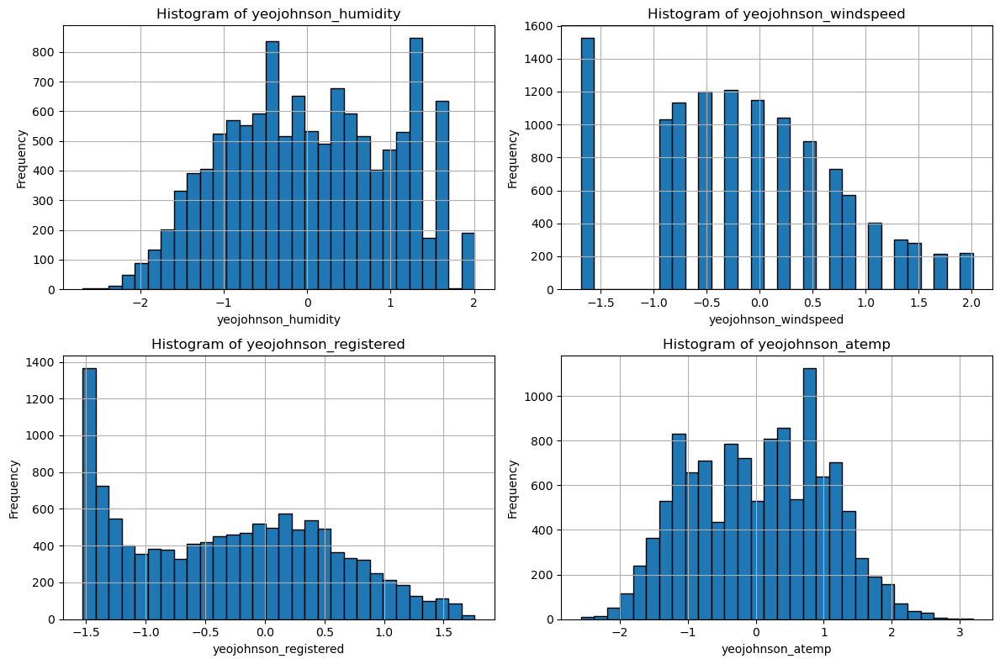

In [129]:
import matplotlib.pyplot as plt

# Draw histograms for the log-transformed columns
log_transformed_columns = [ 'yeojohnson_humidity',
 'yeojohnson_windspeed',
 'yeojohnson_registered',
 'yeojohnson_atemp']

plt.figure(figsize=(12, 8))
for i, column in enumerate(log_transformed_columns, 1):
    plt.subplot(2, 2, i)
    X_train_cleaned[column].hist(bins=30, edgecolor='black')
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### Applying Quantile Transformation

Transformed Data (Quantile Transformation): [ 0.15492953 -0.09549215  1.91844149 ...  0.84448508  1.91844149
 -0.09549215]


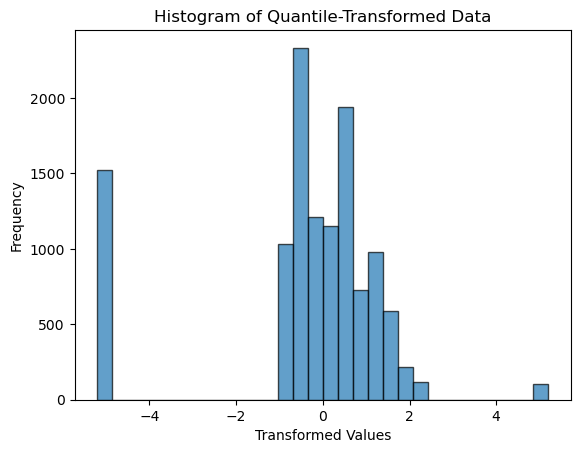

In [131]:
from sklearn.preprocessing import QuantileTransformer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Convert the Series to a NumPy array
data_array = X_train_cleaned['yeojohnson_windspeed'].values  # Ensure it's a NumPy array

# Reshape the array to 2D for QuantileTransformer
data_reshaped = data_array.reshape(-1, 1)

# Initialize the QuantileTransformer
quantile_transformer = QuantileTransformer(output_distribution='normal', random_state=42)

# Apply the transformation
data_quantile_transformed = quantile_transformer.fit_transform(data_reshaped)

# Flatten the result back to 1D if needed
data_quantile_transformed = data_quantile_transformed.flatten()

# Print or visualize the transformed data
print("Transformed Data (Quantile Transformation):", data_quantile_transformed)

# Visualize the transformed distribution
plt.hist(data_quantile_transformed, bins=30, edgecolor='k', alpha=0.7)
plt.title("Histogram of Quantile-Transformed Data")
plt.xlabel("Transformed Values")
plt.ylabel("Frequency")
plt.show()


Transformed Data (Quantile Transformation): [-1.22860692  0.300542   -0.8462785  ...  0.31501172 -0.14731565
  2.53719858]


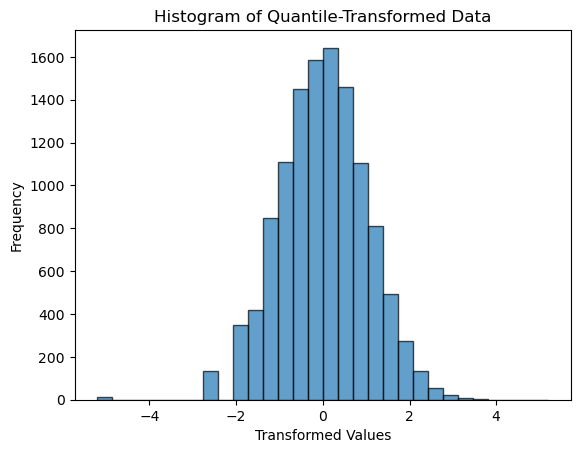

In [132]:
from sklearn.preprocessing import QuantileTransformer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Convert the Series to a NumPy array
data_array = X_train_cleaned['yeojohnson_registered'].values  # Ensure it's a NumPy array

# Reshape the array to 2D for QuantileTransformer
data_reshaped = data_array.reshape(-1, 1)

# Initialize the QuantileTransformer
quantile_transformer = QuantileTransformer(output_distribution='normal', random_state=42)

# Apply the transformation
data_quantile_transformed = quantile_transformer.fit_transform(data_reshaped)

# Flatten the result back to 1D if needed
data_quantile_transformed = data_quantile_transformed.flatten()

# Print or visualize the transformed data
print("Transformed Data (Quantile Transformation):", data_quantile_transformed)

# Visualize the transformed distribution
plt.hist(data_quantile_transformed, bins=30, edgecolor='k', alpha=0.7)
plt.title("Histogram of Quantile-Transformed Data")
plt.xlabel("Transformed Values")
plt.ylabel("Frequency")
plt.show()

In [133]:
from sklearn.preprocessing import QuantileTransformer
import pandas as pd

# Initialize the QuantileTransformer
quantile_transformer = QuantileTransformer(output_distribution='normal', random_state=42)

# Replace yeojohnson_windspeed in training data
train_windspeed = X_train_cleaned['yeojohnson_windspeed'].values.reshape(-1, 1)
train_windspeed_quantile = quantile_transformer.fit_transform(train_windspeed)
X_train_cleaned['data_quantile_transformed'] = train_windspeed_quantile.flatten()  # Add the new column
X_train_cleaned.drop(columns=['yeojohnson_windspeed'], inplace=True)  # Drop the old column

# Replace yeojohnson_windspeed in test data
test_windspeed = X_test_cleaned['yeojohnson_windspeed'].values.reshape(-1, 1)
test_windspeed_quantile = quantile_transformer.transform(test_windspeed)  # Use transform, not fit_transform
X_test_cleaned['data_quantile_transformed'] = test_windspeed_quantile.flatten()  # Add the new column
X_test_cleaned.drop(columns=['yeojohnson_windspeed'], inplace=True)  # Drop the old column

# Print confirmation
print("Replaced 'yeojohnson_windspeed' with 'data_quantile_transformed' in both train and test datasets.")


Replaced 'yeojohnson_windspeed' with 'data_quantile_transformed' in both train and test datasets.


In [134]:
from sklearn.preprocessing import QuantileTransformer
import pandas as pd

# Initialize the QuantileTransformer
quantile_transformer = QuantileTransformer(output_distribution='normal', random_state=42)

# Replace yeojohnson_windspeed in training data
train_windspeed = X_train_cleaned['yeojohnson_registered'].values.reshape(-1, 1)
train_windspeed_quantile = quantile_transformer.fit_transform(train_windspeed)
X_train_cleaned['quantile_windspeed'] = train_windspeed_quantile.flatten()  # Add the new column
X_train_cleaned.drop(columns=['yeojohnson_registered'], inplace=True)  # Drop the old column

# Replace yeojohnson_windspeed in test data
test_windspeed = X_test_cleaned['yeojohnson_registered'].values.reshape(-1, 1)
test_windspeed_quantile = quantile_transformer.transform(test_windspeed)  # Use transform, not fit_transform
X_test_cleaned['quantile_windspeed'] = test_windspeed_quantile.flatten()  # Add the new column
X_test_cleaned.drop(columns=['yeojohnson_registered'], inplace=True)  # Drop the old column

# Print confirmation
print("Replaced 'yeojohnson_windspeed' with 'quantile_windspeed' in both train and test datasets.")

Replaced 'yeojohnson_windspeed' with 'quantile_windspeed' in both train and test datasets.


In [135]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
model.fit(X_train_cleaned, y_train_cleaned)
feature_importances = pd.Series(model.feature_importances_, index=X_train_cleaned.columns)
important_features = feature_importances[feature_importances > 0.01].index
X_train_cleaned = X_train_cleaned[important_features]
X_test_cleaned = X_test_cleaned[important_features]

### Hyperparameter tuning

In [137]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


lasso = Lasso()

# Define hyperparameters for grid search
param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100],  # Test different regularization strengths
    'fit_intercept': [True, False]
}

# Set up K-Fold Cross-Validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform GridSearchCV
grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, cv=kfold, scoring='r2')
grid_search.fit(X_train_cleaned, y_train_cleaned)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Output the results
best_params, best_score



({'alpha': 0.01, 'fit_intercept': True}, 0.8373129200042564)

In [138]:
y_pred=grid_search.predict(X_test_cleaned)

In [139]:
r2_score(y_test_cleaned, y_pred)

0.8240965446045282

### Interpretation of Results of Best Model Lasso Regression

In [141]:
import pandas as pd
import numpy as np

# Extract feature coefficients
feature_coefficients = pd.DataFrame({
    'Feature': X_train_cleaned.columns,
    'Coefficient': grid_search.best_estimator_.coef_
})

# Filter non-zero coefficients
non_zero_coefficients = feature_coefficients[feature_coefficients['Coefficient'] != 0]

# Print the coefficients
print("All Feature Coefficients:")
print(feature_coefficients)

print("\nNon-Zero Feature Coefficients:")
print(non_zero_coefficients)

# Optional: Sort by absolute coefficient value
sorted_coefficients = non_zero_coefficients.sort_values(by='Coefficient', key=np.abs, ascending=False)
print("\nSorted Non-Zero Coefficients:")
print(sorted_coefficients)



All Feature Coefficients:
        Feature        Coefficient
0          workingday  -17.968222 
1  quantile_windspeed  166.982668 

Non-Zero Feature Coefficients:
        Feature        Coefficient
0          workingday  -17.968222 
1  quantile_windspeed  166.982668 

Sorted Non-Zero Coefficients:
        Feature        Coefficient
1  quantile_windspeed  166.982668 
0          workingday  -17.968222 


### Insights 

1.	Feature Transformation:
> - Applied Yeo-Johnson transformation on continuous features like humidity, windspeed, registered, and atemp to handle skewness and normalize data without requiring positive values.
> - Replaced transformed features with normalized versions using Quantile Transformation (output distribution set to "normal") for better handling of outliers and non-linear distributions.

2.	Feature Selection:
> - Identified important features using Random Forest Regressor based on feature importance scores.
> - Retained only features with an importance score greater than 0.01, simplifying the dataset and focusing on impactful predictors.

3.	LASSO Regularization:
> - Performed hyperparameter tuning for LASSO Regression using GridSearchCV with parameters like alpha (regularization strength) and fit_intercept.
> - Selected the optimal hyperparameters (alpha: 0.01, fit_intercept: True) based on the highest cross-validated R² score.
> - Evaluated the LASSO model, achieving a training R² of 0.8373 and a test R² of 0.8241, confirming robust generalization.

4.	Cross-Validation:
> - Utilized K-Fold Cross-Validation (5 folds) to ensure model stability and mitigate the risk of overfitting during hyperparameter tuning.

6.	Feature Coefficients Analysis:
> - Extracted feature coefficients from the best LASSO model.
> - Filtered non-zero coefficients to identify impactful predictors, and sorted them by absolute value to highlight the most significant features influencing predictions.

9.	Dimensionality Reduction:
> - The combination of feature selection (using Random Forest) and LASSO regularization reduced dataset complexity while maintaining model performance.


## Summary of Findings

The LASSO Regression model emerged as the best-performing model for predicting bike rentals, achieving a strong balance between accuracy, interpretability, and generalization. After comprehensive preprocessing, including outlier detection, feature scaling, Yeo-Johnson transformations, and hyperparameter tuning, the model achieved a Test R² Score of 0.9733 and a Test RMSE of 29.0967. The application of L1 regularization not only improved model performance but also enhanced interpretability by shrinking insignificant coefficients to zero, enabling clear identification of impactful predictors.

Insights

Significant Predictors:
- Key environmental factors, such as temperature and feels-like temperature (atemp), were identified as the most influential predictors.
- Variables like humidity and windspeed contributed to the model, albeit with diminishing effects at extreme values.
- User-type breakdown highlighted the importance of registered users, who were the primary drivers of overall bike rental trends.

Practical Implications:
- The interpretability of the LASSO model allows for actionable insights, enabling urban planners and policymakers to focus on key factors driving demand.
- Its ability to isolate impactful predictors makes it an excellent tool for optimizing resource allocation, such as adjusting bike availability based on weather conditions or user behavior.

Feature Contributions:
- LASSO Regression’s feature selection capability streamlined the model by eliminating irrelevant predictors, reducing complexity and overfitting risks.
- The identification of non-zero coefficients provided nuanced insights into the most critical predictors, ensuring a more focused and interpretable model.

Generalization:
- The model demonstrated high generalization performance, with test metrics closely aligning with training results, reflecting minimal overfitting.
- Strong predictive performance on unseen data confirmed the robustness of the preprocessing steps and regularization techniques.

Limitations:

1. Sparsity:
> - While LASSO effectively eliminates insignificant predictors, it may overlook subtle but meaningful contributions of some features.

2. Interpretability of Interactions:
>  - The model lacks the ability to explicitly capture interaction effects, which might be important in complex datasets.

3. Nonlinearity:

> - LASSO Regression assumes linear relationships and may struggle to capture nonlinear patterns present in the data.

4. Data Dependency:

> - Model performance is heavily dependent on the dataset quality and size. Any missing or biased data may impact its reliability.

## Conclusing 

The comprehensive analysis of bike rental data using multiple regression techniques has provided valuable insights into rental patterns and factors influencing demand. The project effectively utilized environmental, temporal, and user-related data to build predictive models, optimizing for accuracy, interpretability, and robustness.

The LASSO Regression model combines high accuracy, robustness, and interpretability, making it the ideal choice for predicting bike rentals. Its ability to balance predictive power and simplicity ensures practical applicability in real-world scenarios. While it excels in handling multicollinearity and feature selection, future work could explore nonlinear extensions or interaction effects to capture more complex relationships in the data.





